In [0]:
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np


Using TensorFlow backend.


In [0]:
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = fashion_mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.671252, acc.: 48.44%] [G loss: 0.449410]


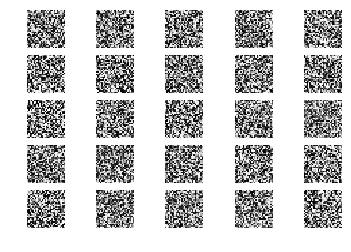

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.524119, acc.: 60.94%] [G loss: 0.496890]
2 [D loss: 0.480718, acc.: 60.94%] [G loss: 0.636467]
3 [D loss: 0.371431, acc.: 78.12%] [G loss: 0.817250]
4 [D loss: 0.332969, acc.: 84.38%] [G loss: 0.916246]
5 [D loss: 0.304307, acc.: 90.62%] [G loss: 1.044997]
6 [D loss: 0.233874, acc.: 93.75%] [G loss: 1.198024]
7 [D loss: 0.220450, acc.: 98.44%] [G loss: 1.343657]
8 [D loss: 0.191358, acc.: 95.31%] [G loss: 1.394756]
9 [D loss: 0.166255, acc.: 98.44%] [G loss: 1.483282]
10 [D loss: 0.148815, acc.: 100.00%] [G loss: 1.653856]
11 [D loss: 0.123250, acc.: 100.00%] [G loss: 1.708189]
12 [D loss: 0.117905, acc.: 100.00%] [G loss: 1.802813]
13 [D loss: 0.115032, acc.: 100.00%] [G loss: 1.909301]
14 [D loss: 0.097183, acc.: 100.00%] [G loss: 1.924140]
15 [D loss: 0.099137, acc.: 100.00%] [G loss: 2.008338]
16 [D loss: 0.090364, acc.: 100.00%] [G loss: 2.203744]
17 [D loss: 0.085939, acc.: 100.00%] [G loss: 2.146412]
18 [D loss: 0.078029, acc.: 100.00%] [G loss: 2.221037]
19 [D loss

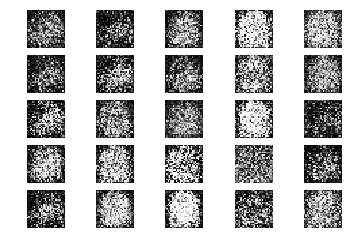

201 [D loss: 0.274968, acc.: 87.50%] [G loss: 3.756607]
202 [D loss: 0.410181, acc.: 85.94%] [G loss: 3.208354]
203 [D loss: 0.233098, acc.: 93.75%] [G loss: 3.199854]
204 [D loss: 0.697969, acc.: 64.06%] [G loss: 2.332121]
205 [D loss: 0.275713, acc.: 82.81%] [G loss: 3.522847]
206 [D loss: 0.229458, acc.: 95.31%] [G loss: 2.993975]
207 [D loss: 0.301094, acc.: 82.81%] [G loss: 3.208776]
208 [D loss: 0.243699, acc.: 90.62%] [G loss: 3.455213]
209 [D loss: 0.853065, acc.: 79.69%] [G loss: 2.528726]
210 [D loss: 0.382223, acc.: 84.38%] [G loss: 2.807556]
211 [D loss: 0.328504, acc.: 87.50%] [G loss: 2.842983]
212 [D loss: 0.766232, acc.: 70.31%] [G loss: 2.138638]
213 [D loss: 0.473649, acc.: 82.81%] [G loss: 2.199545]
214 [D loss: 0.311714, acc.: 87.50%] [G loss: 2.233128]
215 [D loss: 0.409326, acc.: 87.50%] [G loss: 2.731690]
216 [D loss: 0.918774, acc.: 43.75%] [G loss: 2.050401]
217 [D loss: 0.346825, acc.: 89.06%] [G loss: 3.063893]
218 [D loss: 0.455737, acc.: 85.94%] [G loss: 2.

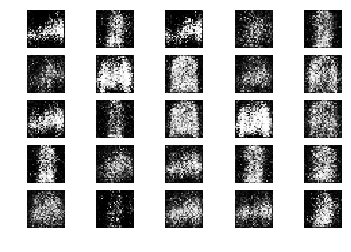

401 [D loss: 0.685522, acc.: 57.81%] [G loss: 1.032080]
402 [D loss: 0.689017, acc.: 64.06%] [G loss: 0.981275]
403 [D loss: 0.685867, acc.: 67.19%] [G loss: 0.985034]
404 [D loss: 0.623114, acc.: 57.81%] [G loss: 1.015186]
405 [D loss: 0.613164, acc.: 62.50%] [G loss: 1.038826]
406 [D loss: 0.728308, acc.: 51.56%] [G loss: 1.004281]
407 [D loss: 0.734941, acc.: 56.25%] [G loss: 1.059368]
408 [D loss: 0.610586, acc.: 71.88%] [G loss: 0.998229]
409 [D loss: 0.590835, acc.: 71.88%] [G loss: 1.013300]
410 [D loss: 0.671468, acc.: 59.38%] [G loss: 1.020976]
411 [D loss: 0.641388, acc.: 68.75%] [G loss: 1.017356]
412 [D loss: 0.604831, acc.: 68.75%] [G loss: 1.084533]
413 [D loss: 0.696922, acc.: 56.25%] [G loss: 0.922219]
414 [D loss: 0.593503, acc.: 68.75%] [G loss: 1.048430]
415 [D loss: 0.526523, acc.: 73.44%] [G loss: 1.026641]
416 [D loss: 0.824286, acc.: 53.12%] [G loss: 0.889011]
417 [D loss: 0.592710, acc.: 71.88%] [G loss: 0.930527]
418 [D loss: 0.581738, acc.: 71.88%] [G loss: 0.

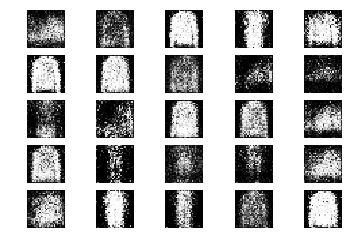

601 [D loss: 0.668590, acc.: 54.69%] [G loss: 0.860155]
602 [D loss: 0.645781, acc.: 68.75%] [G loss: 0.780142]
603 [D loss: 0.668875, acc.: 57.81%] [G loss: 0.842243]
604 [D loss: 0.615230, acc.: 70.31%] [G loss: 0.862766]
605 [D loss: 0.669666, acc.: 65.62%] [G loss: 0.822659]
606 [D loss: 0.702192, acc.: 54.69%] [G loss: 0.845878]
607 [D loss: 0.658950, acc.: 53.12%] [G loss: 0.835204]
608 [D loss: 0.605488, acc.: 71.88%] [G loss: 0.871899]
609 [D loss: 0.693505, acc.: 54.69%] [G loss: 0.823017]
610 [D loss: 0.693760, acc.: 51.56%] [G loss: 0.847216]
611 [D loss: 0.684750, acc.: 53.12%] [G loss: 0.873628]
612 [D loss: 0.626724, acc.: 65.62%] [G loss: 0.884655]
613 [D loss: 0.569557, acc.: 70.31%] [G loss: 0.871591]
614 [D loss: 0.650406, acc.: 60.94%] [G loss: 0.890101]
615 [D loss: 0.569738, acc.: 70.31%] [G loss: 0.866956]
616 [D loss: 0.584779, acc.: 67.19%] [G loss: 0.893266]
617 [D loss: 0.645523, acc.: 60.94%] [G loss: 0.884754]
618 [D loss: 0.633165, acc.: 59.38%] [G loss: 0.

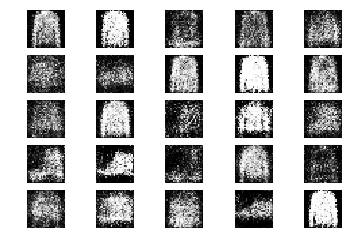

801 [D loss: 0.641430, acc.: 60.94%] [G loss: 0.902260]
802 [D loss: 0.654319, acc.: 54.69%] [G loss: 0.958503]
803 [D loss: 0.705343, acc.: 56.25%] [G loss: 0.904936]
804 [D loss: 0.657058, acc.: 53.12%] [G loss: 0.930698]
805 [D loss: 0.651037, acc.: 62.50%] [G loss: 0.886096]
806 [D loss: 0.621869, acc.: 67.19%] [G loss: 0.833445]
807 [D loss: 0.609292, acc.: 68.75%] [G loss: 0.907128]
808 [D loss: 0.655309, acc.: 57.81%] [G loss: 0.875185]
809 [D loss: 0.656948, acc.: 64.06%] [G loss: 0.814649]
810 [D loss: 0.715672, acc.: 43.75%] [G loss: 0.801950]
811 [D loss: 0.657828, acc.: 60.94%] [G loss: 0.880020]
812 [D loss: 0.646564, acc.: 65.62%] [G loss: 0.816533]
813 [D loss: 0.631489, acc.: 62.50%] [G loss: 0.852886]
814 [D loss: 0.605182, acc.: 67.19%] [G loss: 0.846086]
815 [D loss: 0.645211, acc.: 57.81%] [G loss: 0.848193]
816 [D loss: 0.714535, acc.: 53.12%] [G loss: 0.838472]
817 [D loss: 0.653018, acc.: 56.25%] [G loss: 0.876386]
818 [D loss: 0.639981, acc.: 62.50%] [G loss: 0.

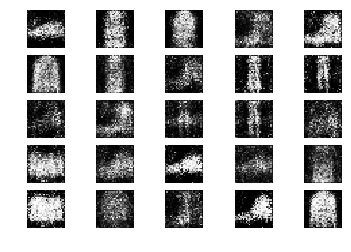

1001 [D loss: 0.643591, acc.: 64.06%] [G loss: 0.847700]
1002 [D loss: 0.610371, acc.: 71.88%] [G loss: 0.810256]
1003 [D loss: 0.658483, acc.: 56.25%] [G loss: 0.843554]
1004 [D loss: 0.629000, acc.: 70.31%] [G loss: 0.824872]
1005 [D loss: 0.667224, acc.: 59.38%] [G loss: 0.839331]
1006 [D loss: 0.591443, acc.: 64.06%] [G loss: 0.858484]
1007 [D loss: 0.597674, acc.: 64.06%] [G loss: 0.828311]
1008 [D loss: 0.666818, acc.: 56.25%] [G loss: 0.783217]
1009 [D loss: 0.683117, acc.: 54.69%] [G loss: 0.803303]
1010 [D loss: 0.603111, acc.: 65.62%] [G loss: 0.920037]
1011 [D loss: 0.602733, acc.: 71.88%] [G loss: 0.924548]
1012 [D loss: 0.640284, acc.: 62.50%] [G loss: 0.876145]
1013 [D loss: 0.709832, acc.: 57.81%] [G loss: 0.846183]
1014 [D loss: 0.682132, acc.: 57.81%] [G loss: 0.817695]
1015 [D loss: 0.648921, acc.: 62.50%] [G loss: 0.788778]
1016 [D loss: 0.696139, acc.: 59.38%] [G loss: 0.847564]
1017 [D loss: 0.646570, acc.: 51.56%] [G loss: 0.831685]
1018 [D loss: 0.614823, acc.: 7

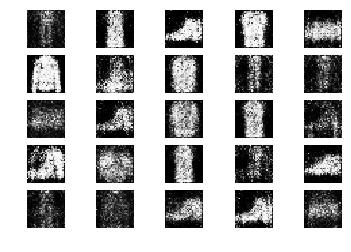

1201 [D loss: 0.651367, acc.: 59.38%] [G loss: 0.833043]
1202 [D loss: 0.655622, acc.: 59.38%] [G loss: 0.861927]
1203 [D loss: 0.621858, acc.: 67.19%] [G loss: 0.878595]
1204 [D loss: 0.713810, acc.: 48.44%] [G loss: 0.775230]
1205 [D loss: 0.650400, acc.: 60.94%] [G loss: 0.826885]
1206 [D loss: 0.640155, acc.: 62.50%] [G loss: 0.830448]
1207 [D loss: 0.683292, acc.: 53.12%] [G loss: 0.812091]
1208 [D loss: 0.642718, acc.: 68.75%] [G loss: 0.836286]
1209 [D loss: 0.658148, acc.: 60.94%] [G loss: 0.818093]
1210 [D loss: 0.624082, acc.: 68.75%] [G loss: 0.792408]
1211 [D loss: 0.654487, acc.: 57.81%] [G loss: 0.839668]
1212 [D loss: 0.617040, acc.: 68.75%] [G loss: 0.880984]
1213 [D loss: 0.637309, acc.: 65.62%] [G loss: 0.888778]
1214 [D loss: 0.642940, acc.: 64.06%] [G loss: 0.820678]
1215 [D loss: 0.640774, acc.: 59.38%] [G loss: 0.789720]
1216 [D loss: 0.653026, acc.: 60.94%] [G loss: 0.871101]
1217 [D loss: 0.676601, acc.: 57.81%] [G loss: 0.826028]
1218 [D loss: 0.633917, acc.: 6

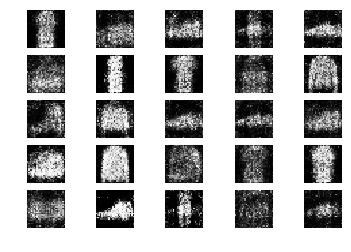

1401 [D loss: 0.590331, acc.: 73.44%] [G loss: 0.889805]
1402 [D loss: 0.599050, acc.: 60.94%] [G loss: 0.902912]
1403 [D loss: 0.637336, acc.: 57.81%] [G loss: 0.857219]
1404 [D loss: 0.625112, acc.: 67.19%] [G loss: 0.921739]
1405 [D loss: 0.693769, acc.: 53.12%] [G loss: 0.817137]
1406 [D loss: 0.633677, acc.: 68.75%] [G loss: 0.880159]
1407 [D loss: 0.629305, acc.: 64.06%] [G loss: 0.924604]
1408 [D loss: 0.614961, acc.: 65.62%] [G loss: 0.916930]
1409 [D loss: 0.628748, acc.: 64.06%] [G loss: 0.882591]
1410 [D loss: 0.629098, acc.: 64.06%] [G loss: 0.844458]
1411 [D loss: 0.674262, acc.: 56.25%] [G loss: 0.918289]
1412 [D loss: 0.635666, acc.: 60.94%] [G loss: 0.892397]
1413 [D loss: 0.676976, acc.: 57.81%] [G loss: 0.926878]
1414 [D loss: 0.590790, acc.: 65.62%] [G loss: 0.870795]
1415 [D loss: 0.622164, acc.: 65.62%] [G loss: 0.891574]
1416 [D loss: 0.657113, acc.: 60.94%] [G loss: 0.937472]
1417 [D loss: 0.641076, acc.: 65.62%] [G loss: 0.846996]
1418 [D loss: 0.636074, acc.: 5

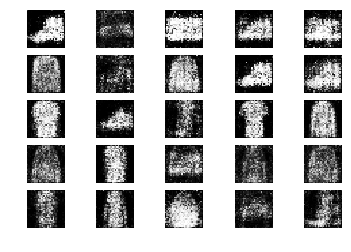

1601 [D loss: 0.585625, acc.: 71.88%] [G loss: 0.873917]
1602 [D loss: 0.658487, acc.: 56.25%] [G loss: 0.887349]
1603 [D loss: 0.613382, acc.: 76.56%] [G loss: 0.813615]
1604 [D loss: 0.638361, acc.: 60.94%] [G loss: 0.907480]
1605 [D loss: 0.601178, acc.: 68.75%] [G loss: 0.899486]
1606 [D loss: 0.636013, acc.: 68.75%] [G loss: 0.973934]
1607 [D loss: 0.607274, acc.: 65.62%] [G loss: 0.941947]
1608 [D loss: 0.633070, acc.: 64.06%] [G loss: 0.953584]
1609 [D loss: 0.661276, acc.: 57.81%] [G loss: 0.822688]
1610 [D loss: 0.600985, acc.: 68.75%] [G loss: 0.775968]
1611 [D loss: 0.683639, acc.: 56.25%] [G loss: 0.766637]
1612 [D loss: 0.654744, acc.: 59.38%] [G loss: 0.802595]
1613 [D loss: 0.616657, acc.: 65.62%] [G loss: 0.891145]
1614 [D loss: 0.627293, acc.: 60.94%] [G loss: 0.858598]
1615 [D loss: 0.655887, acc.: 54.69%] [G loss: 0.883291]
1616 [D loss: 0.681397, acc.: 53.12%] [G loss: 0.875714]
1617 [D loss: 0.638000, acc.: 65.62%] [G loss: 0.910233]
1618 [D loss: 0.594783, acc.: 6

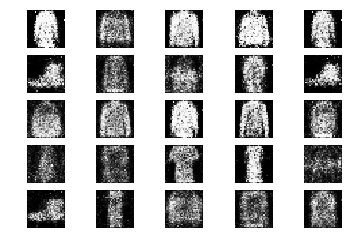

1801 [D loss: 0.622492, acc.: 64.06%] [G loss: 0.834360]
1802 [D loss: 0.588222, acc.: 70.31%] [G loss: 0.916633]
1803 [D loss: 0.683899, acc.: 56.25%] [G loss: 0.816517]
1804 [D loss: 0.605058, acc.: 64.06%] [G loss: 0.873253]
1805 [D loss: 0.622752, acc.: 65.62%] [G loss: 0.922248]
1806 [D loss: 0.711040, acc.: 51.56%] [G loss: 0.935971]
1807 [D loss: 0.593422, acc.: 70.31%] [G loss: 1.104362]
1808 [D loss: 0.579332, acc.: 78.12%] [G loss: 1.005789]
1809 [D loss: 0.605901, acc.: 70.31%] [G loss: 0.908080]
1810 [D loss: 0.627769, acc.: 67.19%] [G loss: 1.031780]
1811 [D loss: 0.673474, acc.: 56.25%] [G loss: 0.958712]
1812 [D loss: 0.603839, acc.: 67.19%] [G loss: 0.870121]
1813 [D loss: 0.583298, acc.: 73.44%] [G loss: 0.937703]
1814 [D loss: 0.606745, acc.: 71.88%] [G loss: 0.852542]
1815 [D loss: 0.597329, acc.: 70.31%] [G loss: 0.911814]
1816 [D loss: 0.705112, acc.: 50.00%] [G loss: 0.848781]
1817 [D loss: 0.656236, acc.: 62.50%] [G loss: 0.891063]
1818 [D loss: 0.623921, acc.: 6

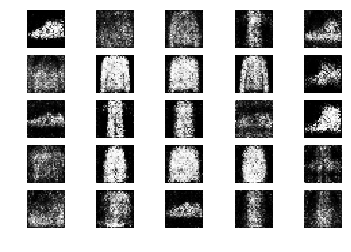

2001 [D loss: 0.586913, acc.: 71.88%] [G loss: 0.929233]
2002 [D loss: 0.634024, acc.: 65.62%] [G loss: 0.938805]
2003 [D loss: 0.605164, acc.: 62.50%] [G loss: 0.930189]
2004 [D loss: 0.665081, acc.: 62.50%] [G loss: 0.936338]
2005 [D loss: 0.653655, acc.: 64.06%] [G loss: 0.804255]
2006 [D loss: 0.583111, acc.: 60.94%] [G loss: 0.904010]
2007 [D loss: 0.644424, acc.: 60.94%] [G loss: 0.927336]
2008 [D loss: 0.615846, acc.: 73.44%] [G loss: 0.924493]
2009 [D loss: 0.688779, acc.: 62.50%] [G loss: 0.860651]
2010 [D loss: 0.668234, acc.: 54.69%] [G loss: 0.871740]
2011 [D loss: 0.613007, acc.: 65.62%] [G loss: 0.818315]
2012 [D loss: 0.631908, acc.: 64.06%] [G loss: 0.814726]
2013 [D loss: 0.576973, acc.: 73.44%] [G loss: 0.874720]
2014 [D loss: 0.611596, acc.: 65.62%] [G loss: 0.870413]
2015 [D loss: 0.635931, acc.: 64.06%] [G loss: 0.829862]
2016 [D loss: 0.634047, acc.: 56.25%] [G loss: 0.883714]
2017 [D loss: 0.612096, acc.: 64.06%] [G loss: 0.944175]
2018 [D loss: 0.597845, acc.: 6

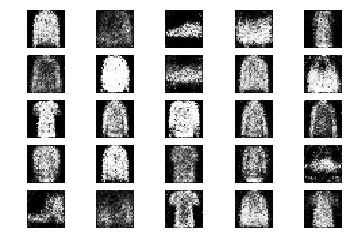

2201 [D loss: 0.688907, acc.: 57.81%] [G loss: 0.932962]
2202 [D loss: 0.575131, acc.: 73.44%] [G loss: 0.781690]
2203 [D loss: 0.654581, acc.: 57.81%] [G loss: 0.850753]
2204 [D loss: 0.616339, acc.: 65.62%] [G loss: 0.882751]
2205 [D loss: 0.661007, acc.: 62.50%] [G loss: 0.961172]
2206 [D loss: 0.588120, acc.: 73.44%] [G loss: 0.841482]
2207 [D loss: 0.623488, acc.: 64.06%] [G loss: 0.912581]
2208 [D loss: 0.603087, acc.: 64.06%] [G loss: 0.870484]
2209 [D loss: 0.675190, acc.: 60.94%] [G loss: 0.931780]
2210 [D loss: 0.618478, acc.: 67.19%] [G loss: 0.884815]
2211 [D loss: 0.653334, acc.: 59.38%] [G loss: 0.818955]
2212 [D loss: 0.654117, acc.: 65.62%] [G loss: 0.872972]
2213 [D loss: 0.634292, acc.: 68.75%] [G loss: 0.867363]
2214 [D loss: 0.645002, acc.: 64.06%] [G loss: 0.872883]
2215 [D loss: 0.684826, acc.: 51.56%] [G loss: 0.889955]
2216 [D loss: 0.633218, acc.: 62.50%] [G loss: 0.893890]
2217 [D loss: 0.626204, acc.: 65.62%] [G loss: 0.903016]
2218 [D loss: 0.606572, acc.: 6

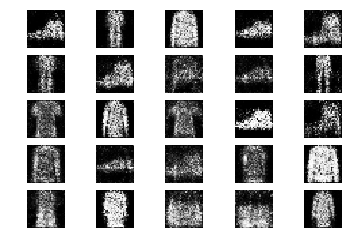

2401 [D loss: 0.592183, acc.: 64.06%] [G loss: 0.890636]
2402 [D loss: 0.627787, acc.: 70.31%] [G loss: 0.915152]
2403 [D loss: 0.630317, acc.: 65.62%] [G loss: 0.888108]
2404 [D loss: 0.606263, acc.: 60.94%] [G loss: 0.907067]
2405 [D loss: 0.571184, acc.: 71.88%] [G loss: 0.908466]
2406 [D loss: 0.622334, acc.: 62.50%] [G loss: 0.907891]
2407 [D loss: 0.608778, acc.: 68.75%] [G loss: 0.816302]
2408 [D loss: 0.696599, acc.: 51.56%] [G loss: 0.940759]
2409 [D loss: 0.565234, acc.: 68.75%] [G loss: 0.912078]
2410 [D loss: 0.617172, acc.: 68.75%] [G loss: 0.897628]
2411 [D loss: 0.652546, acc.: 60.94%] [G loss: 0.953768]
2412 [D loss: 0.660996, acc.: 59.38%] [G loss: 0.909996]
2413 [D loss: 0.598832, acc.: 65.62%] [G loss: 0.890104]
2414 [D loss: 0.640132, acc.: 64.06%] [G loss: 0.879398]
2415 [D loss: 0.567230, acc.: 76.56%] [G loss: 0.892973]
2416 [D loss: 0.713998, acc.: 56.25%] [G loss: 0.885544]
2417 [D loss: 0.628774, acc.: 53.12%] [G loss: 0.929718]
2418 [D loss: 0.643777, acc.: 5

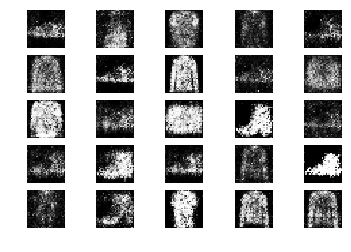

2601 [D loss: 0.676787, acc.: 57.81%] [G loss: 0.907410]
2602 [D loss: 0.565497, acc.: 65.62%] [G loss: 0.956260]
2603 [D loss: 0.623727, acc.: 64.06%] [G loss: 0.887150]
2604 [D loss: 0.625770, acc.: 59.38%] [G loss: 1.024041]
2605 [D loss: 0.629235, acc.: 62.50%] [G loss: 0.873335]
2606 [D loss: 0.695732, acc.: 53.12%] [G loss: 0.867771]
2607 [D loss: 0.680072, acc.: 62.50%] [G loss: 0.921784]
2608 [D loss: 0.608882, acc.: 64.06%] [G loss: 0.916868]
2609 [D loss: 0.621198, acc.: 62.50%] [G loss: 0.874827]
2610 [D loss: 0.697039, acc.: 56.25%] [G loss: 0.868891]
2611 [D loss: 0.616993, acc.: 68.75%] [G loss: 0.973884]
2612 [D loss: 0.686140, acc.: 53.12%] [G loss: 0.919108]
2613 [D loss: 0.575102, acc.: 70.31%] [G loss: 0.898664]
2614 [D loss: 0.592918, acc.: 67.19%] [G loss: 0.926147]
2615 [D loss: 0.689963, acc.: 59.38%] [G loss: 0.887002]
2616 [D loss: 0.692721, acc.: 51.56%] [G loss: 0.847860]
2617 [D loss: 0.639357, acc.: 59.38%] [G loss: 0.879613]
2618 [D loss: 0.598306, acc.: 7

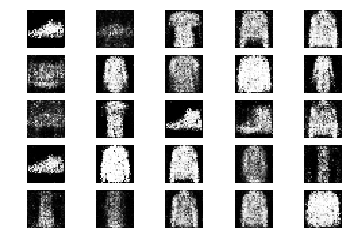

2801 [D loss: 0.593852, acc.: 67.19%] [G loss: 0.847831]
2802 [D loss: 0.628467, acc.: 67.19%] [G loss: 0.850080]
2803 [D loss: 0.646834, acc.: 62.50%] [G loss: 0.845136]
2804 [D loss: 0.641682, acc.: 62.50%] [G loss: 0.929528]
2805 [D loss: 0.730671, acc.: 45.31%] [G loss: 0.906527]
2806 [D loss: 0.598735, acc.: 71.88%] [G loss: 0.938036]
2807 [D loss: 0.619630, acc.: 62.50%] [G loss: 0.966522]
2808 [D loss: 0.633471, acc.: 70.31%] [G loss: 0.926506]
2809 [D loss: 0.659919, acc.: 60.94%] [G loss: 0.818204]
2810 [D loss: 0.600662, acc.: 75.00%] [G loss: 0.943072]
2811 [D loss: 0.602677, acc.: 67.19%] [G loss: 0.956068]
2812 [D loss: 0.650617, acc.: 60.94%] [G loss: 0.959945]
2813 [D loss: 0.648302, acc.: 60.94%] [G loss: 0.960097]
2814 [D loss: 0.628457, acc.: 65.62%] [G loss: 0.997651]
2815 [D loss: 0.668641, acc.: 64.06%] [G loss: 0.884210]
2816 [D loss: 0.615390, acc.: 68.75%] [G loss: 0.847325]
2817 [D loss: 0.594777, acc.: 73.44%] [G loss: 0.955042]
2818 [D loss: 0.682450, acc.: 6

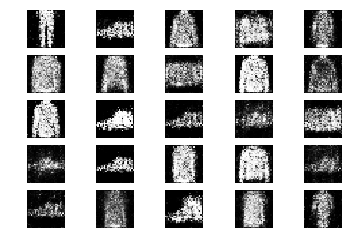

3001 [D loss: 0.634299, acc.: 62.50%] [G loss: 1.060669]
3002 [D loss: 0.602992, acc.: 65.62%] [G loss: 0.860936]
3003 [D loss: 0.594950, acc.: 73.44%] [G loss: 0.838659]
3004 [D loss: 0.622625, acc.: 67.19%] [G loss: 1.005879]
3005 [D loss: 0.680571, acc.: 56.25%] [G loss: 0.889692]
3006 [D loss: 0.615658, acc.: 59.38%] [G loss: 0.960355]
3007 [D loss: 0.666649, acc.: 64.06%] [G loss: 0.945899]
3008 [D loss: 0.620473, acc.: 67.19%] [G loss: 0.902147]
3009 [D loss: 0.580809, acc.: 71.88%] [G loss: 0.987779]
3010 [D loss: 0.669868, acc.: 53.12%] [G loss: 0.825536]
3011 [D loss: 0.650267, acc.: 71.88%] [G loss: 0.985317]
3012 [D loss: 0.665099, acc.: 67.19%] [G loss: 0.918273]
3013 [D loss: 0.602277, acc.: 56.25%] [G loss: 0.968937]
3014 [D loss: 0.637030, acc.: 64.06%] [G loss: 0.840937]
3015 [D loss: 0.597123, acc.: 65.62%] [G loss: 0.919244]
3016 [D loss: 0.662309, acc.: 62.50%] [G loss: 0.883413]
3017 [D loss: 0.642536, acc.: 65.62%] [G loss: 0.844585]
3018 [D loss: 0.654079, acc.: 6

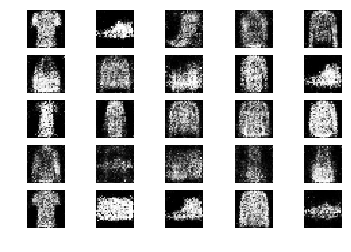

3201 [D loss: 0.634257, acc.: 57.81%] [G loss: 0.893137]
3202 [D loss: 0.664315, acc.: 59.38%] [G loss: 0.877729]
3203 [D loss: 0.687169, acc.: 56.25%] [G loss: 0.873718]
3204 [D loss: 0.631528, acc.: 70.31%] [G loss: 0.978644]
3205 [D loss: 0.649821, acc.: 62.50%] [G loss: 0.923469]
3206 [D loss: 0.654900, acc.: 59.38%] [G loss: 0.863822]
3207 [D loss: 0.656694, acc.: 53.12%] [G loss: 0.891008]
3208 [D loss: 0.660156, acc.: 68.75%] [G loss: 0.875362]
3209 [D loss: 0.637734, acc.: 54.69%] [G loss: 0.939833]
3210 [D loss: 0.628361, acc.: 65.62%] [G loss: 0.856079]
3211 [D loss: 0.614082, acc.: 62.50%] [G loss: 0.925096]
3212 [D loss: 0.586163, acc.: 65.62%] [G loss: 0.866629]
3213 [D loss: 0.585896, acc.: 62.50%] [G loss: 0.957850]
3214 [D loss: 0.607632, acc.: 64.06%] [G loss: 0.874757]
3215 [D loss: 0.681302, acc.: 59.38%] [G loss: 0.864922]
3216 [D loss: 0.585358, acc.: 76.56%] [G loss: 0.949788]
3217 [D loss: 0.637824, acc.: 62.50%] [G loss: 0.976675]
3218 [D loss: 0.677999, acc.: 4

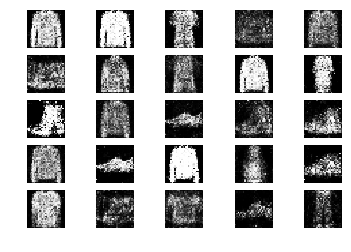

3401 [D loss: 0.629427, acc.: 65.62%] [G loss: 0.892835]
3402 [D loss: 0.671592, acc.: 59.38%] [G loss: 0.923019]
3403 [D loss: 0.664926, acc.: 51.56%] [G loss: 0.903125]
3404 [D loss: 0.639391, acc.: 67.19%] [G loss: 0.905919]
3405 [D loss: 0.630863, acc.: 57.81%] [G loss: 0.928885]
3406 [D loss: 0.663507, acc.: 51.56%] [G loss: 1.005546]
3407 [D loss: 0.674010, acc.: 60.94%] [G loss: 0.917833]
3408 [D loss: 0.614355, acc.: 70.31%] [G loss: 0.890775]
3409 [D loss: 0.655081, acc.: 64.06%] [G loss: 0.900459]
3410 [D loss: 0.607109, acc.: 64.06%] [G loss: 0.810946]
3411 [D loss: 0.663876, acc.: 62.50%] [G loss: 0.862144]
3412 [D loss: 0.679025, acc.: 56.25%] [G loss: 0.959913]
3413 [D loss: 0.699560, acc.: 53.12%] [G loss: 0.851493]
3414 [D loss: 0.661711, acc.: 62.50%] [G loss: 0.934094]
3415 [D loss: 0.676908, acc.: 54.69%] [G loss: 0.919697]
3416 [D loss: 0.681081, acc.: 57.81%] [G loss: 0.988724]
3417 [D loss: 0.663124, acc.: 59.38%] [G loss: 0.941319]
3418 [D loss: 0.626374, acc.: 6

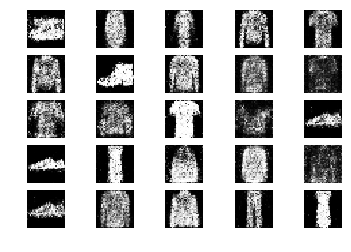

3601 [D loss: 0.629961, acc.: 65.62%] [G loss: 0.935430]
3602 [D loss: 0.608111, acc.: 71.88%] [G loss: 1.010942]
3603 [D loss: 0.694552, acc.: 53.12%] [G loss: 1.011961]
3604 [D loss: 0.693480, acc.: 53.12%] [G loss: 1.013240]
3605 [D loss: 0.642233, acc.: 62.50%] [G loss: 0.957086]
3606 [D loss: 0.595548, acc.: 73.44%] [G loss: 0.876701]
3607 [D loss: 0.683332, acc.: 65.62%] [G loss: 0.868989]
3608 [D loss: 0.682919, acc.: 53.12%] [G loss: 0.823300]
3609 [D loss: 0.612135, acc.: 67.19%] [G loss: 0.835724]
3610 [D loss: 0.652050, acc.: 54.69%] [G loss: 0.856566]
3611 [D loss: 0.605180, acc.: 68.75%] [G loss: 0.864193]
3612 [D loss: 0.581800, acc.: 67.19%] [G loss: 0.934363]
3613 [D loss: 0.653167, acc.: 70.31%] [G loss: 0.977617]
3614 [D loss: 0.626687, acc.: 67.19%] [G loss: 0.996348]
3615 [D loss: 0.614117, acc.: 65.62%] [G loss: 0.904459]
3616 [D loss: 0.637333, acc.: 54.69%] [G loss: 0.949996]
3617 [D loss: 0.670480, acc.: 64.06%] [G loss: 0.881667]
3618 [D loss: 0.609742, acc.: 6

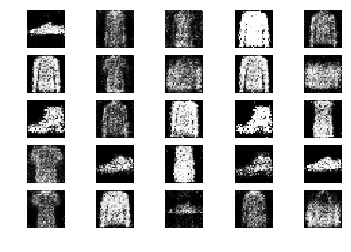

3801 [D loss: 0.670071, acc.: 56.25%] [G loss: 0.788728]
3802 [D loss: 0.624334, acc.: 68.75%] [G loss: 0.930978]
3803 [D loss: 0.622735, acc.: 70.31%] [G loss: 0.959202]
3804 [D loss: 0.667737, acc.: 59.38%] [G loss: 0.885193]
3805 [D loss: 0.633703, acc.: 62.50%] [G loss: 0.871333]
3806 [D loss: 0.716260, acc.: 51.56%] [G loss: 0.877956]
3807 [D loss: 0.630667, acc.: 65.62%] [G loss: 0.843793]
3808 [D loss: 0.643938, acc.: 59.38%] [G loss: 0.905537]
3809 [D loss: 0.585878, acc.: 73.44%] [G loss: 0.880350]
3810 [D loss: 0.607305, acc.: 64.06%] [G loss: 0.941867]
3811 [D loss: 0.625532, acc.: 60.94%] [G loss: 0.873010]
3812 [D loss: 0.625442, acc.: 64.06%] [G loss: 0.940118]
3813 [D loss: 0.728215, acc.: 54.69%] [G loss: 0.817158]
3814 [D loss: 0.641279, acc.: 59.38%] [G loss: 0.879526]
3815 [D loss: 0.600165, acc.: 71.88%] [G loss: 0.922895]
3816 [D loss: 0.601176, acc.: 68.75%] [G loss: 0.963923]
3817 [D loss: 0.621683, acc.: 64.06%] [G loss: 0.951889]
3818 [D loss: 0.636158, acc.: 6

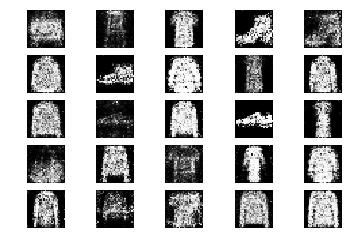

4001 [D loss: 0.615971, acc.: 67.19%] [G loss: 0.894251]
4002 [D loss: 0.676612, acc.: 60.94%] [G loss: 0.959782]
4003 [D loss: 0.640140, acc.: 54.69%] [G loss: 0.914923]
4004 [D loss: 0.616567, acc.: 60.94%] [G loss: 0.976489]
4005 [D loss: 0.644316, acc.: 67.19%] [G loss: 0.923048]
4006 [D loss: 0.655885, acc.: 67.19%] [G loss: 0.870102]
4007 [D loss: 0.582781, acc.: 73.44%] [G loss: 0.899690]
4008 [D loss: 0.721155, acc.: 60.94%] [G loss: 0.926229]
4009 [D loss: 0.631413, acc.: 60.94%] [G loss: 0.852017]
4010 [D loss: 0.625773, acc.: 68.75%] [G loss: 0.861529]
4011 [D loss: 0.608678, acc.: 67.19%] [G loss: 0.893870]
4012 [D loss: 0.697140, acc.: 56.25%] [G loss: 0.917061]
4013 [D loss: 0.699291, acc.: 54.69%] [G loss: 1.067472]
4014 [D loss: 0.687083, acc.: 51.56%] [G loss: 0.846255]
4015 [D loss: 0.605156, acc.: 75.00%] [G loss: 0.877064]
4016 [D loss: 0.655663, acc.: 59.38%] [G loss: 0.825309]
4017 [D loss: 0.664636, acc.: 62.50%] [G loss: 0.872896]
4018 [D loss: 0.575629, acc.: 6

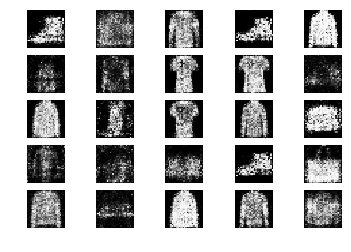

4201 [D loss: 0.619461, acc.: 68.75%] [G loss: 0.903609]
4202 [D loss: 0.625866, acc.: 70.31%] [G loss: 0.944442]
4203 [D loss: 0.709702, acc.: 51.56%] [G loss: 0.844899]
4204 [D loss: 0.615674, acc.: 60.94%] [G loss: 0.857809]
4205 [D loss: 0.617939, acc.: 70.31%] [G loss: 0.896853]
4206 [D loss: 0.638493, acc.: 65.62%] [G loss: 0.915034]
4207 [D loss: 0.600912, acc.: 67.19%] [G loss: 0.971535]
4208 [D loss: 0.664378, acc.: 62.50%] [G loss: 0.867461]
4209 [D loss: 0.723450, acc.: 57.81%] [G loss: 0.935449]
4210 [D loss: 0.728186, acc.: 45.31%] [G loss: 0.800085]
4211 [D loss: 0.651115, acc.: 57.81%] [G loss: 0.836660]
4212 [D loss: 0.616307, acc.: 71.88%] [G loss: 0.931884]
4213 [D loss: 0.543275, acc.: 78.12%] [G loss: 0.896039]
4214 [D loss: 0.686355, acc.: 59.38%] [G loss: 0.989210]
4215 [D loss: 0.627457, acc.: 59.38%] [G loss: 0.857622]
4216 [D loss: 0.611766, acc.: 70.31%] [G loss: 0.918688]
4217 [D loss: 0.656062, acc.: 67.19%] [G loss: 0.883498]
4218 [D loss: 0.633523, acc.: 6

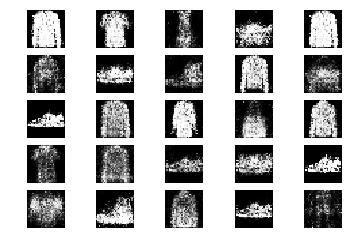

4401 [D loss: 0.666071, acc.: 64.06%] [G loss: 0.977953]
4402 [D loss: 0.666971, acc.: 59.38%] [G loss: 1.036411]
4403 [D loss: 0.659345, acc.: 59.38%] [G loss: 1.018419]
4404 [D loss: 0.592585, acc.: 65.62%] [G loss: 1.001598]
4405 [D loss: 0.692775, acc.: 57.81%] [G loss: 0.963920]
4406 [D loss: 0.649529, acc.: 59.38%] [G loss: 0.840981]
4407 [D loss: 0.642810, acc.: 62.50%] [G loss: 0.950823]
4408 [D loss: 0.675962, acc.: 54.69%] [G loss: 0.981980]
4409 [D loss: 0.616182, acc.: 60.94%] [G loss: 0.905136]
4410 [D loss: 0.622165, acc.: 68.75%] [G loss: 0.853728]
4411 [D loss: 0.659955, acc.: 54.69%] [G loss: 0.812030]
4412 [D loss: 0.645265, acc.: 60.94%] [G loss: 0.804111]
4413 [D loss: 0.633458, acc.: 57.81%] [G loss: 0.879233]
4414 [D loss: 0.710600, acc.: 54.69%] [G loss: 0.979111]
4415 [D loss: 0.664552, acc.: 56.25%] [G loss: 0.914895]
4416 [D loss: 0.659594, acc.: 53.12%] [G loss: 0.943283]
4417 [D loss: 0.572951, acc.: 76.56%] [G loss: 0.956852]
4418 [D loss: 0.610203, acc.: 6

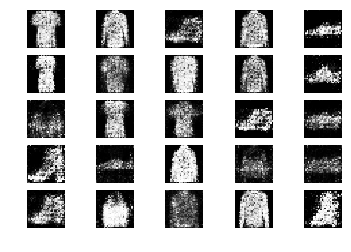

4601 [D loss: 0.690006, acc.: 56.25%] [G loss: 0.953770]
4602 [D loss: 0.637738, acc.: 57.81%] [G loss: 0.899899]
4603 [D loss: 0.669663, acc.: 60.94%] [G loss: 0.884866]
4604 [D loss: 0.662517, acc.: 54.69%] [G loss: 0.919878]
4605 [D loss: 0.734233, acc.: 57.81%] [G loss: 0.919261]
4606 [D loss: 0.615983, acc.: 71.88%] [G loss: 0.834200]
4607 [D loss: 0.618899, acc.: 67.19%] [G loss: 0.896944]
4608 [D loss: 0.644048, acc.: 67.19%] [G loss: 0.899358]
4609 [D loss: 0.607225, acc.: 64.06%] [G loss: 0.902193]
4610 [D loss: 0.652540, acc.: 57.81%] [G loss: 0.943462]
4611 [D loss: 0.576953, acc.: 67.19%] [G loss: 0.889413]
4612 [D loss: 0.732281, acc.: 50.00%] [G loss: 0.889519]
4613 [D loss: 0.570434, acc.: 75.00%] [G loss: 0.920967]
4614 [D loss: 0.664189, acc.: 64.06%] [G loss: 0.858967]
4615 [D loss: 0.637432, acc.: 65.62%] [G loss: 0.955066]
4616 [D loss: 0.641126, acc.: 67.19%] [G loss: 0.895934]
4617 [D loss: 0.609650, acc.: 67.19%] [G loss: 0.926664]
4618 [D loss: 0.602046, acc.: 6

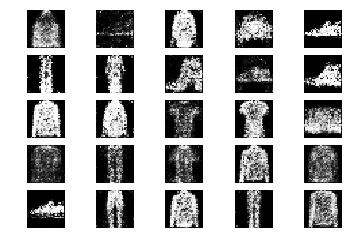

4801 [D loss: 0.661228, acc.: 64.06%] [G loss: 0.871606]
4802 [D loss: 0.653646, acc.: 64.06%] [G loss: 0.967120]
4803 [D loss: 0.646997, acc.: 68.75%] [G loss: 0.853206]
4804 [D loss: 0.621379, acc.: 70.31%] [G loss: 0.853484]
4805 [D loss: 0.603408, acc.: 62.50%] [G loss: 0.852212]
4806 [D loss: 0.650430, acc.: 60.94%] [G loss: 0.845834]
4807 [D loss: 0.660261, acc.: 59.38%] [G loss: 0.900187]
4808 [D loss: 0.718791, acc.: 54.69%] [G loss: 0.795593]
4809 [D loss: 0.628144, acc.: 65.62%] [G loss: 0.823431]
4810 [D loss: 0.645535, acc.: 57.81%] [G loss: 0.951648]
4811 [D loss: 0.628682, acc.: 64.06%] [G loss: 0.850553]
4812 [D loss: 0.665630, acc.: 57.81%] [G loss: 0.863978]
4813 [D loss: 0.599031, acc.: 65.62%] [G loss: 0.809302]
4814 [D loss: 0.660455, acc.: 59.38%] [G loss: 1.000329]
4815 [D loss: 0.588998, acc.: 68.75%] [G loss: 0.964381]
4816 [D loss: 0.587005, acc.: 78.12%] [G loss: 0.912343]
4817 [D loss: 0.662376, acc.: 56.25%] [G loss: 0.937627]
4818 [D loss: 0.598789, acc.: 6

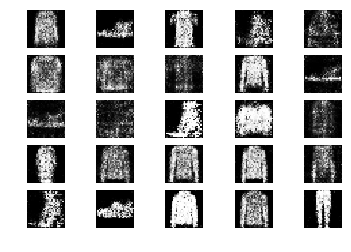

5001 [D loss: 0.669011, acc.: 62.50%] [G loss: 0.870684]
5002 [D loss: 0.618195, acc.: 73.44%] [G loss: 0.895039]
5003 [D loss: 0.619561, acc.: 65.62%] [G loss: 0.855819]
5004 [D loss: 0.584880, acc.: 76.56%] [G loss: 0.857408]
5005 [D loss: 0.700224, acc.: 50.00%] [G loss: 0.929825]
5006 [D loss: 0.650931, acc.: 60.94%] [G loss: 0.888351]
5007 [D loss: 0.663206, acc.: 56.25%] [G loss: 0.887312]
5008 [D loss: 0.636060, acc.: 70.31%] [G loss: 0.909048]
5009 [D loss: 0.691473, acc.: 60.94%] [G loss: 0.825417]
5010 [D loss: 0.596863, acc.: 67.19%] [G loss: 0.862553]
5011 [D loss: 0.630482, acc.: 65.62%] [G loss: 0.864570]
5012 [D loss: 0.705649, acc.: 50.00%] [G loss: 0.874095]
5013 [D loss: 0.569038, acc.: 71.88%] [G loss: 0.859834]
5014 [D loss: 0.653481, acc.: 68.75%] [G loss: 0.938277]
5015 [D loss: 0.639724, acc.: 67.19%] [G loss: 0.849126]
5016 [D loss: 0.687466, acc.: 53.12%] [G loss: 0.923831]
5017 [D loss: 0.661518, acc.: 59.38%] [G loss: 0.840891]
5018 [D loss: 0.677518, acc.: 6

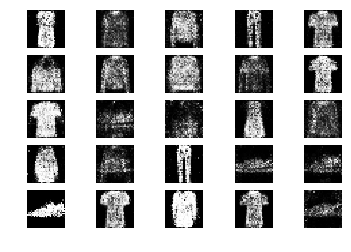

5201 [D loss: 0.638535, acc.: 59.38%] [G loss: 0.938749]
5202 [D loss: 0.639652, acc.: 60.94%] [G loss: 0.860444]
5203 [D loss: 0.677697, acc.: 54.69%] [G loss: 0.868798]
5204 [D loss: 0.627298, acc.: 65.62%] [G loss: 0.846179]
5205 [D loss: 0.667129, acc.: 56.25%] [G loss: 0.933264]
5206 [D loss: 0.614807, acc.: 75.00%] [G loss: 0.882138]
5207 [D loss: 0.545375, acc.: 78.12%] [G loss: 0.943469]
5208 [D loss: 0.648674, acc.: 68.75%] [G loss: 0.837103]
5209 [D loss: 0.610785, acc.: 70.31%] [G loss: 0.861362]
5210 [D loss: 0.683538, acc.: 50.00%] [G loss: 0.875149]
5211 [D loss: 0.627234, acc.: 67.19%] [G loss: 0.886405]
5212 [D loss: 0.711971, acc.: 54.69%] [G loss: 0.949748]
5213 [D loss: 0.709463, acc.: 56.25%] [G loss: 0.867284]
5214 [D loss: 0.706878, acc.: 50.00%] [G loss: 0.915426]
5215 [D loss: 0.632141, acc.: 67.19%] [G loss: 1.003583]
5216 [D loss: 0.659337, acc.: 56.25%] [G loss: 0.968804]
5217 [D loss: 0.594758, acc.: 68.75%] [G loss: 0.938165]
5218 [D loss: 0.687582, acc.: 6

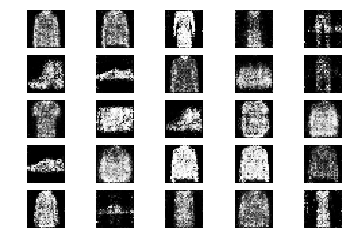

5401 [D loss: 0.703356, acc.: 48.44%] [G loss: 0.900231]
5402 [D loss: 0.593288, acc.: 70.31%] [G loss: 0.890539]
5403 [D loss: 0.608878, acc.: 59.38%] [G loss: 0.887099]
5404 [D loss: 0.569038, acc.: 71.88%] [G loss: 0.872556]
5405 [D loss: 0.715587, acc.: 46.88%] [G loss: 0.887383]
5406 [D loss: 0.682704, acc.: 57.81%] [G loss: 0.826647]
5407 [D loss: 0.666934, acc.: 54.69%] [G loss: 0.917904]
5408 [D loss: 0.599843, acc.: 67.19%] [G loss: 0.956307]
5409 [D loss: 0.613974, acc.: 64.06%] [G loss: 0.962408]
5410 [D loss: 0.635377, acc.: 68.75%] [G loss: 0.871537]
5411 [D loss: 0.636807, acc.: 70.31%] [G loss: 0.852013]
5412 [D loss: 0.655945, acc.: 54.69%] [G loss: 0.941674]
5413 [D loss: 0.750527, acc.: 54.69%] [G loss: 0.895609]
5414 [D loss: 0.670769, acc.: 57.81%] [G loss: 0.916560]
5415 [D loss: 0.614476, acc.: 67.19%] [G loss: 0.883393]
5416 [D loss: 0.615954, acc.: 60.94%] [G loss: 0.869805]
5417 [D loss: 0.713875, acc.: 56.25%] [G loss: 0.842631]
5418 [D loss: 0.664706, acc.: 5

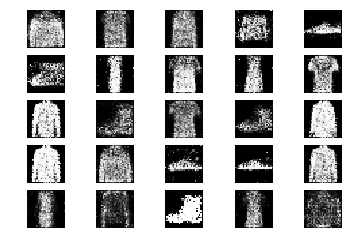

5601 [D loss: 0.647303, acc.: 67.19%] [G loss: 0.942219]
5602 [D loss: 0.619738, acc.: 62.50%] [G loss: 0.890407]
5603 [D loss: 0.638826, acc.: 62.50%] [G loss: 0.843170]
5604 [D loss: 0.706091, acc.: 59.38%] [G loss: 0.804964]
5605 [D loss: 0.644304, acc.: 60.94%] [G loss: 0.852325]
5606 [D loss: 0.635651, acc.: 60.94%] [G loss: 0.972825]
5607 [D loss: 0.655975, acc.: 65.62%] [G loss: 0.924960]
5608 [D loss: 0.626682, acc.: 65.62%] [G loss: 0.954261]
5609 [D loss: 0.662633, acc.: 59.38%] [G loss: 1.008475]
5610 [D loss: 0.687954, acc.: 54.69%] [G loss: 0.884332]
5611 [D loss: 0.678947, acc.: 56.25%] [G loss: 0.770791]
5612 [D loss: 0.609886, acc.: 70.31%] [G loss: 0.820138]
5613 [D loss: 0.611163, acc.: 70.31%] [G loss: 0.929285]
5614 [D loss: 0.674895, acc.: 57.81%] [G loss: 0.886364]
5615 [D loss: 0.628198, acc.: 65.62%] [G loss: 0.929575]
5616 [D loss: 0.614061, acc.: 65.62%] [G loss: 0.894350]
5617 [D loss: 0.612364, acc.: 62.50%] [G loss: 0.892779]
5618 [D loss: 0.745521, acc.: 5

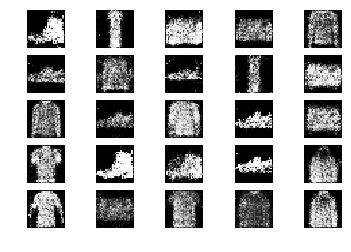

5801 [D loss: 0.621251, acc.: 68.75%] [G loss: 0.898658]
5802 [D loss: 0.581729, acc.: 73.44%] [G loss: 0.914213]
5803 [D loss: 0.659278, acc.: 60.94%] [G loss: 0.913910]
5804 [D loss: 0.637437, acc.: 62.50%] [G loss: 0.779170]
5805 [D loss: 0.665259, acc.: 51.56%] [G loss: 0.845458]
5806 [D loss: 0.671278, acc.: 59.38%] [G loss: 0.889811]
5807 [D loss: 0.629942, acc.: 65.62%] [G loss: 0.847253]
5808 [D loss: 0.672856, acc.: 51.56%] [G loss: 0.810181]
5809 [D loss: 0.680007, acc.: 57.81%] [G loss: 0.860964]
5810 [D loss: 0.585440, acc.: 71.88%] [G loss: 0.898390]
5811 [D loss: 0.603536, acc.: 73.44%] [G loss: 0.894506]
5812 [D loss: 0.634044, acc.: 60.94%] [G loss: 0.894388]
5813 [D loss: 0.641679, acc.: 65.62%] [G loss: 0.845423]
5814 [D loss: 0.692117, acc.: 56.25%] [G loss: 0.875025]
5815 [D loss: 0.683647, acc.: 51.56%] [G loss: 0.934891]
5816 [D loss: 0.581916, acc.: 71.88%] [G loss: 0.965107]
5817 [D loss: 0.580017, acc.: 71.88%] [G loss: 0.799479]
5818 [D loss: 0.684219, acc.: 6

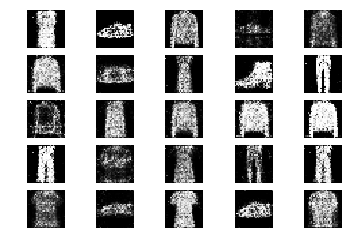

6001 [D loss: 0.560394, acc.: 73.44%] [G loss: 0.912397]
6002 [D loss: 0.599575, acc.: 70.31%] [G loss: 0.851082]
6003 [D loss: 0.654526, acc.: 60.94%] [G loss: 0.924318]
6004 [D loss: 0.611627, acc.: 68.75%] [G loss: 0.913825]
6005 [D loss: 0.714069, acc.: 54.69%] [G loss: 0.945367]
6006 [D loss: 0.702331, acc.: 54.69%] [G loss: 0.941218]
6007 [D loss: 0.654628, acc.: 64.06%] [G loss: 1.009943]
6008 [D loss: 0.616608, acc.: 75.00%] [G loss: 0.918723]
6009 [D loss: 0.680100, acc.: 59.38%] [G loss: 0.918236]
6010 [D loss: 0.551410, acc.: 76.56%] [G loss: 0.910276]
6011 [D loss: 0.633288, acc.: 71.88%] [G loss: 0.836274]
6012 [D loss: 0.641638, acc.: 62.50%] [G loss: 0.859491]
6013 [D loss: 0.661677, acc.: 67.19%] [G loss: 0.846974]
6014 [D loss: 0.606615, acc.: 71.88%] [G loss: 0.999293]
6015 [D loss: 0.617279, acc.: 68.75%] [G loss: 0.847903]
6016 [D loss: 0.637567, acc.: 62.50%] [G loss: 0.912698]
6017 [D loss: 0.683489, acc.: 53.12%] [G loss: 0.938385]
6018 [D loss: 0.719533, acc.: 5

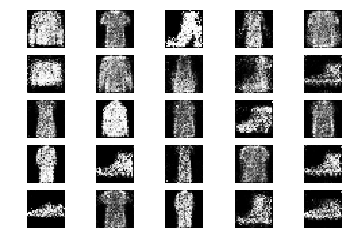

6201 [D loss: 0.653190, acc.: 54.69%] [G loss: 0.910814]
6202 [D loss: 0.681115, acc.: 46.88%] [G loss: 1.010605]
6203 [D loss: 0.670355, acc.: 60.94%] [G loss: 0.914009]
6204 [D loss: 0.679136, acc.: 53.12%] [G loss: 0.820429]
6205 [D loss: 0.625586, acc.: 64.06%] [G loss: 0.877026]
6206 [D loss: 0.631818, acc.: 60.94%] [G loss: 0.858220]
6207 [D loss: 0.629214, acc.: 65.62%] [G loss: 0.956109]
6208 [D loss: 0.646157, acc.: 59.38%] [G loss: 0.898370]
6209 [D loss: 0.602075, acc.: 73.44%] [G loss: 0.969769]
6210 [D loss: 0.624175, acc.: 70.31%] [G loss: 0.995333]
6211 [D loss: 0.639210, acc.: 70.31%] [G loss: 0.919050]
6212 [D loss: 0.708815, acc.: 54.69%] [G loss: 0.863342]
6213 [D loss: 0.686760, acc.: 62.50%] [G loss: 0.836305]
6214 [D loss: 0.659047, acc.: 67.19%] [G loss: 0.870413]
6215 [D loss: 0.650693, acc.: 64.06%] [G loss: 0.867769]
6216 [D loss: 0.636200, acc.: 68.75%] [G loss: 0.818290]
6217 [D loss: 0.657921, acc.: 51.56%] [G loss: 0.860549]
6218 [D loss: 0.629399, acc.: 6

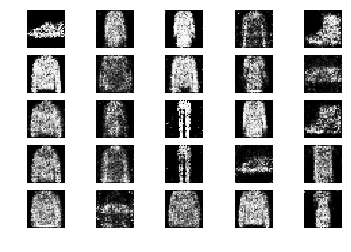

6401 [D loss: 0.705726, acc.: 51.56%] [G loss: 0.823909]
6402 [D loss: 0.686017, acc.: 59.38%] [G loss: 0.920678]
6403 [D loss: 0.630115, acc.: 59.38%] [G loss: 0.921816]
6404 [D loss: 0.677203, acc.: 60.94%] [G loss: 0.951977]
6405 [D loss: 0.581832, acc.: 71.88%] [G loss: 0.989293]
6406 [D loss: 0.709696, acc.: 51.56%] [G loss: 0.963594]
6407 [D loss: 0.571678, acc.: 75.00%] [G loss: 0.954900]
6408 [D loss: 0.672490, acc.: 57.81%] [G loss: 0.895887]
6409 [D loss: 0.577116, acc.: 70.31%] [G loss: 0.999960]
6410 [D loss: 0.605367, acc.: 64.06%] [G loss: 0.947993]
6411 [D loss: 0.588147, acc.: 78.12%] [G loss: 0.899571]
6412 [D loss: 0.670088, acc.: 67.19%] [G loss: 0.888796]
6413 [D loss: 0.648530, acc.: 62.50%] [G loss: 0.863176]
6414 [D loss: 0.676974, acc.: 60.94%] [G loss: 0.921701]
6415 [D loss: 0.552043, acc.: 79.69%] [G loss: 0.916476]
6416 [D loss: 0.572572, acc.: 73.44%] [G loss: 0.938891]
6417 [D loss: 0.734638, acc.: 51.56%] [G loss: 0.900161]
6418 [D loss: 0.665107, acc.: 5

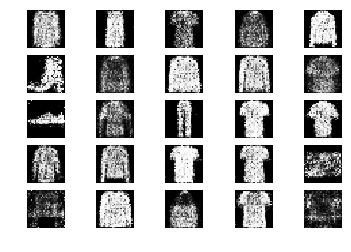

6601 [D loss: 0.696602, acc.: 57.81%] [G loss: 0.797567]
6602 [D loss: 0.621262, acc.: 59.38%] [G loss: 0.885882]
6603 [D loss: 0.660038, acc.: 60.94%] [G loss: 0.899382]
6604 [D loss: 0.700725, acc.: 57.81%] [G loss: 0.980210]
6605 [D loss: 0.628438, acc.: 64.06%] [G loss: 0.988341]
6606 [D loss: 0.624714, acc.: 62.50%] [G loss: 0.989221]
6607 [D loss: 0.642854, acc.: 57.81%] [G loss: 0.871297]
6608 [D loss: 0.671758, acc.: 59.38%] [G loss: 0.851398]
6609 [D loss: 0.651263, acc.: 64.06%] [G loss: 0.929098]
6610 [D loss: 0.579199, acc.: 65.62%] [G loss: 0.944935]
6611 [D loss: 0.725322, acc.: 48.44%] [G loss: 0.911505]
6612 [D loss: 0.653363, acc.: 53.12%] [G loss: 0.963888]
6613 [D loss: 0.698688, acc.: 57.81%] [G loss: 0.900930]
6614 [D loss: 0.649405, acc.: 62.50%] [G loss: 0.865046]
6615 [D loss: 0.604120, acc.: 68.75%] [G loss: 0.942040]
6616 [D loss: 0.625435, acc.: 64.06%] [G loss: 0.953270]
6617 [D loss: 0.668049, acc.: 54.69%] [G loss: 0.886402]
6618 [D loss: 0.629883, acc.: 5

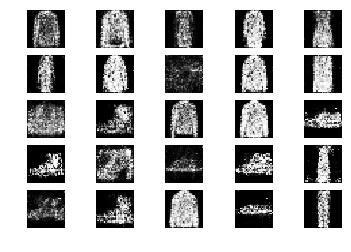

6801 [D loss: 0.632972, acc.: 65.62%] [G loss: 0.880611]
6802 [D loss: 0.682303, acc.: 53.12%] [G loss: 0.966412]
6803 [D loss: 0.597054, acc.: 67.19%] [G loss: 1.001481]
6804 [D loss: 0.668110, acc.: 53.12%] [G loss: 0.923699]
6805 [D loss: 0.594850, acc.: 73.44%] [G loss: 0.898252]
6806 [D loss: 0.718296, acc.: 50.00%] [G loss: 0.919065]
6807 [D loss: 0.607764, acc.: 65.62%] [G loss: 0.880488]
6808 [D loss: 0.610982, acc.: 71.88%] [G loss: 0.892693]
6809 [D loss: 0.605587, acc.: 68.75%] [G loss: 1.048658]
6810 [D loss: 0.695197, acc.: 60.94%] [G loss: 0.950792]
6811 [D loss: 0.631044, acc.: 56.25%] [G loss: 0.889799]
6812 [D loss: 0.599222, acc.: 68.75%] [G loss: 0.895668]
6813 [D loss: 0.604268, acc.: 70.31%] [G loss: 0.932623]
6814 [D loss: 0.623619, acc.: 65.62%] [G loss: 0.887500]
6815 [D loss: 0.681540, acc.: 54.69%] [G loss: 0.920271]
6816 [D loss: 0.681003, acc.: 59.38%] [G loss: 0.843493]
6817 [D loss: 0.635017, acc.: 59.38%] [G loss: 0.895540]
6818 [D loss: 0.652629, acc.: 6

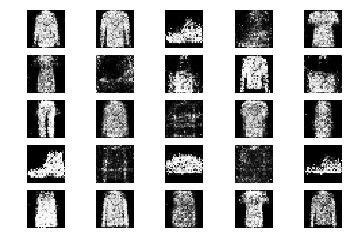

7001 [D loss: 0.602752, acc.: 68.75%] [G loss: 0.897330]
7002 [D loss: 0.614477, acc.: 71.88%] [G loss: 0.875090]
7003 [D loss: 0.647107, acc.: 64.06%] [G loss: 0.879015]
7004 [D loss: 0.642741, acc.: 59.38%] [G loss: 0.854741]
7005 [D loss: 0.703413, acc.: 59.38%] [G loss: 0.960488]
7006 [D loss: 0.600653, acc.: 65.62%] [G loss: 0.921676]
7007 [D loss: 0.681394, acc.: 53.12%] [G loss: 0.917009]
7008 [D loss: 0.660921, acc.: 62.50%] [G loss: 0.863731]
7009 [D loss: 0.680211, acc.: 60.94%] [G loss: 0.924020]
7010 [D loss: 0.643063, acc.: 64.06%] [G loss: 0.894038]
7011 [D loss: 0.562805, acc.: 81.25%] [G loss: 0.926057]
7012 [D loss: 0.657677, acc.: 64.06%] [G loss: 0.849010]
7013 [D loss: 0.680783, acc.: 60.94%] [G loss: 0.827780]
7014 [D loss: 0.598324, acc.: 67.19%] [G loss: 0.883064]
7015 [D loss: 0.557618, acc.: 76.56%] [G loss: 0.961047]
7016 [D loss: 0.607969, acc.: 70.31%] [G loss: 0.933476]
7017 [D loss: 0.628378, acc.: 64.06%] [G loss: 1.003868]
7018 [D loss: 0.710175, acc.: 5

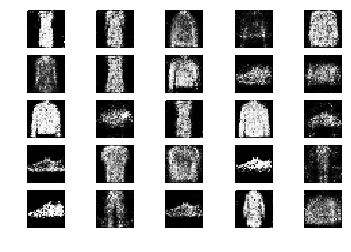

7201 [D loss: 0.591861, acc.: 68.75%] [G loss: 0.947130]
7202 [D loss: 0.642440, acc.: 67.19%] [G loss: 0.861180]
7203 [D loss: 0.676774, acc.: 56.25%] [G loss: 0.987420]
7204 [D loss: 0.619442, acc.: 62.50%] [G loss: 0.911052]
7205 [D loss: 0.642644, acc.: 56.25%] [G loss: 0.962336]
7206 [D loss: 0.569932, acc.: 76.56%] [G loss: 0.877964]
7207 [D loss: 0.718863, acc.: 59.38%] [G loss: 0.858054]
7208 [D loss: 0.606509, acc.: 62.50%] [G loss: 0.910707]
7209 [D loss: 0.709311, acc.: 51.56%] [G loss: 0.944221]
7210 [D loss: 0.655446, acc.: 62.50%] [G loss: 0.939565]
7211 [D loss: 0.642858, acc.: 70.31%] [G loss: 1.009387]
7212 [D loss: 0.713041, acc.: 51.56%] [G loss: 0.839651]
7213 [D loss: 0.661750, acc.: 68.75%] [G loss: 0.903306]
7214 [D loss: 0.671001, acc.: 65.62%] [G loss: 0.927122]
7215 [D loss: 0.637287, acc.: 65.62%] [G loss: 0.970181]
7216 [D loss: 0.645384, acc.: 64.06%] [G loss: 0.971290]
7217 [D loss: 0.678658, acc.: 48.44%] [G loss: 0.905554]
7218 [D loss: 0.643379, acc.: 5

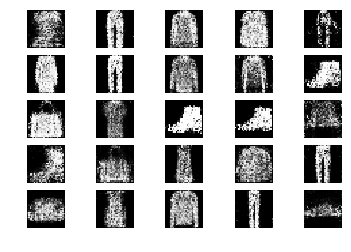

7401 [D loss: 0.678874, acc.: 59.38%] [G loss: 0.932916]
7402 [D loss: 0.657089, acc.: 60.94%] [G loss: 0.850798]
7403 [D loss: 0.654580, acc.: 60.94%] [G loss: 0.837282]
7404 [D loss: 0.677003, acc.: 67.19%] [G loss: 0.865585]
7405 [D loss: 0.668104, acc.: 60.94%] [G loss: 0.953494]
7406 [D loss: 0.654251, acc.: 67.19%] [G loss: 0.870441]
7407 [D loss: 0.651736, acc.: 64.06%] [G loss: 0.873884]
7408 [D loss: 0.662180, acc.: 60.94%] [G loss: 0.940454]
7409 [D loss: 0.647092, acc.: 54.69%] [G loss: 0.907099]
7410 [D loss: 0.641461, acc.: 64.06%] [G loss: 0.927651]
7411 [D loss: 0.760227, acc.: 45.31%] [G loss: 0.902964]
7412 [D loss: 0.573129, acc.: 76.56%] [G loss: 0.879347]
7413 [D loss: 0.656627, acc.: 56.25%] [G loss: 0.938604]
7414 [D loss: 0.653178, acc.: 56.25%] [G loss: 0.909378]
7415 [D loss: 0.627476, acc.: 60.94%] [G loss: 0.903719]
7416 [D loss: 0.642366, acc.: 60.94%] [G loss: 0.947931]
7417 [D loss: 0.661820, acc.: 59.38%] [G loss: 0.970023]
7418 [D loss: 0.611796, acc.: 6

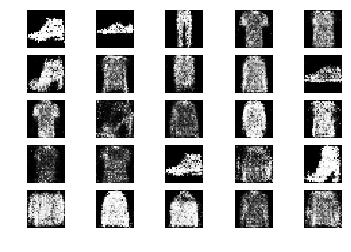

7601 [D loss: 0.688052, acc.: 56.25%] [G loss: 0.907388]
7602 [D loss: 0.623098, acc.: 67.19%] [G loss: 0.920062]
7603 [D loss: 0.637345, acc.: 67.19%] [G loss: 1.058272]
7604 [D loss: 0.631676, acc.: 68.75%] [G loss: 0.961562]
7605 [D loss: 0.615069, acc.: 67.19%] [G loss: 0.940446]
7606 [D loss: 0.613140, acc.: 68.75%] [G loss: 0.907720]
7607 [D loss: 0.635766, acc.: 65.62%] [G loss: 0.884643]
7608 [D loss: 0.726495, acc.: 56.25%] [G loss: 0.900412]
7609 [D loss: 0.669559, acc.: 59.38%] [G loss: 0.832788]
7610 [D loss: 0.670117, acc.: 62.50%] [G loss: 0.885166]
7611 [D loss: 0.596122, acc.: 71.88%] [G loss: 0.915558]
7612 [D loss: 0.589369, acc.: 67.19%] [G loss: 0.937184]
7613 [D loss: 0.674933, acc.: 60.94%] [G loss: 0.825279]
7614 [D loss: 0.702812, acc.: 57.81%] [G loss: 0.872835]
7615 [D loss: 0.625154, acc.: 57.81%] [G loss: 0.875986]
7616 [D loss: 0.646757, acc.: 54.69%] [G loss: 0.910073]
7617 [D loss: 0.664484, acc.: 57.81%] [G loss: 0.917969]
7618 [D loss: 0.593142, acc.: 6

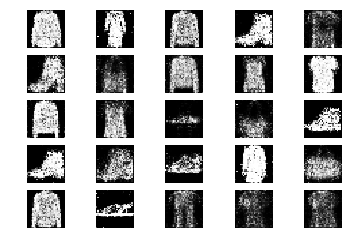

7801 [D loss: 0.656649, acc.: 59.38%] [G loss: 0.968431]
7802 [D loss: 0.697335, acc.: 56.25%] [G loss: 0.874313]
7803 [D loss: 0.687953, acc.: 53.12%] [G loss: 0.896237]
7804 [D loss: 0.752138, acc.: 53.12%] [G loss: 0.902651]
7805 [D loss: 0.658862, acc.: 54.69%] [G loss: 0.842315]
7806 [D loss: 0.632431, acc.: 71.88%] [G loss: 0.948566]
7807 [D loss: 0.657014, acc.: 65.62%] [G loss: 0.934571]
7808 [D loss: 0.645137, acc.: 62.50%] [G loss: 0.998681]
7809 [D loss: 0.617868, acc.: 67.19%] [G loss: 0.924937]
7810 [D loss: 0.638706, acc.: 62.50%] [G loss: 1.053282]
7811 [D loss: 0.701810, acc.: 60.94%] [G loss: 0.960284]
7812 [D loss: 0.684319, acc.: 64.06%] [G loss: 0.999892]
7813 [D loss: 0.620082, acc.: 71.88%] [G loss: 0.885326]
7814 [D loss: 0.660163, acc.: 65.62%] [G loss: 0.872919]
7815 [D loss: 0.648726, acc.: 57.81%] [G loss: 0.804360]
7816 [D loss: 0.718272, acc.: 50.00%] [G loss: 0.985113]
7817 [D loss: 0.666152, acc.: 59.38%] [G loss: 0.936380]
7818 [D loss: 0.679088, acc.: 5

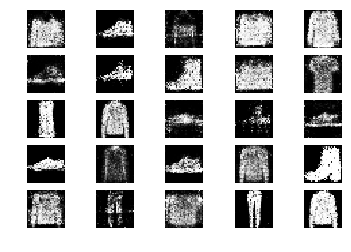

8001 [D loss: 0.634733, acc.: 67.19%] [G loss: 0.926365]
8002 [D loss: 0.742143, acc.: 50.00%] [G loss: 0.880482]
8003 [D loss: 0.641681, acc.: 60.94%] [G loss: 0.931741]
8004 [D loss: 0.630277, acc.: 60.94%] [G loss: 0.934766]
8005 [D loss: 0.692669, acc.: 57.81%] [G loss: 0.878857]
8006 [D loss: 0.665123, acc.: 59.38%] [G loss: 0.951678]
8007 [D loss: 0.657973, acc.: 65.62%] [G loss: 0.889349]
8008 [D loss: 0.641121, acc.: 68.75%] [G loss: 0.865370]
8009 [D loss: 0.675454, acc.: 60.94%] [G loss: 0.902985]
8010 [D loss: 0.636921, acc.: 68.75%] [G loss: 0.921830]
8011 [D loss: 0.680455, acc.: 59.38%] [G loss: 0.896966]
8012 [D loss: 0.673474, acc.: 65.62%] [G loss: 0.972978]
8013 [D loss: 0.657630, acc.: 64.06%] [G loss: 0.902132]
8014 [D loss: 0.661289, acc.: 64.06%] [G loss: 0.845152]
8015 [D loss: 0.646369, acc.: 65.62%] [G loss: 0.900493]
8016 [D loss: 0.724643, acc.: 46.88%] [G loss: 0.943234]
8017 [D loss: 0.653901, acc.: 62.50%] [G loss: 0.896727]
8018 [D loss: 0.648197, acc.: 5

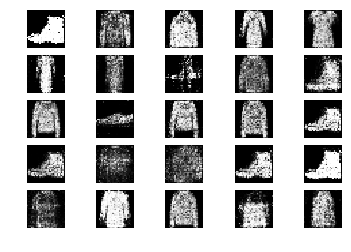

8201 [D loss: 0.670190, acc.: 57.81%] [G loss: 0.913150]
8202 [D loss: 0.642932, acc.: 65.62%] [G loss: 0.935211]
8203 [D loss: 0.707090, acc.: 53.12%] [G loss: 0.851745]
8204 [D loss: 0.662207, acc.: 56.25%] [G loss: 0.813610]
8205 [D loss: 0.651345, acc.: 62.50%] [G loss: 0.812193]
8206 [D loss: 0.586597, acc.: 75.00%] [G loss: 0.876653]
8207 [D loss: 0.704373, acc.: 48.44%] [G loss: 1.010233]
8208 [D loss: 0.658170, acc.: 54.69%] [G loss: 0.863392]
8209 [D loss: 0.674220, acc.: 50.00%] [G loss: 0.877988]
8210 [D loss: 0.710637, acc.: 54.69%] [G loss: 0.894211]
8211 [D loss: 0.601384, acc.: 71.88%] [G loss: 0.910377]
8212 [D loss: 0.601210, acc.: 68.75%] [G loss: 0.866614]
8213 [D loss: 0.592827, acc.: 70.31%] [G loss: 0.906764]
8214 [D loss: 0.663791, acc.: 57.81%] [G loss: 0.835062]
8215 [D loss: 0.619364, acc.: 60.94%] [G loss: 0.882796]
8216 [D loss: 0.672646, acc.: 57.81%] [G loss: 0.872733]
8217 [D loss: 0.705488, acc.: 59.38%] [G loss: 0.824298]
8218 [D loss: 0.593917, acc.: 6

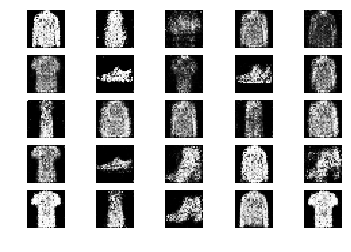

8401 [D loss: 0.623375, acc.: 57.81%] [G loss: 0.963044]
8402 [D loss: 0.662140, acc.: 60.94%] [G loss: 0.957720]
8403 [D loss: 0.662463, acc.: 68.75%] [G loss: 0.878880]
8404 [D loss: 0.621181, acc.: 67.19%] [G loss: 0.899856]
8405 [D loss: 0.623035, acc.: 59.38%] [G loss: 0.830959]
8406 [D loss: 0.701357, acc.: 53.12%] [G loss: 0.891127]
8407 [D loss: 0.689195, acc.: 54.69%] [G loss: 0.937376]
8408 [D loss: 0.647807, acc.: 59.38%] [G loss: 0.939632]
8409 [D loss: 0.619623, acc.: 64.06%] [G loss: 0.901554]
8410 [D loss: 0.622341, acc.: 67.19%] [G loss: 0.850647]
8411 [D loss: 0.601395, acc.: 68.75%] [G loss: 0.869510]
8412 [D loss: 0.615574, acc.: 68.75%] [G loss: 0.910408]
8413 [D loss: 0.669662, acc.: 62.50%] [G loss: 0.810092]
8414 [D loss: 0.657526, acc.: 62.50%] [G loss: 0.945490]
8415 [D loss: 0.673558, acc.: 59.38%] [G loss: 0.925568]
8416 [D loss: 0.641451, acc.: 59.38%] [G loss: 0.899392]
8417 [D loss: 0.677004, acc.: 56.25%] [G loss: 0.899281]
8418 [D loss: 0.678296, acc.: 5

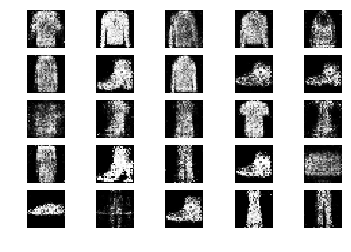

8601 [D loss: 0.690780, acc.: 53.12%] [G loss: 0.906348]
8602 [D loss: 0.693751, acc.: 53.12%] [G loss: 0.829322]
8603 [D loss: 0.640196, acc.: 67.19%] [G loss: 0.771435]
8604 [D loss: 0.626115, acc.: 67.19%] [G loss: 0.916783]
8605 [D loss: 0.622711, acc.: 60.94%] [G loss: 0.954838]
8606 [D loss: 0.608509, acc.: 67.19%] [G loss: 0.935030]
8607 [D loss: 0.626013, acc.: 67.19%] [G loss: 0.911277]
8608 [D loss: 0.630997, acc.: 68.75%] [G loss: 0.883577]
8609 [D loss: 0.733631, acc.: 62.50%] [G loss: 0.934738]
8610 [D loss: 0.654328, acc.: 65.62%] [G loss: 0.871422]
8611 [D loss: 0.790535, acc.: 43.75%] [G loss: 0.866157]
8612 [D loss: 0.634767, acc.: 62.50%] [G loss: 0.896388]
8613 [D loss: 0.682002, acc.: 57.81%] [G loss: 0.872399]
8614 [D loss: 0.670188, acc.: 59.38%] [G loss: 0.846400]
8615 [D loss: 0.588847, acc.: 68.75%] [G loss: 0.917748]
8616 [D loss: 0.635166, acc.: 70.31%] [G loss: 0.790707]
8617 [D loss: 0.723376, acc.: 45.31%] [G loss: 0.846730]
8618 [D loss: 0.620177, acc.: 6

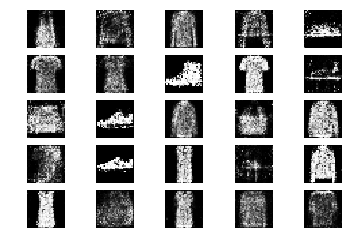

8801 [D loss: 0.682746, acc.: 57.81%] [G loss: 0.806196]
8802 [D loss: 0.627013, acc.: 67.19%] [G loss: 0.870912]
8803 [D loss: 0.656699, acc.: 59.38%] [G loss: 0.839313]
8804 [D loss: 0.657204, acc.: 56.25%] [G loss: 0.912836]
8805 [D loss: 0.668664, acc.: 56.25%] [G loss: 0.879895]
8806 [D loss: 0.622501, acc.: 64.06%] [G loss: 0.768032]
8807 [D loss: 0.665104, acc.: 54.69%] [G loss: 0.910564]
8808 [D loss: 0.714997, acc.: 50.00%] [G loss: 0.830123]
8809 [D loss: 0.694026, acc.: 54.69%] [G loss: 0.885441]
8810 [D loss: 0.693641, acc.: 60.94%] [G loss: 0.944888]
8811 [D loss: 0.679243, acc.: 57.81%] [G loss: 0.970962]
8812 [D loss: 0.677483, acc.: 54.69%] [G loss: 0.915695]
8813 [D loss: 0.645425, acc.: 65.62%] [G loss: 0.911167]
8814 [D loss: 0.670641, acc.: 60.94%] [G loss: 0.843064]
8815 [D loss: 0.650612, acc.: 60.94%] [G loss: 0.852900]
8816 [D loss: 0.665853, acc.: 60.94%] [G loss: 0.898728]
8817 [D loss: 0.627940, acc.: 70.31%] [G loss: 0.900731]
8818 [D loss: 0.668325, acc.: 6

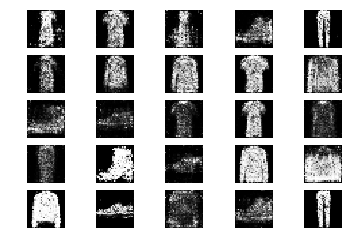

9001 [D loss: 0.695270, acc.: 54.69%] [G loss: 0.893242]
9002 [D loss: 0.697322, acc.: 56.25%] [G loss: 0.840108]
9003 [D loss: 0.650017, acc.: 62.50%] [G loss: 0.876383]
9004 [D loss: 0.600184, acc.: 70.31%] [G loss: 0.878991]
9005 [D loss: 0.654141, acc.: 64.06%] [G loss: 0.931119]
9006 [D loss: 0.704011, acc.: 59.38%] [G loss: 0.915921]
9007 [D loss: 0.651592, acc.: 62.50%] [G loss: 0.982607]
9008 [D loss: 0.660492, acc.: 64.06%] [G loss: 0.868590]
9009 [D loss: 0.639950, acc.: 64.06%] [G loss: 0.911929]
9010 [D loss: 0.588993, acc.: 73.44%] [G loss: 0.913015]
9011 [D loss: 0.653911, acc.: 65.62%] [G loss: 0.896523]
9012 [D loss: 0.633160, acc.: 60.94%] [G loss: 0.844198]
9013 [D loss: 0.637232, acc.: 65.62%] [G loss: 0.891458]
9014 [D loss: 0.646875, acc.: 73.44%] [G loss: 0.883015]
9015 [D loss: 0.672304, acc.: 54.69%] [G loss: 0.828855]
9016 [D loss: 0.686680, acc.: 57.81%] [G loss: 0.831990]
9017 [D loss: 0.745144, acc.: 45.31%] [G loss: 0.875144]
9018 [D loss: 0.659528, acc.: 6

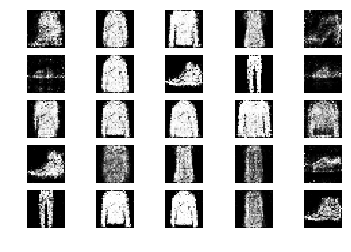

9201 [D loss: 0.693983, acc.: 60.94%] [G loss: 0.861071]
9202 [D loss: 0.660454, acc.: 59.38%] [G loss: 0.932409]
9203 [D loss: 0.677828, acc.: 56.25%] [G loss: 0.894866]
9204 [D loss: 0.669696, acc.: 62.50%] [G loss: 0.859868]
9205 [D loss: 0.612066, acc.: 76.56%] [G loss: 0.928253]
9206 [D loss: 0.652638, acc.: 62.50%] [G loss: 0.841789]
9207 [D loss: 0.644873, acc.: 59.38%] [G loss: 0.887232]
9208 [D loss: 0.658667, acc.: 57.81%] [G loss: 0.932959]
9209 [D loss: 0.634445, acc.: 67.19%] [G loss: 0.921299]
9210 [D loss: 0.661689, acc.: 59.38%] [G loss: 0.855006]
9211 [D loss: 0.666502, acc.: 60.94%] [G loss: 0.862606]
9212 [D loss: 0.655397, acc.: 68.75%] [G loss: 0.955154]
9213 [D loss: 0.620827, acc.: 67.19%] [G loss: 0.915154]
9214 [D loss: 0.597290, acc.: 70.31%] [G loss: 1.003621]
9215 [D loss: 0.728338, acc.: 57.81%] [G loss: 0.874747]
9216 [D loss: 0.679656, acc.: 60.94%] [G loss: 0.859291]
9217 [D loss: 0.677389, acc.: 57.81%] [G loss: 0.836208]
9218 [D loss: 0.624545, acc.: 6

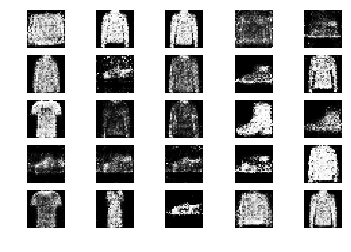

9401 [D loss: 0.628839, acc.: 64.06%] [G loss: 0.858113]
9402 [D loss: 0.721797, acc.: 57.81%] [G loss: 0.819381]
9403 [D loss: 0.610052, acc.: 62.50%] [G loss: 0.826230]
9404 [D loss: 0.583444, acc.: 70.31%] [G loss: 0.906062]
9405 [D loss: 0.631776, acc.: 65.62%] [G loss: 0.958138]
9406 [D loss: 0.702014, acc.: 51.56%] [G loss: 0.909528]
9407 [D loss: 0.649405, acc.: 68.75%] [G loss: 0.935896]
9408 [D loss: 0.648206, acc.: 67.19%] [G loss: 0.885730]
9409 [D loss: 0.611823, acc.: 62.50%] [G loss: 0.934023]
9410 [D loss: 0.664336, acc.: 57.81%] [G loss: 0.835702]
9411 [D loss: 0.743456, acc.: 50.00%] [G loss: 0.949673]
9412 [D loss: 0.640581, acc.: 67.19%] [G loss: 0.854408]
9413 [D loss: 0.711808, acc.: 51.56%] [G loss: 0.902343]
9414 [D loss: 0.637814, acc.: 56.25%] [G loss: 0.894926]
9415 [D loss: 0.684685, acc.: 57.81%] [G loss: 0.880666]
9416 [D loss: 0.649232, acc.: 68.75%] [G loss: 0.936408]
9417 [D loss: 0.622241, acc.: 59.38%] [G loss: 0.894341]
9418 [D loss: 0.724354, acc.: 5

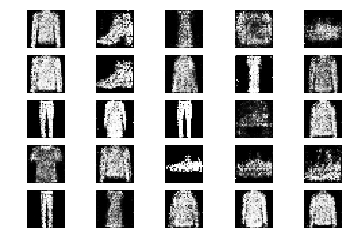

9601 [D loss: 0.678679, acc.: 64.06%] [G loss: 0.910765]
9602 [D loss: 0.637927, acc.: 57.81%] [G loss: 0.905384]
9603 [D loss: 0.640401, acc.: 65.62%] [G loss: 0.919962]
9604 [D loss: 0.652141, acc.: 62.50%] [G loss: 0.872397]
9605 [D loss: 0.590361, acc.: 65.62%] [G loss: 0.900408]
9606 [D loss: 0.648003, acc.: 57.81%] [G loss: 0.874712]
9607 [D loss: 0.624417, acc.: 62.50%] [G loss: 0.844742]
9608 [D loss: 0.708400, acc.: 59.38%] [G loss: 0.777532]
9609 [D loss: 0.701621, acc.: 51.56%] [G loss: 0.789906]
9610 [D loss: 0.707249, acc.: 50.00%] [G loss: 0.898951]
9611 [D loss: 0.672657, acc.: 56.25%] [G loss: 0.847876]
9612 [D loss: 0.640056, acc.: 67.19%] [G loss: 0.859119]
9613 [D loss: 0.615306, acc.: 68.75%] [G loss: 0.807740]
9614 [D loss: 0.618071, acc.: 62.50%] [G loss: 0.838131]
9615 [D loss: 0.661373, acc.: 59.38%] [G loss: 0.875312]
9616 [D loss: 0.664717, acc.: 59.38%] [G loss: 0.923285]
9617 [D loss: 0.612232, acc.: 67.19%] [G loss: 0.882491]
9618 [D loss: 0.614255, acc.: 6

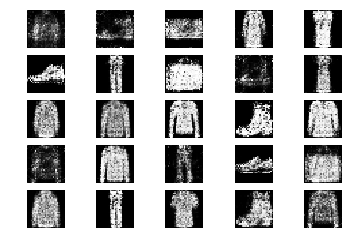

9801 [D loss: 0.663139, acc.: 59.38%] [G loss: 0.863212]
9802 [D loss: 0.665091, acc.: 60.94%] [G loss: 0.957797]
9803 [D loss: 0.621943, acc.: 68.75%] [G loss: 0.821501]
9804 [D loss: 0.673778, acc.: 59.38%] [G loss: 0.921999]
9805 [D loss: 0.650233, acc.: 64.06%] [G loss: 0.833484]
9806 [D loss: 0.658395, acc.: 60.94%] [G loss: 0.900860]
9807 [D loss: 0.688152, acc.: 57.81%] [G loss: 0.826986]
9808 [D loss: 0.655479, acc.: 57.81%] [G loss: 0.913163]
9809 [D loss: 0.639647, acc.: 64.06%] [G loss: 0.881916]
9810 [D loss: 0.627234, acc.: 67.19%] [G loss: 0.856619]
9811 [D loss: 0.658955, acc.: 57.81%] [G loss: 0.842345]
9812 [D loss: 0.657016, acc.: 57.81%] [G loss: 0.836852]
9813 [D loss: 0.630636, acc.: 64.06%] [G loss: 0.760676]
9814 [D loss: 0.658116, acc.: 64.06%] [G loss: 0.914730]
9815 [D loss: 0.638684, acc.: 64.06%] [G loss: 0.840826]
9816 [D loss: 0.720015, acc.: 59.38%] [G loss: 0.750851]
9817 [D loss: 0.705246, acc.: 51.56%] [G loss: 0.917096]
9818 [D loss: 0.674070, acc.: 5

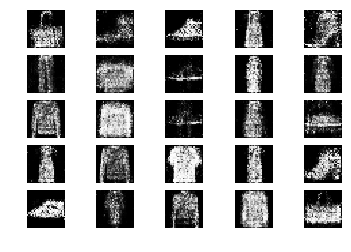

10001 [D loss: 0.617933, acc.: 67.19%] [G loss: 0.931316]
10002 [D loss: 0.673716, acc.: 53.12%] [G loss: 0.960646]
10003 [D loss: 0.650025, acc.: 57.81%] [G loss: 0.980439]
10004 [D loss: 0.641528, acc.: 60.94%] [G loss: 0.970130]
10005 [D loss: 0.588972, acc.: 73.44%] [G loss: 0.974485]
10006 [D loss: 0.632635, acc.: 59.38%] [G loss: 0.938751]
10007 [D loss: 0.715573, acc.: 53.12%] [G loss: 0.945473]
10008 [D loss: 0.664936, acc.: 59.38%] [G loss: 0.910140]
10009 [D loss: 0.650668, acc.: 57.81%] [G loss: 0.967741]
10010 [D loss: 0.679230, acc.: 57.81%] [G loss: 0.895628]
10011 [D loss: 0.637265, acc.: 71.88%] [G loss: 0.857988]
10012 [D loss: 0.632802, acc.: 64.06%] [G loss: 0.810644]
10013 [D loss: 0.673819, acc.: 57.81%] [G loss: 0.875667]
10014 [D loss: 0.653115, acc.: 62.50%] [G loss: 0.872029]
10015 [D loss: 0.676518, acc.: 59.38%] [G loss: 0.961050]
10016 [D loss: 0.597581, acc.: 67.19%] [G loss: 0.977598]
10017 [D loss: 0.659960, acc.: 65.62%] [G loss: 0.938552]
10018 [D loss:

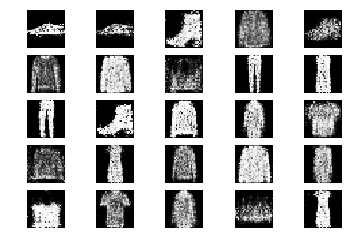

10201 [D loss: 0.605625, acc.: 71.88%] [G loss: 0.799126]
10202 [D loss: 0.656698, acc.: 60.94%] [G loss: 0.858391]
10203 [D loss: 0.644971, acc.: 62.50%] [G loss: 0.831610]
10204 [D loss: 0.685850, acc.: 57.81%] [G loss: 0.877135]
10205 [D loss: 0.585581, acc.: 73.44%] [G loss: 0.880036]
10206 [D loss: 0.698114, acc.: 53.12%] [G loss: 0.922822]
10207 [D loss: 0.697959, acc.: 54.69%] [G loss: 0.784563]
10208 [D loss: 0.666162, acc.: 62.50%] [G loss: 0.861562]
10209 [D loss: 0.642757, acc.: 64.06%] [G loss: 0.918311]
10210 [D loss: 0.746081, acc.: 48.44%] [G loss: 0.880231]
10211 [D loss: 0.609756, acc.: 71.88%] [G loss: 0.871908]
10212 [D loss: 0.605912, acc.: 65.62%] [G loss: 0.976936]
10213 [D loss: 0.612116, acc.: 75.00%] [G loss: 0.917647]
10214 [D loss: 0.659146, acc.: 51.56%] [G loss: 0.932686]
10215 [D loss: 0.742217, acc.: 45.31%] [G loss: 0.779722]
10216 [D loss: 0.592041, acc.: 75.00%] [G loss: 0.809718]
10217 [D loss: 0.732027, acc.: 46.88%] [G loss: 0.931679]
10218 [D loss:

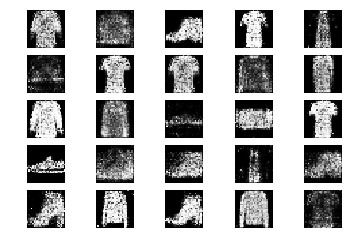

10401 [D loss: 0.609307, acc.: 62.50%] [G loss: 0.882934]
10402 [D loss: 0.656278, acc.: 62.50%] [G loss: 0.927934]
10403 [D loss: 0.672092, acc.: 56.25%] [G loss: 0.976301]
10404 [D loss: 0.652769, acc.: 67.19%] [G loss: 1.021071]
10405 [D loss: 0.695013, acc.: 50.00%] [G loss: 0.941677]
10406 [D loss: 0.661304, acc.: 64.06%] [G loss: 0.909766]
10407 [D loss: 0.746867, acc.: 45.31%] [G loss: 0.839696]
10408 [D loss: 0.641434, acc.: 62.50%] [G loss: 0.813774]
10409 [D loss: 0.684344, acc.: 65.62%] [G loss: 0.898305]
10410 [D loss: 0.653121, acc.: 60.94%] [G loss: 0.877690]
10411 [D loss: 0.669285, acc.: 54.69%] [G loss: 0.947429]
10412 [D loss: 0.656717, acc.: 65.62%] [G loss: 0.851828]
10413 [D loss: 0.600582, acc.: 70.31%] [G loss: 0.906764]
10414 [D loss: 0.677523, acc.: 57.81%] [G loss: 0.845539]
10415 [D loss: 0.606604, acc.: 62.50%] [G loss: 0.879148]
10416 [D loss: 0.674263, acc.: 57.81%] [G loss: 0.883670]
10417 [D loss: 0.676051, acc.: 56.25%] [G loss: 0.782636]
10418 [D loss:

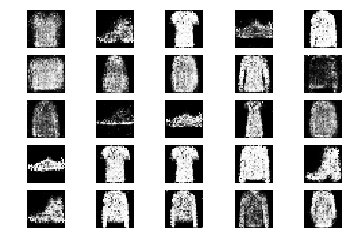

10601 [D loss: 0.658818, acc.: 59.38%] [G loss: 0.960598]
10602 [D loss: 0.635762, acc.: 68.75%] [G loss: 0.866910]
10603 [D loss: 0.703875, acc.: 53.12%] [G loss: 0.888247]
10604 [D loss: 0.672803, acc.: 64.06%] [G loss: 0.846027]
10605 [D loss: 0.642176, acc.: 60.94%] [G loss: 0.921283]
10606 [D loss: 0.638780, acc.: 64.06%] [G loss: 0.910709]
10607 [D loss: 0.608412, acc.: 70.31%] [G loss: 0.839808]
10608 [D loss: 0.694681, acc.: 50.00%] [G loss: 0.869381]
10609 [D loss: 0.695330, acc.: 59.38%] [G loss: 0.861398]
10610 [D loss: 0.631331, acc.: 68.75%] [G loss: 0.836898]
10611 [D loss: 0.704418, acc.: 48.44%] [G loss: 0.869029]
10612 [D loss: 0.683698, acc.: 57.81%] [G loss: 0.946563]
10613 [D loss: 0.721691, acc.: 43.75%] [G loss: 0.858665]
10614 [D loss: 0.664387, acc.: 57.81%] [G loss: 0.856397]
10615 [D loss: 0.629108, acc.: 67.19%] [G loss: 0.892899]
10616 [D loss: 0.659608, acc.: 67.19%] [G loss: 0.851386]
10617 [D loss: 0.673221, acc.: 56.25%] [G loss: 0.890110]
10618 [D loss:

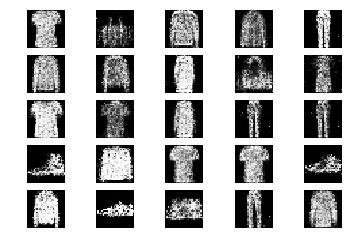

10801 [D loss: 0.658919, acc.: 60.94%] [G loss: 0.890860]
10802 [D loss: 0.644621, acc.: 62.50%] [G loss: 0.899662]
10803 [D loss: 0.619426, acc.: 70.31%] [G loss: 0.869600]
10804 [D loss: 0.725169, acc.: 45.31%] [G loss: 0.902098]
10805 [D loss: 0.577151, acc.: 67.19%] [G loss: 0.879023]
10806 [D loss: 0.618037, acc.: 60.94%] [G loss: 0.918230]
10807 [D loss: 0.706557, acc.: 54.69%] [G loss: 0.893428]
10808 [D loss: 0.632853, acc.: 68.75%] [G loss: 0.904666]
10809 [D loss: 0.637217, acc.: 65.62%] [G loss: 0.952882]
10810 [D loss: 0.660890, acc.: 56.25%] [G loss: 0.991749]
10811 [D loss: 0.618734, acc.: 70.31%] [G loss: 0.949655]
10812 [D loss: 0.627616, acc.: 64.06%] [G loss: 0.956784]
10813 [D loss: 0.620833, acc.: 70.31%] [G loss: 0.913909]
10814 [D loss: 0.664220, acc.: 57.81%] [G loss: 0.940277]
10815 [D loss: 0.652493, acc.: 59.38%] [G loss: 0.884365]
10816 [D loss: 0.690980, acc.: 54.69%] [G loss: 0.855021]
10817 [D loss: 0.664353, acc.: 59.38%] [G loss: 0.861838]
10818 [D loss:

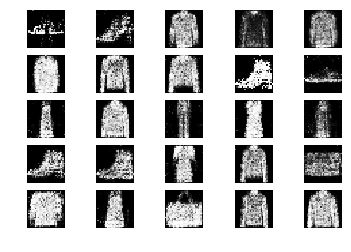

11001 [D loss: 0.683321, acc.: 51.56%] [G loss: 0.848737]
11002 [D loss: 0.636473, acc.: 60.94%] [G loss: 0.874784]
11003 [D loss: 0.669686, acc.: 59.38%] [G loss: 0.917054]
11004 [D loss: 0.616389, acc.: 62.50%] [G loss: 0.861061]
11005 [D loss: 0.656470, acc.: 60.94%] [G loss: 0.843626]
11006 [D loss: 0.670980, acc.: 57.81%] [G loss: 0.927286]
11007 [D loss: 0.661482, acc.: 57.81%] [G loss: 0.923417]
11008 [D loss: 0.661699, acc.: 60.94%] [G loss: 0.865955]
11009 [D loss: 0.651391, acc.: 60.94%] [G loss: 0.888454]
11010 [D loss: 0.655301, acc.: 56.25%] [G loss: 0.884901]
11011 [D loss: 0.653746, acc.: 60.94%] [G loss: 0.874130]
11012 [D loss: 0.651548, acc.: 65.62%] [G loss: 0.853205]
11013 [D loss: 0.673908, acc.: 56.25%] [G loss: 0.926811]
11014 [D loss: 0.663764, acc.: 56.25%] [G loss: 0.896763]
11015 [D loss: 0.666677, acc.: 64.06%] [G loss: 0.908139]
11016 [D loss: 0.713271, acc.: 54.69%] [G loss: 0.876825]
11017 [D loss: 0.738369, acc.: 46.88%] [G loss: 0.941564]
11018 [D loss:

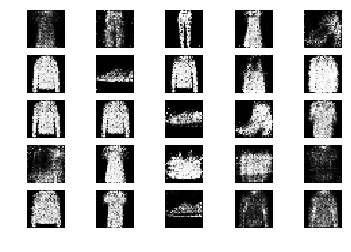

11201 [D loss: 0.694297, acc.: 60.94%] [G loss: 0.967976]
11202 [D loss: 0.627590, acc.: 65.62%] [G loss: 0.870480]
11203 [D loss: 0.682719, acc.: 59.38%] [G loss: 0.834832]
11204 [D loss: 0.654242, acc.: 59.38%] [G loss: 0.871268]
11205 [D loss: 0.709810, acc.: 50.00%] [G loss: 0.832107]
11206 [D loss: 0.670188, acc.: 57.81%] [G loss: 0.898825]
11207 [D loss: 0.660769, acc.: 56.25%] [G loss: 0.888180]
11208 [D loss: 0.643668, acc.: 67.19%] [G loss: 0.881451]
11209 [D loss: 0.617846, acc.: 65.62%] [G loss: 0.827630]
11210 [D loss: 0.697242, acc.: 54.69%] [G loss: 0.872898]
11211 [D loss: 0.681497, acc.: 51.56%] [G loss: 0.924938]
11212 [D loss: 0.623699, acc.: 64.06%] [G loss: 0.812344]
11213 [D loss: 0.630065, acc.: 64.06%] [G loss: 0.956083]
11214 [D loss: 0.628087, acc.: 65.62%] [G loss: 0.885841]
11215 [D loss: 0.627204, acc.: 70.31%] [G loss: 0.872268]
11216 [D loss: 0.664536, acc.: 62.50%] [G loss: 0.841275]
11217 [D loss: 0.619636, acc.: 70.31%] [G loss: 0.918183]
11218 [D loss:

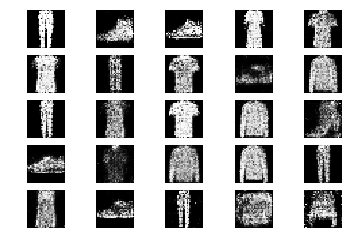

11401 [D loss: 0.666691, acc.: 51.56%] [G loss: 0.916634]
11402 [D loss: 0.679550, acc.: 60.94%] [G loss: 0.902950]
11403 [D loss: 0.629733, acc.: 70.31%] [G loss: 0.876631]
11404 [D loss: 0.623698, acc.: 65.62%] [G loss: 0.807608]
11405 [D loss: 0.684585, acc.: 59.38%] [G loss: 0.861076]
11406 [D loss: 0.607531, acc.: 70.31%] [G loss: 0.852654]
11407 [D loss: 0.684644, acc.: 56.25%] [G loss: 0.920404]
11408 [D loss: 0.673680, acc.: 57.81%] [G loss: 0.884539]
11409 [D loss: 0.633151, acc.: 60.94%] [G loss: 0.797982]
11410 [D loss: 0.701238, acc.: 43.75%] [G loss: 0.870723]
11411 [D loss: 0.664383, acc.: 60.94%] [G loss: 0.810096]
11412 [D loss: 0.690958, acc.: 60.94%] [G loss: 0.770827]
11413 [D loss: 0.657613, acc.: 59.38%] [G loss: 0.832008]
11414 [D loss: 0.714001, acc.: 56.25%] [G loss: 0.854016]
11415 [D loss: 0.648963, acc.: 57.81%] [G loss: 0.910544]
11416 [D loss: 0.650312, acc.: 59.38%] [G loss: 0.859770]
11417 [D loss: 0.624483, acc.: 68.75%] [G loss: 0.867562]
11418 [D loss:

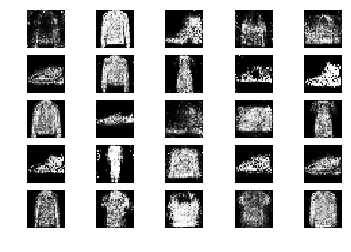

11601 [D loss: 0.648491, acc.: 57.81%] [G loss: 0.849046]
11602 [D loss: 0.635801, acc.: 62.50%] [G loss: 0.984909]
11603 [D loss: 0.649030, acc.: 60.94%] [G loss: 0.875922]
11604 [D loss: 0.631805, acc.: 60.94%] [G loss: 0.867759]
11605 [D loss: 0.688151, acc.: 54.69%] [G loss: 0.973700]
11606 [D loss: 0.655461, acc.: 65.62%] [G loss: 0.844529]
11607 [D loss: 0.694417, acc.: 56.25%] [G loss: 0.778067]
11608 [D loss: 0.646121, acc.: 60.94%] [G loss: 0.883796]
11609 [D loss: 0.653189, acc.: 56.25%] [G loss: 0.872311]
11610 [D loss: 0.659957, acc.: 60.94%] [G loss: 0.831807]
11611 [D loss: 0.690645, acc.: 53.12%] [G loss: 0.916765]
11612 [D loss: 0.684759, acc.: 57.81%] [G loss: 0.899440]
11613 [D loss: 0.645640, acc.: 64.06%] [G loss: 0.862790]
11614 [D loss: 0.620741, acc.: 65.62%] [G loss: 0.930859]
11615 [D loss: 0.643909, acc.: 60.94%] [G loss: 0.847127]
11616 [D loss: 0.698281, acc.: 54.69%] [G loss: 0.917593]
11617 [D loss: 0.662138, acc.: 54.69%] [G loss: 0.893321]
11618 [D loss:

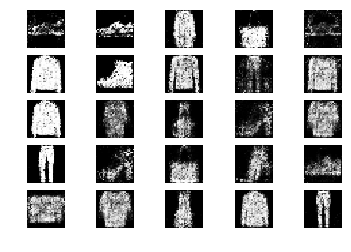

11801 [D loss: 0.692743, acc.: 57.81%] [G loss: 0.863009]
11802 [D loss: 0.596928, acc.: 70.31%] [G loss: 0.894282]
11803 [D loss: 0.603763, acc.: 70.31%] [G loss: 0.886440]
11804 [D loss: 0.649636, acc.: 60.94%] [G loss: 0.886012]
11805 [D loss: 0.638604, acc.: 57.81%] [G loss: 0.873132]
11806 [D loss: 0.600616, acc.: 70.31%] [G loss: 0.854140]
11807 [D loss: 0.704509, acc.: 54.69%] [G loss: 0.926535]
11808 [D loss: 0.610751, acc.: 64.06%] [G loss: 0.880296]
11809 [D loss: 0.668106, acc.: 56.25%] [G loss: 0.913241]
11810 [D loss: 0.651686, acc.: 62.50%] [G loss: 0.828294]
11811 [D loss: 0.686321, acc.: 57.81%] [G loss: 0.904453]
11812 [D loss: 0.672710, acc.: 51.56%] [G loss: 0.847493]
11813 [D loss: 0.669778, acc.: 56.25%] [G loss: 0.868546]
11814 [D loss: 0.689857, acc.: 60.94%] [G loss: 0.852967]
11815 [D loss: 0.599219, acc.: 67.19%] [G loss: 0.901266]
11816 [D loss: 0.661531, acc.: 57.81%] [G loss: 0.954267]
11817 [D loss: 0.645425, acc.: 65.62%] [G loss: 0.884624]
11818 [D loss:

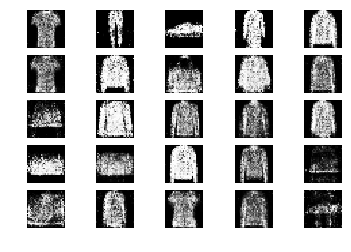

12001 [D loss: 0.694854, acc.: 54.69%] [G loss: 0.947711]
12002 [D loss: 0.586318, acc.: 68.75%] [G loss: 0.990270]
12003 [D loss: 0.668609, acc.: 64.06%] [G loss: 0.900275]
12004 [D loss: 0.696578, acc.: 60.94%] [G loss: 0.897923]
12005 [D loss: 0.634495, acc.: 64.06%] [G loss: 0.947565]
12006 [D loss: 0.676629, acc.: 56.25%] [G loss: 0.900518]
12007 [D loss: 0.665283, acc.: 62.50%] [G loss: 0.952155]
12008 [D loss: 0.632681, acc.: 64.06%] [G loss: 0.891845]
12009 [D loss: 0.632716, acc.: 60.94%] [G loss: 0.960849]
12010 [D loss: 0.611105, acc.: 68.75%] [G loss: 0.971705]
12011 [D loss: 0.612647, acc.: 64.06%] [G loss: 0.916854]
12012 [D loss: 0.761229, acc.: 42.19%] [G loss: 0.901293]
12013 [D loss: 0.724651, acc.: 45.31%] [G loss: 0.972703]
12014 [D loss: 0.641700, acc.: 60.94%] [G loss: 0.875888]
12015 [D loss: 0.670958, acc.: 64.06%] [G loss: 0.874591]
12016 [D loss: 0.646880, acc.: 60.94%] [G loss: 0.883068]
12017 [D loss: 0.662381, acc.: 57.81%] [G loss: 0.856902]
12018 [D loss:

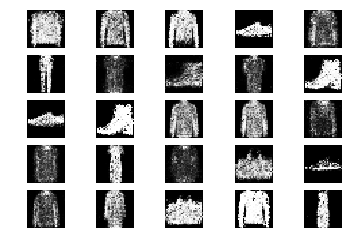

12201 [D loss: 0.680891, acc.: 57.81%] [G loss: 0.955628]
12202 [D loss: 0.654147, acc.: 57.81%] [G loss: 0.947871]
12203 [D loss: 0.657835, acc.: 60.94%] [G loss: 0.904053]
12204 [D loss: 0.639859, acc.: 62.50%] [G loss: 0.892843]
12205 [D loss: 0.587818, acc.: 67.19%] [G loss: 0.973198]
12206 [D loss: 0.746886, acc.: 45.31%] [G loss: 0.881491]
12207 [D loss: 0.709050, acc.: 54.69%] [G loss: 0.896271]
12208 [D loss: 0.630074, acc.: 64.06%] [G loss: 0.865763]
12209 [D loss: 0.663694, acc.: 57.81%] [G loss: 0.858253]
12210 [D loss: 0.653099, acc.: 62.50%] [G loss: 0.930702]
12211 [D loss: 0.696375, acc.: 56.25%] [G loss: 0.859856]
12212 [D loss: 0.571208, acc.: 67.19%] [G loss: 0.866550]
12213 [D loss: 0.716377, acc.: 46.88%] [G loss: 0.919362]
12214 [D loss: 0.681509, acc.: 62.50%] [G loss: 0.943969]
12215 [D loss: 0.625676, acc.: 70.31%] [G loss: 0.907490]
12216 [D loss: 0.662719, acc.: 60.94%] [G loss: 0.949684]
12217 [D loss: 0.652928, acc.: 64.06%] [G loss: 0.995026]
12218 [D loss:

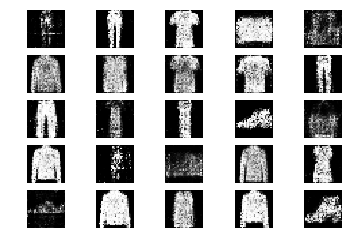

12401 [D loss: 0.662532, acc.: 59.38%] [G loss: 0.832382]
12402 [D loss: 0.668671, acc.: 62.50%] [G loss: 0.857124]
12403 [D loss: 0.609165, acc.: 68.75%] [G loss: 0.880019]
12404 [D loss: 0.698481, acc.: 51.56%] [G loss: 0.931206]
12405 [D loss: 0.737104, acc.: 45.31%] [G loss: 0.874047]
12406 [D loss: 0.590029, acc.: 70.31%] [G loss: 0.947163]
12407 [D loss: 0.652742, acc.: 59.38%] [G loss: 0.911528]
12408 [D loss: 0.684126, acc.: 62.50%] [G loss: 0.824022]
12409 [D loss: 0.701115, acc.: 59.38%] [G loss: 0.897173]
12410 [D loss: 0.612110, acc.: 62.50%] [G loss: 0.878270]
12411 [D loss: 0.697456, acc.: 59.38%] [G loss: 0.871812]
12412 [D loss: 0.652026, acc.: 62.50%] [G loss: 0.873819]
12413 [D loss: 0.668390, acc.: 53.12%] [G loss: 0.853087]
12414 [D loss: 0.684151, acc.: 56.25%] [G loss: 0.903964]
12415 [D loss: 0.666301, acc.: 59.38%] [G loss: 0.785952]
12416 [D loss: 0.596908, acc.: 70.31%] [G loss: 0.891609]
12417 [D loss: 0.581941, acc.: 79.69%] [G loss: 0.904948]
12418 [D loss:

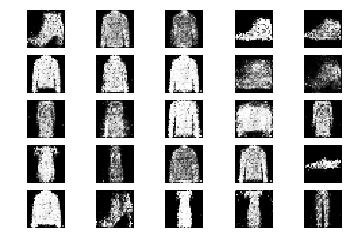

12601 [D loss: 0.618606, acc.: 64.06%] [G loss: 0.996413]
12602 [D loss: 0.663166, acc.: 54.69%] [G loss: 0.960656]
12603 [D loss: 0.628846, acc.: 60.94%] [G loss: 0.916085]
12604 [D loss: 0.570816, acc.: 70.31%] [G loss: 0.787846]
12605 [D loss: 0.668815, acc.: 57.81%] [G loss: 0.873550]
12606 [D loss: 0.750998, acc.: 51.56%] [G loss: 0.805706]
12607 [D loss: 0.719724, acc.: 48.44%] [G loss: 0.905418]
12608 [D loss: 0.621811, acc.: 68.75%] [G loss: 0.875183]
12609 [D loss: 0.676503, acc.: 56.25%] [G loss: 0.809262]
12610 [D loss: 0.675571, acc.: 67.19%] [G loss: 0.846416]
12611 [D loss: 0.629706, acc.: 62.50%] [G loss: 0.933793]
12612 [D loss: 0.649810, acc.: 62.50%] [G loss: 0.865456]
12613 [D loss: 0.629907, acc.: 65.62%] [G loss: 0.819031]
12614 [D loss: 0.712389, acc.: 53.12%] [G loss: 0.859570]
12615 [D loss: 0.656684, acc.: 68.75%] [G loss: 0.825265]
12616 [D loss: 0.650172, acc.: 54.69%] [G loss: 0.955427]
12617 [D loss: 0.651678, acc.: 62.50%] [G loss: 0.908893]
12618 [D loss:

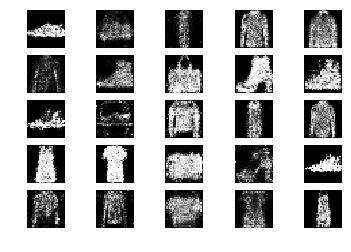

12801 [D loss: 0.635904, acc.: 60.94%] [G loss: 0.999442]
12802 [D loss: 0.682734, acc.: 50.00%] [G loss: 0.901737]
12803 [D loss: 0.607443, acc.: 71.88%] [G loss: 0.958474]
12804 [D loss: 0.670336, acc.: 56.25%] [G loss: 1.019904]
12805 [D loss: 0.655895, acc.: 60.94%] [G loss: 1.022025]
12806 [D loss: 0.651456, acc.: 65.62%] [G loss: 1.000267]
12807 [D loss: 0.682108, acc.: 64.06%] [G loss: 0.882878]
12808 [D loss: 0.686098, acc.: 60.94%] [G loss: 0.897132]
12809 [D loss: 0.664567, acc.: 60.94%] [G loss: 0.851662]
12810 [D loss: 0.646200, acc.: 62.50%] [G loss: 0.826073]
12811 [D loss: 0.677344, acc.: 59.38%] [G loss: 0.795808]
12812 [D loss: 0.680721, acc.: 59.38%] [G loss: 0.890743]
12813 [D loss: 0.612127, acc.: 73.44%] [G loss: 0.853746]
12814 [D loss: 0.690293, acc.: 67.19%] [G loss: 0.846974]
12815 [D loss: 0.663690, acc.: 62.50%] [G loss: 0.841085]
12816 [D loss: 0.628251, acc.: 62.50%] [G loss: 0.808523]
12817 [D loss: 0.676545, acc.: 59.38%] [G loss: 0.881410]
12818 [D loss:

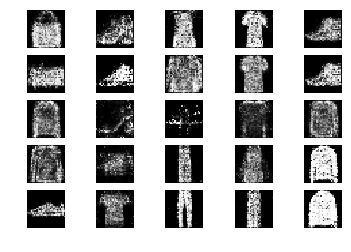

13001 [D loss: 0.650823, acc.: 57.81%] [G loss: 1.004300]
13002 [D loss: 0.648932, acc.: 57.81%] [G loss: 0.827196]
13003 [D loss: 0.638164, acc.: 70.31%] [G loss: 0.913085]
13004 [D loss: 0.636715, acc.: 57.81%] [G loss: 0.914657]
13005 [D loss: 0.654196, acc.: 56.25%] [G loss: 0.968246]
13006 [D loss: 0.639416, acc.: 62.50%] [G loss: 0.966462]
13007 [D loss: 0.648642, acc.: 65.62%] [G loss: 0.877904]
13008 [D loss: 0.632517, acc.: 56.25%] [G loss: 0.959709]
13009 [D loss: 0.623689, acc.: 64.06%] [G loss: 0.884524]
13010 [D loss: 0.641295, acc.: 56.25%] [G loss: 0.886162]
13011 [D loss: 0.687219, acc.: 57.81%] [G loss: 0.899944]
13012 [D loss: 0.648147, acc.: 59.38%] [G loss: 0.954990]
13013 [D loss: 0.683024, acc.: 54.69%] [G loss: 1.010725]
13014 [D loss: 0.633314, acc.: 59.38%] [G loss: 0.985558]
13015 [D loss: 0.692614, acc.: 50.00%] [G loss: 0.941399]
13016 [D loss: 0.658592, acc.: 64.06%] [G loss: 0.856395]
13017 [D loss: 0.605344, acc.: 67.19%] [G loss: 0.848839]
13018 [D loss:

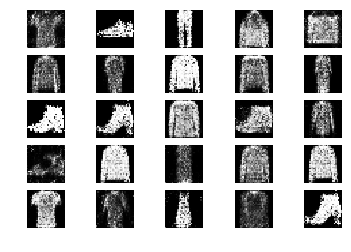

13201 [D loss: 0.673390, acc.: 60.94%] [G loss: 0.857332]
13202 [D loss: 0.649421, acc.: 62.50%] [G loss: 0.917853]
13203 [D loss: 0.613129, acc.: 73.44%] [G loss: 0.954659]
13204 [D loss: 0.651908, acc.: 62.50%] [G loss: 0.855873]
13205 [D loss: 0.689863, acc.: 60.94%] [G loss: 0.833594]
13206 [D loss: 0.662387, acc.: 53.12%] [G loss: 0.881558]
13207 [D loss: 0.626014, acc.: 64.06%] [G loss: 0.981782]
13208 [D loss: 0.740007, acc.: 45.31%] [G loss: 0.937215]
13209 [D loss: 0.709818, acc.: 45.31%] [G loss: 0.967419]
13210 [D loss: 0.657839, acc.: 59.38%] [G loss: 0.811918]
13211 [D loss: 0.673662, acc.: 67.19%] [G loss: 0.811215]
13212 [D loss: 0.603382, acc.: 73.44%] [G loss: 0.927419]
13213 [D loss: 0.646042, acc.: 60.94%] [G loss: 0.845675]
13214 [D loss: 0.629239, acc.: 70.31%] [G loss: 0.874682]
13215 [D loss: 0.700640, acc.: 51.56%] [G loss: 0.912165]
13216 [D loss: 0.706229, acc.: 53.12%] [G loss: 0.864579]
13217 [D loss: 0.680793, acc.: 54.69%] [G loss: 0.829563]
13218 [D loss:

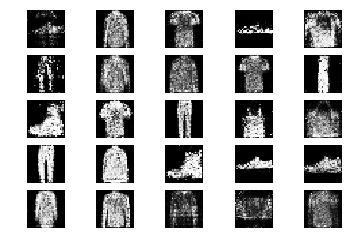

13401 [D loss: 0.625877, acc.: 70.31%] [G loss: 0.986342]
13402 [D loss: 0.632436, acc.: 67.19%] [G loss: 0.922025]
13403 [D loss: 0.633115, acc.: 60.94%] [G loss: 0.896434]
13404 [D loss: 0.672235, acc.: 62.50%] [G loss: 0.875308]
13405 [D loss: 0.679255, acc.: 46.88%] [G loss: 0.852546]
13406 [D loss: 0.638721, acc.: 62.50%] [G loss: 0.871314]
13407 [D loss: 0.648982, acc.: 70.31%] [G loss: 0.883737]
13408 [D loss: 0.663445, acc.: 59.38%] [G loss: 0.869051]
13409 [D loss: 0.654940, acc.: 57.81%] [G loss: 0.889152]
13410 [D loss: 0.639538, acc.: 68.75%] [G loss: 0.913803]
13411 [D loss: 0.615688, acc.: 65.62%] [G loss: 0.884252]
13412 [D loss: 0.617294, acc.: 64.06%] [G loss: 0.844584]
13413 [D loss: 0.650918, acc.: 57.81%] [G loss: 0.891353]
13414 [D loss: 0.661114, acc.: 53.12%] [G loss: 0.890038]
13415 [D loss: 0.652620, acc.: 59.38%] [G loss: 0.840291]
13416 [D loss: 0.631415, acc.: 70.31%] [G loss: 0.851506]
13417 [D loss: 0.638506, acc.: 59.38%] [G loss: 0.908768]
13418 [D loss:

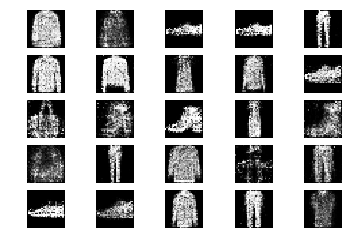

13601 [D loss: 0.716225, acc.: 46.88%] [G loss: 0.910728]
13602 [D loss: 0.613120, acc.: 62.50%] [G loss: 0.809188]
13603 [D loss: 0.727106, acc.: 48.44%] [G loss: 0.843421]
13604 [D loss: 0.604723, acc.: 60.94%] [G loss: 0.836948]
13605 [D loss: 0.722043, acc.: 45.31%] [G loss: 0.964816]
13606 [D loss: 0.706489, acc.: 53.12%] [G loss: 0.887610]
13607 [D loss: 0.669211, acc.: 64.06%] [G loss: 0.833988]
13608 [D loss: 0.587977, acc.: 70.31%] [G loss: 0.859348]
13609 [D loss: 0.633239, acc.: 65.62%] [G loss: 0.899367]
13610 [D loss: 0.670622, acc.: 60.94%] [G loss: 0.906434]
13611 [D loss: 0.641413, acc.: 65.62%] [G loss: 0.909204]
13612 [D loss: 0.674252, acc.: 59.38%] [G loss: 0.853249]
13613 [D loss: 0.712988, acc.: 46.88%] [G loss: 0.870653]
13614 [D loss: 0.683636, acc.: 53.12%] [G loss: 0.852484]
13615 [D loss: 0.703302, acc.: 51.56%] [G loss: 0.802490]
13616 [D loss: 0.633577, acc.: 62.50%] [G loss: 0.891576]
13617 [D loss: 0.690626, acc.: 53.12%] [G loss: 0.869485]
13618 [D loss:

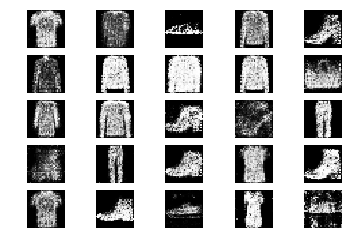

13801 [D loss: 0.640206, acc.: 64.06%] [G loss: 0.880881]
13802 [D loss: 0.688875, acc.: 57.81%] [G loss: 0.895857]
13803 [D loss: 0.688822, acc.: 57.81%] [G loss: 1.012204]
13804 [D loss: 0.656127, acc.: 60.94%] [G loss: 1.006425]
13805 [D loss: 0.674646, acc.: 59.38%] [G loss: 0.913759]
13806 [D loss: 0.641179, acc.: 68.75%] [G loss: 0.930911]
13807 [D loss: 0.665700, acc.: 59.38%] [G loss: 0.868085]
13808 [D loss: 0.647493, acc.: 56.25%] [G loss: 0.781084]
13809 [D loss: 0.705130, acc.: 51.56%] [G loss: 0.795972]
13810 [D loss: 0.703637, acc.: 51.56%] [G loss: 0.871161]
13811 [D loss: 0.646060, acc.: 57.81%] [G loss: 0.767211]
13812 [D loss: 0.678032, acc.: 64.06%] [G loss: 0.848083]
13813 [D loss: 0.627319, acc.: 65.62%] [G loss: 1.111376]
13814 [D loss: 0.651735, acc.: 57.81%] [G loss: 0.947383]
13815 [D loss: 0.652276, acc.: 60.94%] [G loss: 0.879874]
13816 [D loss: 0.621516, acc.: 59.38%] [G loss: 0.845224]
13817 [D loss: 0.690089, acc.: 56.25%] [G loss: 0.877153]
13818 [D loss:

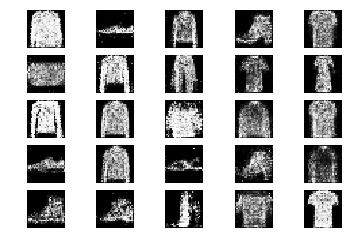

14001 [D loss: 0.648678, acc.: 60.94%] [G loss: 0.936177]
14002 [D loss: 0.684039, acc.: 59.38%] [G loss: 0.885182]
14003 [D loss: 0.642148, acc.: 62.50%] [G loss: 0.848962]
14004 [D loss: 0.638766, acc.: 57.81%] [G loss: 0.828870]
14005 [D loss: 0.614783, acc.: 62.50%] [G loss: 0.941286]
14006 [D loss: 0.629868, acc.: 64.06%] [G loss: 1.002804]
14007 [D loss: 0.678951, acc.: 64.06%] [G loss: 0.872504]
14008 [D loss: 0.685943, acc.: 54.69%] [G loss: 0.921861]
14009 [D loss: 0.619763, acc.: 64.06%] [G loss: 1.016496]
14010 [D loss: 0.628657, acc.: 60.94%] [G loss: 0.961807]
14011 [D loss: 0.654561, acc.: 60.94%] [G loss: 0.931827]
14012 [D loss: 0.611088, acc.: 73.44%] [G loss: 0.975061]
14013 [D loss: 0.660800, acc.: 60.94%] [G loss: 0.922422]
14014 [D loss: 0.666609, acc.: 65.62%] [G loss: 0.912941]
14015 [D loss: 0.643899, acc.: 60.94%] [G loss: 0.871913]
14016 [D loss: 0.662795, acc.: 62.50%] [G loss: 0.829788]
14017 [D loss: 0.678653, acc.: 59.38%] [G loss: 0.944620]
14018 [D loss:

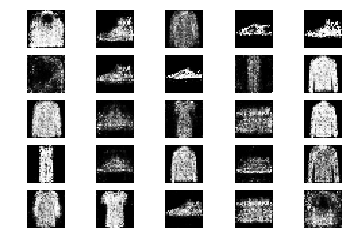

14201 [D loss: 0.653997, acc.: 64.06%] [G loss: 0.935867]
14202 [D loss: 0.626654, acc.: 67.19%] [G loss: 0.896574]
14203 [D loss: 0.611846, acc.: 70.31%] [G loss: 0.890299]
14204 [D loss: 0.685281, acc.: 53.12%] [G loss: 0.956442]
14205 [D loss: 0.590703, acc.: 67.19%] [G loss: 0.914693]
14206 [D loss: 0.675012, acc.: 56.25%] [G loss: 0.900916]
14207 [D loss: 0.690902, acc.: 59.38%] [G loss: 0.905099]
14208 [D loss: 0.652466, acc.: 62.50%] [G loss: 0.937081]
14209 [D loss: 0.667584, acc.: 53.12%] [G loss: 0.962026]
14210 [D loss: 0.631879, acc.: 67.19%] [G loss: 0.908703]
14211 [D loss: 0.674766, acc.: 62.50%] [G loss: 0.855565]
14212 [D loss: 0.733205, acc.: 51.56%] [G loss: 0.925170]
14213 [D loss: 0.672273, acc.: 59.38%] [G loss: 1.066644]
14214 [D loss: 0.637013, acc.: 65.62%] [G loss: 0.954917]
14215 [D loss: 0.707005, acc.: 54.69%] [G loss: 0.922845]
14216 [D loss: 0.703360, acc.: 51.56%] [G loss: 0.841517]
14217 [D loss: 0.665021, acc.: 56.25%] [G loss: 0.883456]
14218 [D loss:

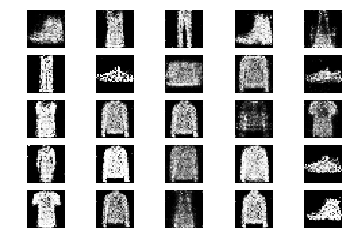

14401 [D loss: 0.678379, acc.: 59.38%] [G loss: 0.898821]
14402 [D loss: 0.620756, acc.: 57.81%] [G loss: 0.928430]
14403 [D loss: 0.610348, acc.: 67.19%] [G loss: 0.909194]
14404 [D loss: 0.633265, acc.: 64.06%] [G loss: 0.834334]
14405 [D loss: 0.628046, acc.: 65.62%] [G loss: 0.923425]
14406 [D loss: 0.689708, acc.: 59.38%] [G loss: 1.004116]
14407 [D loss: 0.695060, acc.: 57.81%] [G loss: 0.900379]
14408 [D loss: 0.640384, acc.: 62.50%] [G loss: 1.003865]
14409 [D loss: 0.653324, acc.: 59.38%] [G loss: 0.890961]
14410 [D loss: 0.613000, acc.: 62.50%] [G loss: 0.862593]
14411 [D loss: 0.712669, acc.: 46.88%] [G loss: 0.881604]
14412 [D loss: 0.694903, acc.: 53.12%] [G loss: 0.903473]
14413 [D loss: 0.646295, acc.: 65.62%] [G loss: 0.902018]
14414 [D loss: 0.672805, acc.: 60.94%] [G loss: 0.919666]
14415 [D loss: 0.666157, acc.: 64.06%] [G loss: 0.898456]
14416 [D loss: 0.653749, acc.: 60.94%] [G loss: 0.887258]
14417 [D loss: 0.712814, acc.: 56.25%] [G loss: 0.851274]
14418 [D loss:

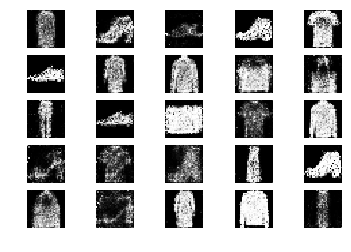

14601 [D loss: 0.746589, acc.: 50.00%] [G loss: 0.924008]
14602 [D loss: 0.635303, acc.: 64.06%] [G loss: 0.901335]
14603 [D loss: 0.654110, acc.: 64.06%] [G loss: 0.903759]
14604 [D loss: 0.643277, acc.: 65.62%] [G loss: 0.830446]
14605 [D loss: 0.657938, acc.: 56.25%] [G loss: 0.932346]
14606 [D loss: 0.591211, acc.: 67.19%] [G loss: 0.927196]
14607 [D loss: 0.718727, acc.: 51.56%] [G loss: 0.850069]
14608 [D loss: 0.689703, acc.: 62.50%] [G loss: 0.925481]
14609 [D loss: 0.656302, acc.: 68.75%] [G loss: 0.894332]
14610 [D loss: 0.661673, acc.: 56.25%] [G loss: 0.944389]
14611 [D loss: 0.636822, acc.: 65.62%] [G loss: 0.956669]
14612 [D loss: 0.633888, acc.: 59.38%] [G loss: 0.910635]
14613 [D loss: 0.678043, acc.: 65.62%] [G loss: 0.886451]
14614 [D loss: 0.743856, acc.: 46.88%] [G loss: 0.884738]
14615 [D loss: 0.556730, acc.: 78.12%] [G loss: 0.931172]
14616 [D loss: 0.661274, acc.: 59.38%] [G loss: 0.886698]
14617 [D loss: 0.706216, acc.: 54.69%] [G loss: 0.858108]
14618 [D loss:

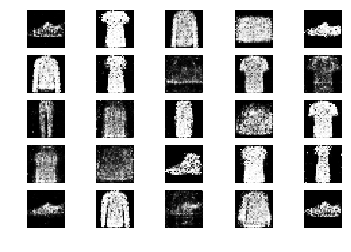

14801 [D loss: 0.669345, acc.: 59.38%] [G loss: 0.937148]
14802 [D loss: 0.660311, acc.: 65.62%] [G loss: 0.935538]
14803 [D loss: 0.610728, acc.: 64.06%] [G loss: 0.923443]
14804 [D loss: 0.633649, acc.: 62.50%] [G loss: 0.910154]
14805 [D loss: 0.668958, acc.: 60.94%] [G loss: 0.923396]
14806 [D loss: 0.604628, acc.: 67.19%] [G loss: 1.014948]
14807 [D loss: 0.655425, acc.: 57.81%] [G loss: 0.938070]
14808 [D loss: 0.671543, acc.: 57.81%] [G loss: 0.964282]
14809 [D loss: 0.718032, acc.: 60.94%] [G loss: 0.936303]
14810 [D loss: 0.734622, acc.: 51.56%] [G loss: 0.835291]
14811 [D loss: 0.694012, acc.: 53.12%] [G loss: 0.865491]
14812 [D loss: 0.655931, acc.: 56.25%] [G loss: 0.913319]
14813 [D loss: 0.632060, acc.: 60.94%] [G loss: 0.916876]
14814 [D loss: 0.715335, acc.: 48.44%] [G loss: 0.923429]
14815 [D loss: 0.616332, acc.: 67.19%] [G loss: 0.928840]
14816 [D loss: 0.709060, acc.: 56.25%] [G loss: 0.852355]
14817 [D loss: 0.652093, acc.: 59.38%] [G loss: 0.797573]
14818 [D loss:

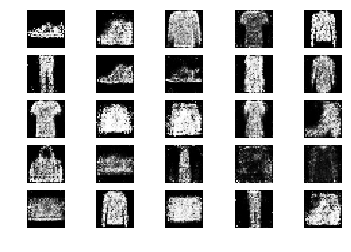

15001 [D loss: 0.620379, acc.: 71.88%] [G loss: 1.024321]
15002 [D loss: 0.668444, acc.: 60.94%] [G loss: 0.947057]
15003 [D loss: 0.637133, acc.: 56.25%] [G loss: 0.904145]
15004 [D loss: 0.649928, acc.: 62.50%] [G loss: 0.982584]
15005 [D loss: 0.712767, acc.: 56.25%] [G loss: 0.987666]
15006 [D loss: 0.638482, acc.: 64.06%] [G loss: 0.910880]
15007 [D loss: 0.765386, acc.: 40.62%] [G loss: 0.897211]
15008 [D loss: 0.619920, acc.: 65.62%] [G loss: 0.922469]
15009 [D loss: 0.645514, acc.: 59.38%] [G loss: 0.891444]
15010 [D loss: 0.602592, acc.: 70.31%] [G loss: 0.867325]
15011 [D loss: 0.657147, acc.: 57.81%] [G loss: 0.972981]
15012 [D loss: 0.570885, acc.: 79.69%] [G loss: 0.972204]
15013 [D loss: 0.694803, acc.: 60.94%] [G loss: 0.899074]
15014 [D loss: 0.586504, acc.: 78.12%] [G loss: 0.912901]
15015 [D loss: 0.578985, acc.: 75.00%] [G loss: 0.897907]
15016 [D loss: 0.618748, acc.: 64.06%] [G loss: 0.925070]
15017 [D loss: 0.635710, acc.: 62.50%] [G loss: 0.980522]
15018 [D loss:

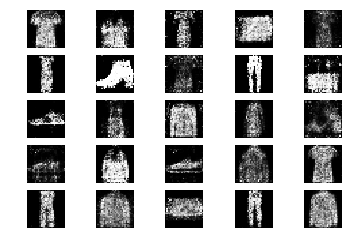

15201 [D loss: 0.646602, acc.: 57.81%] [G loss: 0.840977]
15202 [D loss: 0.614881, acc.: 62.50%] [G loss: 0.861784]
15203 [D loss: 0.625741, acc.: 68.75%] [G loss: 0.917670]
15204 [D loss: 0.656835, acc.: 59.38%] [G loss: 0.905969]
15205 [D loss: 0.670732, acc.: 64.06%] [G loss: 0.931175]
15206 [D loss: 0.602358, acc.: 70.31%] [G loss: 0.970517]
15207 [D loss: 0.614632, acc.: 59.38%] [G loss: 0.872232]
15208 [D loss: 0.608215, acc.: 62.50%] [G loss: 0.865576]
15209 [D loss: 0.688530, acc.: 59.38%] [G loss: 0.817356]
15210 [D loss: 0.651908, acc.: 60.94%] [G loss: 0.896682]
15211 [D loss: 0.632241, acc.: 57.81%] [G loss: 0.901195]
15212 [D loss: 0.705058, acc.: 62.50%] [G loss: 0.967303]
15213 [D loss: 0.647076, acc.: 67.19%] [G loss: 0.861747]
15214 [D loss: 0.671770, acc.: 60.94%] [G loss: 0.914530]
15215 [D loss: 0.631815, acc.: 57.81%] [G loss: 1.008743]
15216 [D loss: 0.634915, acc.: 65.62%] [G loss: 0.911024]
15217 [D loss: 0.590737, acc.: 75.00%] [G loss: 0.945944]
15218 [D loss:

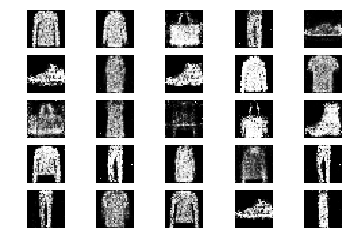

15401 [D loss: 0.627970, acc.: 67.19%] [G loss: 0.939769]
15402 [D loss: 0.683710, acc.: 59.38%] [G loss: 0.945004]
15403 [D loss: 0.639280, acc.: 67.19%] [G loss: 0.986182]
15404 [D loss: 0.639221, acc.: 65.62%] [G loss: 0.876124]
15405 [D loss: 0.643071, acc.: 64.06%] [G loss: 0.877328]
15406 [D loss: 0.671505, acc.: 65.62%] [G loss: 0.897339]
15407 [D loss: 0.636322, acc.: 65.62%] [G loss: 0.860708]
15408 [D loss: 0.603532, acc.: 70.31%] [G loss: 0.867097]
15409 [D loss: 0.591660, acc.: 70.31%] [G loss: 0.803262]
15410 [D loss: 0.621682, acc.: 64.06%] [G loss: 0.819582]
15411 [D loss: 0.570345, acc.: 68.75%] [G loss: 0.889223]
15412 [D loss: 0.573256, acc.: 73.44%] [G loss: 0.870106]
15413 [D loss: 0.704243, acc.: 54.69%] [G loss: 0.935942]
15414 [D loss: 0.586490, acc.: 76.56%] [G loss: 0.976420]
15415 [D loss: 0.640185, acc.: 60.94%] [G loss: 0.993056]
15416 [D loss: 0.692622, acc.: 56.25%] [G loss: 0.929837]
15417 [D loss: 0.603614, acc.: 73.44%] [G loss: 0.925895]
15418 [D loss:

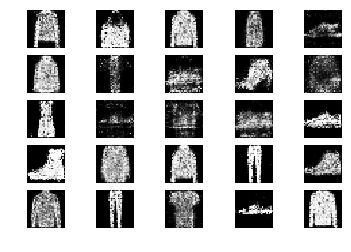

15601 [D loss: 0.654244, acc.: 59.38%] [G loss: 0.970898]
15602 [D loss: 0.604138, acc.: 68.75%] [G loss: 0.845468]
15603 [D loss: 0.645206, acc.: 65.62%] [G loss: 0.959002]
15604 [D loss: 0.697619, acc.: 54.69%] [G loss: 0.915053]
15605 [D loss: 0.687053, acc.: 53.12%] [G loss: 1.003037]
15606 [D loss: 0.677375, acc.: 60.94%] [G loss: 0.947079]
15607 [D loss: 0.708526, acc.: 51.56%] [G loss: 0.864946]
15608 [D loss: 0.651019, acc.: 67.19%] [G loss: 0.935108]
15609 [D loss: 0.687650, acc.: 53.12%] [G loss: 0.858248]
15610 [D loss: 0.688811, acc.: 51.56%] [G loss: 0.929382]
15611 [D loss: 0.709758, acc.: 50.00%] [G loss: 0.916892]
15612 [D loss: 0.648970, acc.: 64.06%] [G loss: 0.925316]
15613 [D loss: 0.582499, acc.: 71.88%] [G loss: 0.929638]
15614 [D loss: 0.720230, acc.: 60.94%] [G loss: 0.874735]
15615 [D loss: 0.630945, acc.: 62.50%] [G loss: 0.955821]
15616 [D loss: 0.666495, acc.: 57.81%] [G loss: 0.850270]
15617 [D loss: 0.717155, acc.: 50.00%] [G loss: 0.902405]
15618 [D loss:

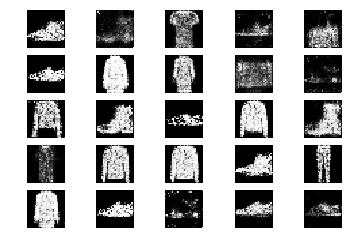

15801 [D loss: 0.653018, acc.: 57.81%] [G loss: 0.942071]
15802 [D loss: 0.624275, acc.: 67.19%] [G loss: 0.956583]
15803 [D loss: 0.666369, acc.: 53.12%] [G loss: 0.837894]
15804 [D loss: 0.636420, acc.: 65.62%] [G loss: 0.844659]
15805 [D loss: 0.662787, acc.: 54.69%] [G loss: 0.908267]
15806 [D loss: 0.706853, acc.: 56.25%] [G loss: 0.929885]
15807 [D loss: 0.641093, acc.: 59.38%] [G loss: 0.943636]
15808 [D loss: 0.676512, acc.: 56.25%] [G loss: 1.010812]
15809 [D loss: 0.734713, acc.: 48.44%] [G loss: 0.939494]
15810 [D loss: 0.622289, acc.: 62.50%] [G loss: 0.928552]
15811 [D loss: 0.659227, acc.: 57.81%] [G loss: 0.936517]
15812 [D loss: 0.635649, acc.: 60.94%] [G loss: 0.896644]
15813 [D loss: 0.615900, acc.: 65.62%] [G loss: 0.985359]
15814 [D loss: 0.695820, acc.: 62.50%] [G loss: 0.907607]
15815 [D loss: 0.711641, acc.: 43.75%] [G loss: 0.894478]
15816 [D loss: 0.695094, acc.: 64.06%] [G loss: 0.982742]
15817 [D loss: 0.682794, acc.: 48.44%] [G loss: 0.885520]
15818 [D loss:

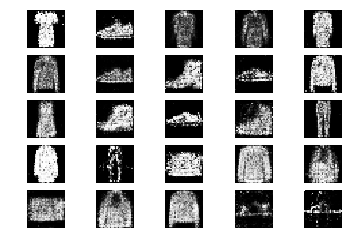

16001 [D loss: 0.632378, acc.: 62.50%] [G loss: 0.872996]
16002 [D loss: 0.713003, acc.: 46.88%] [G loss: 0.856268]
16003 [D loss: 0.688691, acc.: 59.38%] [G loss: 0.848224]
16004 [D loss: 0.653527, acc.: 60.94%] [G loss: 0.928571]
16005 [D loss: 0.620837, acc.: 68.75%] [G loss: 0.986905]
16006 [D loss: 0.713379, acc.: 50.00%] [G loss: 0.904970]
16007 [D loss: 0.671496, acc.: 60.94%] [G loss: 0.965761]
16008 [D loss: 0.630708, acc.: 60.94%] [G loss: 0.886535]
16009 [D loss: 0.657428, acc.: 54.69%] [G loss: 0.953553]
16010 [D loss: 0.637274, acc.: 67.19%] [G loss: 0.958694]
16011 [D loss: 0.653765, acc.: 60.94%] [G loss: 0.919480]
16012 [D loss: 0.662840, acc.: 60.94%] [G loss: 0.970096]
16013 [D loss: 0.584731, acc.: 68.75%] [G loss: 0.892972]
16014 [D loss: 0.737287, acc.: 46.88%] [G loss: 0.802233]
16015 [D loss: 0.620344, acc.: 65.62%] [G loss: 0.857929]
16016 [D loss: 0.656698, acc.: 67.19%] [G loss: 0.908466]
16017 [D loss: 0.620795, acc.: 64.06%] [G loss: 0.899359]
16018 [D loss:

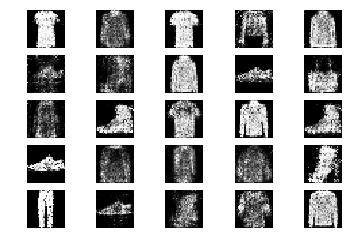

16201 [D loss: 0.669858, acc.: 57.81%] [G loss: 0.942656]
16202 [D loss: 0.670003, acc.: 60.94%] [G loss: 0.887838]
16203 [D loss: 0.654172, acc.: 54.69%] [G loss: 0.911066]
16204 [D loss: 0.602133, acc.: 70.31%] [G loss: 0.999800]
16205 [D loss: 0.695244, acc.: 59.38%] [G loss: 0.935695]
16206 [D loss: 0.646601, acc.: 67.19%] [G loss: 0.892751]
16207 [D loss: 0.664439, acc.: 57.81%] [G loss: 0.981407]
16208 [D loss: 0.606261, acc.: 67.19%] [G loss: 0.969514]
16209 [D loss: 0.603650, acc.: 68.75%] [G loss: 0.795687]
16210 [D loss: 0.630821, acc.: 57.81%] [G loss: 0.941548]
16211 [D loss: 0.672903, acc.: 60.94%] [G loss: 0.921366]
16212 [D loss: 0.616962, acc.: 64.06%] [G loss: 0.949701]
16213 [D loss: 0.637173, acc.: 59.38%] [G loss: 0.871360]
16214 [D loss: 0.628142, acc.: 64.06%] [G loss: 0.995668]
16215 [D loss: 0.650092, acc.: 59.38%] [G loss: 0.929869]
16216 [D loss: 0.643454, acc.: 62.50%] [G loss: 0.883084]
16217 [D loss: 0.651737, acc.: 68.75%] [G loss: 0.832617]
16218 [D loss:

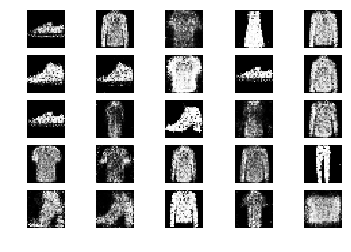

16401 [D loss: 0.652502, acc.: 62.50%] [G loss: 0.940680]
16402 [D loss: 0.690655, acc.: 60.94%] [G loss: 0.850404]
16403 [D loss: 0.670562, acc.: 60.94%] [G loss: 0.883200]
16404 [D loss: 0.657056, acc.: 60.94%] [G loss: 0.875564]
16405 [D loss: 0.706460, acc.: 50.00%] [G loss: 0.894383]
16406 [D loss: 0.667994, acc.: 57.81%] [G loss: 0.956310]
16407 [D loss: 0.581697, acc.: 68.75%] [G loss: 0.913535]
16408 [D loss: 0.704985, acc.: 54.69%] [G loss: 1.057102]
16409 [D loss: 0.603450, acc.: 62.50%] [G loss: 0.957900]
16410 [D loss: 0.680692, acc.: 60.94%] [G loss: 0.874800]
16411 [D loss: 0.636555, acc.: 62.50%] [G loss: 0.844533]
16412 [D loss: 0.689791, acc.: 65.62%] [G loss: 0.855871]
16413 [D loss: 0.674485, acc.: 57.81%] [G loss: 0.924583]
16414 [D loss: 0.608614, acc.: 64.06%] [G loss: 0.982047]
16415 [D loss: 0.635104, acc.: 56.25%] [G loss: 0.878953]
16416 [D loss: 0.662826, acc.: 60.94%] [G loss: 0.878113]
16417 [D loss: 0.650095, acc.: 62.50%] [G loss: 0.889225]
16418 [D loss:

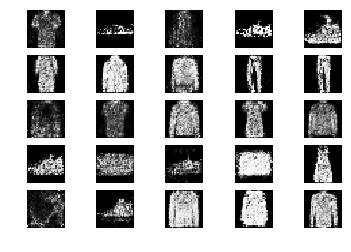

16601 [D loss: 0.583019, acc.: 75.00%] [G loss: 0.941404]
16602 [D loss: 0.605879, acc.: 71.88%] [G loss: 0.981929]
16603 [D loss: 0.690225, acc.: 56.25%] [G loss: 0.890193]
16604 [D loss: 0.671779, acc.: 60.94%] [G loss: 1.014411]
16605 [D loss: 0.718383, acc.: 51.56%] [G loss: 1.013301]
16606 [D loss: 0.655926, acc.: 54.69%] [G loss: 0.958920]
16607 [D loss: 0.595311, acc.: 75.00%] [G loss: 0.894058]
16608 [D loss: 0.700137, acc.: 59.38%] [G loss: 0.902731]
16609 [D loss: 0.633297, acc.: 65.62%] [G loss: 0.914059]
16610 [D loss: 0.671242, acc.: 62.50%] [G loss: 0.942111]
16611 [D loss: 0.687392, acc.: 56.25%] [G loss: 0.942642]
16612 [D loss: 0.622033, acc.: 59.38%] [G loss: 0.956972]
16613 [D loss: 0.619721, acc.: 67.19%] [G loss: 0.926445]
16614 [D loss: 0.695450, acc.: 50.00%] [G loss: 0.841098]
16615 [D loss: 0.614030, acc.: 68.75%] [G loss: 0.980515]
16616 [D loss: 0.643006, acc.: 59.38%] [G loss: 0.964581]
16617 [D loss: 0.609935, acc.: 71.88%] [G loss: 1.044473]
16618 [D loss:

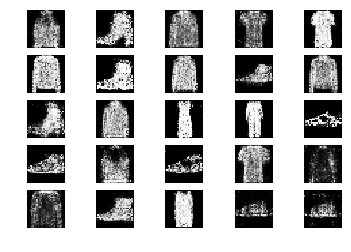

16801 [D loss: 0.686347, acc.: 56.25%] [G loss: 0.938232]
16802 [D loss: 0.687171, acc.: 57.81%] [G loss: 0.891008]
16803 [D loss: 0.669006, acc.: 59.38%] [G loss: 0.834421]
16804 [D loss: 0.615594, acc.: 64.06%] [G loss: 1.043668]
16805 [D loss: 0.665104, acc.: 62.50%] [G loss: 0.926795]
16806 [D loss: 0.678557, acc.: 56.25%] [G loss: 0.859271]
16807 [D loss: 0.656401, acc.: 64.06%] [G loss: 0.827569]
16808 [D loss: 0.670787, acc.: 59.38%] [G loss: 0.825296]
16809 [D loss: 0.684845, acc.: 59.38%] [G loss: 0.932332]
16810 [D loss: 0.597443, acc.: 81.25%] [G loss: 0.925609]
16811 [D loss: 0.650934, acc.: 59.38%] [G loss: 0.918356]
16812 [D loss: 0.606444, acc.: 70.31%] [G loss: 0.878035]
16813 [D loss: 0.667139, acc.: 60.94%] [G loss: 1.028336]
16814 [D loss: 0.575085, acc.: 68.75%] [G loss: 0.895914]
16815 [D loss: 0.649835, acc.: 51.56%] [G loss: 0.977504]
16816 [D loss: 0.623030, acc.: 60.94%] [G loss: 0.931032]
16817 [D loss: 0.744885, acc.: 54.69%] [G loss: 0.941485]
16818 [D loss:

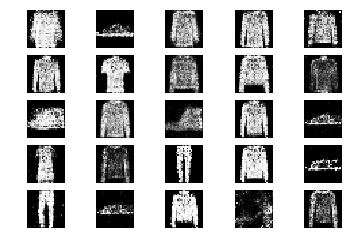

17001 [D loss: 0.584313, acc.: 75.00%] [G loss: 0.922295]
17002 [D loss: 0.592888, acc.: 71.88%] [G loss: 0.885293]
17003 [D loss: 0.648091, acc.: 62.50%] [G loss: 0.948961]
17004 [D loss: 0.660477, acc.: 59.38%] [G loss: 0.882622]
17005 [D loss: 0.660095, acc.: 67.19%] [G loss: 0.868552]
17006 [D loss: 0.646797, acc.: 59.38%] [G loss: 0.863846]
17007 [D loss: 0.624548, acc.: 68.75%] [G loss: 0.947620]
17008 [D loss: 0.720485, acc.: 51.56%] [G loss: 0.973936]
17009 [D loss: 0.608374, acc.: 65.62%] [G loss: 0.898652]
17010 [D loss: 0.632383, acc.: 67.19%] [G loss: 0.928056]
17011 [D loss: 0.629232, acc.: 70.31%] [G loss: 0.983778]
17012 [D loss: 0.677412, acc.: 54.69%] [G loss: 0.976235]
17013 [D loss: 0.706506, acc.: 53.12%] [G loss: 0.917135]
17014 [D loss: 0.663527, acc.: 56.25%] [G loss: 0.874153]
17015 [D loss: 0.681400, acc.: 59.38%] [G loss: 0.902828]
17016 [D loss: 0.628492, acc.: 64.06%] [G loss: 0.859968]
17017 [D loss: 0.700527, acc.: 56.25%] [G loss: 0.916218]
17018 [D loss:

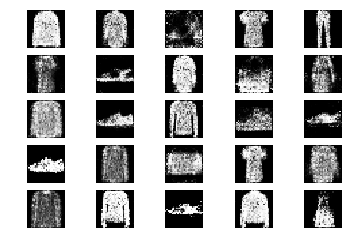

17201 [D loss: 0.624039, acc.: 70.31%] [G loss: 0.919371]
17202 [D loss: 0.677849, acc.: 46.88%] [G loss: 0.869779]
17203 [D loss: 0.664543, acc.: 54.69%] [G loss: 0.896076]
17204 [D loss: 0.580190, acc.: 71.88%] [G loss: 0.920073]
17205 [D loss: 0.628927, acc.: 60.94%] [G loss: 0.915520]
17206 [D loss: 0.598671, acc.: 71.88%] [G loss: 0.891866]
17207 [D loss: 0.640758, acc.: 59.38%] [G loss: 0.991801]
17208 [D loss: 0.632042, acc.: 68.75%] [G loss: 0.893039]
17209 [D loss: 0.649941, acc.: 64.06%] [G loss: 0.933137]
17210 [D loss: 0.604113, acc.: 65.62%] [G loss: 0.915309]
17211 [D loss: 0.576658, acc.: 73.44%] [G loss: 0.901209]
17212 [D loss: 0.647964, acc.: 59.38%] [G loss: 1.011518]
17213 [D loss: 0.560839, acc.: 73.44%] [G loss: 0.987028]
17214 [D loss: 0.661145, acc.: 60.94%] [G loss: 0.890066]
17215 [D loss: 0.625871, acc.: 64.06%] [G loss: 0.952046]
17216 [D loss: 0.600209, acc.: 71.88%] [G loss: 0.935217]
17217 [D loss: 0.615958, acc.: 67.19%] [G loss: 0.963725]
17218 [D loss:

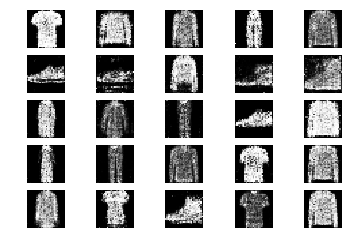

17401 [D loss: 0.684035, acc.: 51.56%] [G loss: 0.923190]
17402 [D loss: 0.585881, acc.: 70.31%] [G loss: 0.858577]
17403 [D loss: 0.604677, acc.: 70.31%] [G loss: 0.890465]
17404 [D loss: 0.702735, acc.: 50.00%] [G loss: 0.841394]
17405 [D loss: 0.744867, acc.: 56.25%] [G loss: 0.873184]
17406 [D loss: 0.621025, acc.: 64.06%] [G loss: 0.941206]
17407 [D loss: 0.661332, acc.: 57.81%] [G loss: 0.838008]
17408 [D loss: 0.651144, acc.: 53.12%] [G loss: 0.945937]
17409 [D loss: 0.671074, acc.: 59.38%] [G loss: 0.921512]
17410 [D loss: 0.656590, acc.: 62.50%] [G loss: 0.890238]
17411 [D loss: 0.681014, acc.: 57.81%] [G loss: 0.859650]
17412 [D loss: 0.627852, acc.: 70.31%] [G loss: 0.839055]
17413 [D loss: 0.768250, acc.: 45.31%] [G loss: 0.889589]
17414 [D loss: 0.672572, acc.: 56.25%] [G loss: 0.871949]
17415 [D loss: 0.662023, acc.: 60.94%] [G loss: 0.908327]
17416 [D loss: 0.628213, acc.: 71.88%] [G loss: 0.915523]
17417 [D loss: 0.681457, acc.: 48.44%] [G loss: 0.926833]
17418 [D loss:

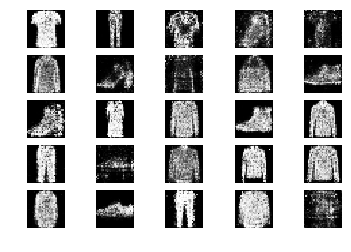

17601 [D loss: 0.619246, acc.: 65.62%] [G loss: 0.968236]
17602 [D loss: 0.675309, acc.: 57.81%] [G loss: 0.885615]
17603 [D loss: 0.625232, acc.: 68.75%] [G loss: 0.816818]
17604 [D loss: 0.606669, acc.: 70.31%] [G loss: 0.927249]
17605 [D loss: 0.668048, acc.: 64.06%] [G loss: 1.002925]
17606 [D loss: 0.691439, acc.: 50.00%] [G loss: 0.860483]
17607 [D loss: 0.590348, acc.: 73.44%] [G loss: 0.909220]
17608 [D loss: 0.632544, acc.: 65.62%] [G loss: 0.893864]
17609 [D loss: 0.602015, acc.: 71.88%] [G loss: 0.930259]
17610 [D loss: 0.668621, acc.: 56.25%] [G loss: 0.899135]
17611 [D loss: 0.600024, acc.: 70.31%] [G loss: 0.848844]
17612 [D loss: 0.639601, acc.: 57.81%] [G loss: 0.905387]
17613 [D loss: 0.653593, acc.: 62.50%] [G loss: 0.854407]
17614 [D loss: 0.655260, acc.: 62.50%] [G loss: 0.924348]
17615 [D loss: 0.673170, acc.: 59.38%] [G loss: 0.827762]
17616 [D loss: 0.631200, acc.: 67.19%] [G loss: 0.864302]
17617 [D loss: 0.678422, acc.: 53.12%] [G loss: 0.928232]
17618 [D loss:

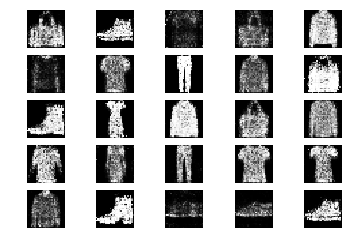

17801 [D loss: 0.661578, acc.: 57.81%] [G loss: 0.922067]
17802 [D loss: 0.699020, acc.: 54.69%] [G loss: 0.987827]
17803 [D loss: 0.667651, acc.: 57.81%] [G loss: 0.841738]
17804 [D loss: 0.700277, acc.: 54.69%] [G loss: 0.907251]
17805 [D loss: 0.664577, acc.: 51.56%] [G loss: 0.923394]
17806 [D loss: 0.738143, acc.: 50.00%] [G loss: 1.001764]
17807 [D loss: 0.630071, acc.: 59.38%] [G loss: 0.975171]
17808 [D loss: 0.618312, acc.: 65.62%] [G loss: 0.960156]
17809 [D loss: 0.640142, acc.: 57.81%] [G loss: 0.919416]
17810 [D loss: 0.537337, acc.: 75.00%] [G loss: 0.985540]
17811 [D loss: 0.602898, acc.: 70.31%] [G loss: 0.874974]
17812 [D loss: 0.676724, acc.: 62.50%] [G loss: 0.885537]
17813 [D loss: 0.657584, acc.: 59.38%] [G loss: 0.849692]
17814 [D loss: 0.631880, acc.: 60.94%] [G loss: 0.905708]
17815 [D loss: 0.603317, acc.: 65.62%] [G loss: 0.949374]
17816 [D loss: 0.693678, acc.: 60.94%] [G loss: 0.977847]
17817 [D loss: 0.677884, acc.: 60.94%] [G loss: 0.972806]
17818 [D loss:

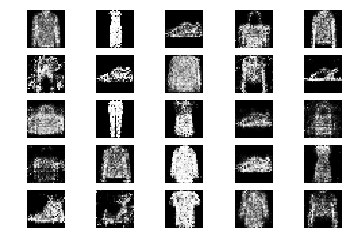

18001 [D loss: 0.678856, acc.: 60.94%] [G loss: 0.915436]
18002 [D loss: 0.630523, acc.: 59.38%] [G loss: 0.918345]
18003 [D loss: 0.660677, acc.: 67.19%] [G loss: 0.923371]
18004 [D loss: 0.611346, acc.: 68.75%] [G loss: 0.946299]
18005 [D loss: 0.614330, acc.: 71.88%] [G loss: 0.904041]
18006 [D loss: 0.635669, acc.: 65.62%] [G loss: 0.839018]
18007 [D loss: 0.622030, acc.: 54.69%] [G loss: 0.961728]
18008 [D loss: 0.683618, acc.: 54.69%] [G loss: 0.997591]
18009 [D loss: 0.679718, acc.: 51.56%] [G loss: 0.970811]
18010 [D loss: 0.668785, acc.: 59.38%] [G loss: 0.892108]
18011 [D loss: 0.629212, acc.: 67.19%] [G loss: 0.881520]
18012 [D loss: 0.713048, acc.: 57.81%] [G loss: 0.932690]
18013 [D loss: 0.678784, acc.: 60.94%] [G loss: 0.923534]
18014 [D loss: 0.644706, acc.: 59.38%] [G loss: 0.984714]
18015 [D loss: 0.602821, acc.: 68.75%] [G loss: 0.992726]
18016 [D loss: 0.631040, acc.: 60.94%] [G loss: 0.861971]
18017 [D loss: 0.696409, acc.: 56.25%] [G loss: 0.858956]
18018 [D loss:

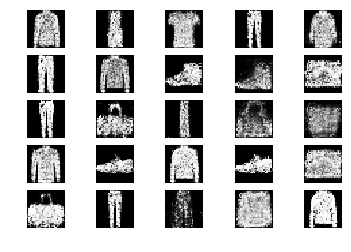

18201 [D loss: 0.624532, acc.: 57.81%] [G loss: 0.873773]
18202 [D loss: 0.661523, acc.: 59.38%] [G loss: 0.839487]
18203 [D loss: 0.597950, acc.: 70.31%] [G loss: 0.906551]
18204 [D loss: 0.634538, acc.: 64.06%] [G loss: 0.918597]
18205 [D loss: 0.665231, acc.: 56.25%] [G loss: 0.886652]
18206 [D loss: 0.642359, acc.: 60.94%] [G loss: 0.820496]
18207 [D loss: 0.602918, acc.: 71.88%] [G loss: 0.881150]
18208 [D loss: 0.656499, acc.: 64.06%] [G loss: 0.775040]
18209 [D loss: 0.650108, acc.: 65.62%] [G loss: 0.824560]
18210 [D loss: 0.644508, acc.: 60.94%] [G loss: 0.946804]
18211 [D loss: 0.652316, acc.: 54.69%] [G loss: 0.973803]
18212 [D loss: 0.701118, acc.: 50.00%] [G loss: 0.958233]
18213 [D loss: 0.651391, acc.: 60.94%] [G loss: 0.846842]
18214 [D loss: 0.700215, acc.: 54.69%] [G loss: 0.861126]
18215 [D loss: 0.698604, acc.: 48.44%] [G loss: 0.763123]
18216 [D loss: 0.647323, acc.: 64.06%] [G loss: 0.877468]
18217 [D loss: 0.665279, acc.: 53.12%] [G loss: 0.860893]
18218 [D loss:

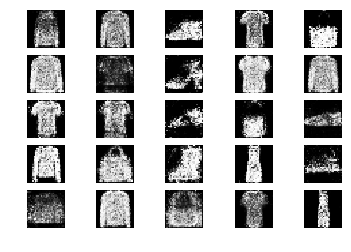

18401 [D loss: 0.643475, acc.: 68.75%] [G loss: 1.001431]
18402 [D loss: 0.657380, acc.: 56.25%] [G loss: 0.868038]
18403 [D loss: 0.707381, acc.: 56.25%] [G loss: 0.938301]
18404 [D loss: 0.574795, acc.: 76.56%] [G loss: 0.901254]
18405 [D loss: 0.645734, acc.: 62.50%] [G loss: 0.920684]
18406 [D loss: 0.701733, acc.: 51.56%] [G loss: 0.789569]
18407 [D loss: 0.707733, acc.: 51.56%] [G loss: 0.938034]
18408 [D loss: 0.687675, acc.: 51.56%] [G loss: 0.961780]
18409 [D loss: 0.690530, acc.: 48.44%] [G loss: 0.960629]
18410 [D loss: 0.660559, acc.: 59.38%] [G loss: 0.970488]
18411 [D loss: 0.670240, acc.: 56.25%] [G loss: 0.965903]
18412 [D loss: 0.704783, acc.: 60.94%] [G loss: 0.908705]
18413 [D loss: 0.694195, acc.: 57.81%] [G loss: 0.879597]
18414 [D loss: 0.687705, acc.: 56.25%] [G loss: 0.859685]
18415 [D loss: 0.631983, acc.: 67.19%] [G loss: 0.910122]
18416 [D loss: 0.680930, acc.: 64.06%] [G loss: 0.815039]
18417 [D loss: 0.694851, acc.: 50.00%] [G loss: 0.933797]
18418 [D loss:

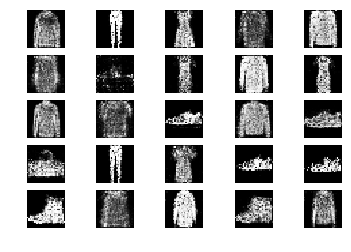

18601 [D loss: 0.591790, acc.: 68.75%] [G loss: 0.960126]
18602 [D loss: 0.633272, acc.: 62.50%] [G loss: 0.928268]
18603 [D loss: 0.696736, acc.: 53.12%] [G loss: 0.935838]
18604 [D loss: 0.624104, acc.: 65.62%] [G loss: 0.889719]
18605 [D loss: 0.686205, acc.: 53.12%] [G loss: 0.976162]
18606 [D loss: 0.595317, acc.: 68.75%] [G loss: 0.934115]
18607 [D loss: 0.685647, acc.: 67.19%] [G loss: 0.998361]
18608 [D loss: 0.579310, acc.: 68.75%] [G loss: 0.915209]
18609 [D loss: 0.638855, acc.: 59.38%] [G loss: 0.814775]
18610 [D loss: 0.655645, acc.: 59.38%] [G loss: 0.841083]
18611 [D loss: 0.649404, acc.: 60.94%] [G loss: 0.914213]
18612 [D loss: 0.673071, acc.: 56.25%] [G loss: 0.853935]
18613 [D loss: 0.610611, acc.: 67.19%] [G loss: 0.961984]
18614 [D loss: 0.643335, acc.: 57.81%] [G loss: 0.864670]
18615 [D loss: 0.719203, acc.: 46.88%] [G loss: 0.927879]
18616 [D loss: 0.669265, acc.: 56.25%] [G loss: 0.924804]
18617 [D loss: 0.590574, acc.: 64.06%] [G loss: 0.908710]
18618 [D loss:

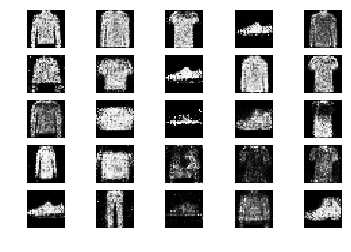

18801 [D loss: 0.568853, acc.: 75.00%] [G loss: 0.899220]
18802 [D loss: 0.625625, acc.: 64.06%] [G loss: 0.922641]
18803 [D loss: 0.675659, acc.: 59.38%] [G loss: 0.991126]
18804 [D loss: 0.686248, acc.: 53.12%] [G loss: 0.942605]
18805 [D loss: 0.645957, acc.: 64.06%] [G loss: 0.976423]
18806 [D loss: 0.682501, acc.: 48.44%] [G loss: 0.986539]
18807 [D loss: 0.728859, acc.: 50.00%] [G loss: 0.911969]
18808 [D loss: 0.659949, acc.: 62.50%] [G loss: 1.032720]
18809 [D loss: 0.578501, acc.: 71.88%] [G loss: 0.988766]
18810 [D loss: 0.695083, acc.: 50.00%] [G loss: 0.914315]
18811 [D loss: 0.663230, acc.: 64.06%] [G loss: 0.916236]
18812 [D loss: 0.597423, acc.: 65.62%] [G loss: 0.957985]
18813 [D loss: 0.653817, acc.: 59.38%] [G loss: 1.043805]
18814 [D loss: 0.632740, acc.: 67.19%] [G loss: 0.947835]
18815 [D loss: 0.680494, acc.: 60.94%] [G loss: 0.980385]
18816 [D loss: 0.674151, acc.: 56.25%] [G loss: 0.923380]
18817 [D loss: 0.601547, acc.: 71.88%] [G loss: 0.934768]
18818 [D loss:

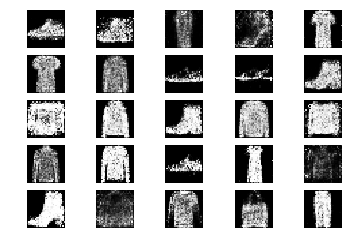

19001 [D loss: 0.611706, acc.: 65.62%] [G loss: 0.867743]
19002 [D loss: 0.642191, acc.: 60.94%] [G loss: 0.840694]
19003 [D loss: 0.616098, acc.: 70.31%] [G loss: 0.862789]
19004 [D loss: 0.711197, acc.: 54.69%] [G loss: 0.882263]
19005 [D loss: 0.673170, acc.: 54.69%] [G loss: 1.031522]
19006 [D loss: 0.668640, acc.: 57.81%] [G loss: 1.079229]
19007 [D loss: 0.659114, acc.: 64.06%] [G loss: 0.982897]
19008 [D loss: 0.722477, acc.: 50.00%] [G loss: 0.970249]
19009 [D loss: 0.660151, acc.: 59.38%] [G loss: 0.980304]
19010 [D loss: 0.614252, acc.: 65.62%] [G loss: 0.929787]
19011 [D loss: 0.638644, acc.: 62.50%] [G loss: 0.984974]
19012 [D loss: 0.700999, acc.: 57.81%] [G loss: 0.842308]
19013 [D loss: 0.634730, acc.: 62.50%] [G loss: 0.881231]
19014 [D loss: 0.598093, acc.: 65.62%] [G loss: 0.829448]
19015 [D loss: 0.671404, acc.: 53.12%] [G loss: 0.859699]
19016 [D loss: 0.640616, acc.: 60.94%] [G loss: 0.994493]
19017 [D loss: 0.580661, acc.: 75.00%] [G loss: 0.958690]
19018 [D loss:

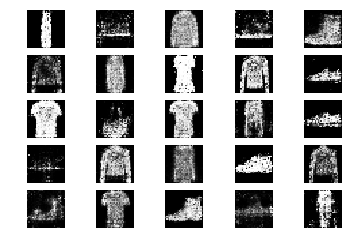

19201 [D loss: 0.698185, acc.: 56.25%] [G loss: 0.974217]
19202 [D loss: 0.654096, acc.: 67.19%] [G loss: 0.870948]
19203 [D loss: 0.684187, acc.: 54.69%] [G loss: 0.863440]
19204 [D loss: 0.597438, acc.: 71.88%] [G loss: 0.886797]
19205 [D loss: 0.680333, acc.: 62.50%] [G loss: 0.933511]
19206 [D loss: 0.577904, acc.: 67.19%] [G loss: 0.882658]
19207 [D loss: 0.678338, acc.: 62.50%] [G loss: 0.978925]
19208 [D loss: 0.683746, acc.: 57.81%] [G loss: 0.939007]
19209 [D loss: 0.654867, acc.: 64.06%] [G loss: 0.878914]
19210 [D loss: 0.687065, acc.: 57.81%] [G loss: 0.877890]
19211 [D loss: 0.629424, acc.: 67.19%] [G loss: 0.935161]
19212 [D loss: 0.662943, acc.: 59.38%] [G loss: 0.951531]
19213 [D loss: 0.643591, acc.: 65.62%] [G loss: 0.950545]
19214 [D loss: 0.694875, acc.: 57.81%] [G loss: 0.932820]
19215 [D loss: 0.645449, acc.: 64.06%] [G loss: 0.900349]
19216 [D loss: 0.634187, acc.: 64.06%] [G loss: 0.966640]
19217 [D loss: 0.680752, acc.: 56.25%] [G loss: 0.914273]
19218 [D loss:

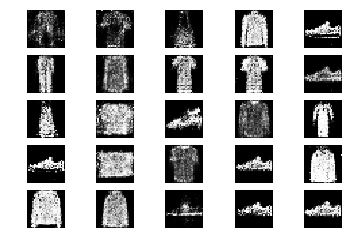

19401 [D loss: 0.686841, acc.: 54.69%] [G loss: 0.940486]
19402 [D loss: 0.660108, acc.: 62.50%] [G loss: 0.897725]
19403 [D loss: 0.591197, acc.: 68.75%] [G loss: 0.928236]
19404 [D loss: 0.607102, acc.: 68.75%] [G loss: 0.930382]
19405 [D loss: 0.652322, acc.: 64.06%] [G loss: 0.847590]
19406 [D loss: 0.738402, acc.: 45.31%] [G loss: 0.908884]
19407 [D loss: 0.688575, acc.: 60.94%] [G loss: 0.912754]
19408 [D loss: 0.639403, acc.: 67.19%] [G loss: 0.909227]
19409 [D loss: 0.580000, acc.: 68.75%] [G loss: 0.929832]
19410 [D loss: 0.640552, acc.: 68.75%] [G loss: 0.974604]
19411 [D loss: 0.696307, acc.: 53.12%] [G loss: 0.952556]
19412 [D loss: 0.640021, acc.: 65.62%] [G loss: 0.991206]
19413 [D loss: 0.669708, acc.: 56.25%] [G loss: 0.918043]
19414 [D loss: 0.646666, acc.: 67.19%] [G loss: 0.960770]
19415 [D loss: 0.592656, acc.: 67.19%] [G loss: 0.928073]
19416 [D loss: 0.642358, acc.: 67.19%] [G loss: 0.824014]
19417 [D loss: 0.610545, acc.: 62.50%] [G loss: 0.897778]
19418 [D loss:

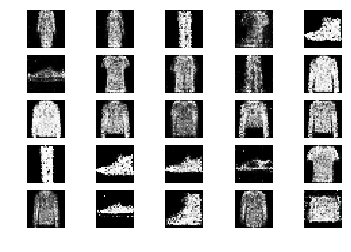

19601 [D loss: 0.656624, acc.: 60.94%] [G loss: 0.825328]
19602 [D loss: 0.651850, acc.: 64.06%] [G loss: 0.953850]
19603 [D loss: 0.653771, acc.: 64.06%] [G loss: 0.794895]
19604 [D loss: 0.648814, acc.: 70.31%] [G loss: 0.824964]
19605 [D loss: 0.649771, acc.: 60.94%] [G loss: 0.823639]
19606 [D loss: 0.708556, acc.: 48.44%] [G loss: 0.802533]
19607 [D loss: 0.657318, acc.: 57.81%] [G loss: 0.973753]
19608 [D loss: 0.651999, acc.: 62.50%] [G loss: 0.831954]
19609 [D loss: 0.611897, acc.: 67.19%] [G loss: 0.941176]
19610 [D loss: 0.638356, acc.: 56.25%] [G loss: 0.868746]
19611 [D loss: 0.668445, acc.: 57.81%] [G loss: 0.898269]
19612 [D loss: 0.682832, acc.: 59.38%] [G loss: 0.867516]
19613 [D loss: 0.646051, acc.: 59.38%] [G loss: 0.924670]
19614 [D loss: 0.665776, acc.: 53.12%] [G loss: 0.929072]
19615 [D loss: 0.596205, acc.: 67.19%] [G loss: 1.005706]
19616 [D loss: 0.668056, acc.: 60.94%] [G loss: 0.918221]
19617 [D loss: 0.679520, acc.: 60.94%] [G loss: 0.972474]
19618 [D loss:

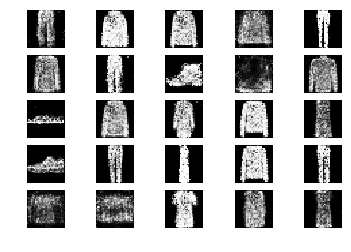

19801 [D loss: 0.683733, acc.: 54.69%] [G loss: 0.840631]
19802 [D loss: 0.670370, acc.: 57.81%] [G loss: 0.943191]
19803 [D loss: 0.645147, acc.: 59.38%] [G loss: 0.836666]
19804 [D loss: 0.615820, acc.: 62.50%] [G loss: 0.958698]
19805 [D loss: 0.647294, acc.: 64.06%] [G loss: 0.854654]
19806 [D loss: 0.659392, acc.: 68.75%] [G loss: 0.988797]
19807 [D loss: 0.707421, acc.: 57.81%] [G loss: 1.022188]
19808 [D loss: 0.599877, acc.: 71.88%] [G loss: 1.030420]
19809 [D loss: 0.616874, acc.: 70.31%] [G loss: 0.987063]
19810 [D loss: 0.667730, acc.: 56.25%] [G loss: 1.001421]
19811 [D loss: 0.633760, acc.: 64.06%] [G loss: 0.920235]
19812 [D loss: 0.691943, acc.: 53.12%] [G loss: 0.921911]
19813 [D loss: 0.673244, acc.: 59.38%] [G loss: 0.844292]
19814 [D loss: 0.607704, acc.: 62.50%] [G loss: 0.871051]
19815 [D loss: 0.740713, acc.: 50.00%] [G loss: 0.956462]
19816 [D loss: 0.612246, acc.: 68.75%] [G loss: 0.905539]
19817 [D loss: 0.701229, acc.: 54.69%] [G loss: 0.877581]
19818 [D loss:

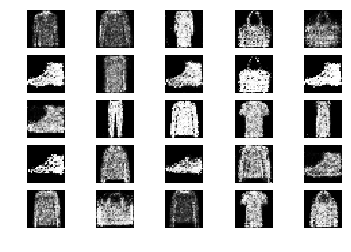

20001 [D loss: 0.625773, acc.: 71.88%] [G loss: 0.957152]
20002 [D loss: 0.680210, acc.: 60.94%] [G loss: 0.882567]
20003 [D loss: 0.670469, acc.: 56.25%] [G loss: 0.894097]
20004 [D loss: 0.688222, acc.: 59.38%] [G loss: 0.897824]
20005 [D loss: 0.634568, acc.: 59.38%] [G loss: 0.904099]
20006 [D loss: 0.650750, acc.: 59.38%] [G loss: 0.976194]
20007 [D loss: 0.620099, acc.: 64.06%] [G loss: 0.957282]
20008 [D loss: 0.618504, acc.: 64.06%] [G loss: 0.903587]
20009 [D loss: 0.660686, acc.: 62.50%] [G loss: 0.921046]
20010 [D loss: 0.619722, acc.: 65.62%] [G loss: 0.844611]
20011 [D loss: 0.556354, acc.: 73.44%] [G loss: 0.964720]
20012 [D loss: 0.652408, acc.: 59.38%] [G loss: 0.856072]
20013 [D loss: 0.613527, acc.: 71.88%] [G loss: 0.982162]
20014 [D loss: 0.696322, acc.: 53.12%] [G loss: 0.870047]
20015 [D loss: 0.682776, acc.: 53.12%] [G loss: 0.906077]
20016 [D loss: 0.655999, acc.: 56.25%] [G loss: 0.885506]
20017 [D loss: 0.562653, acc.: 73.44%] [G loss: 0.967674]
20018 [D loss:

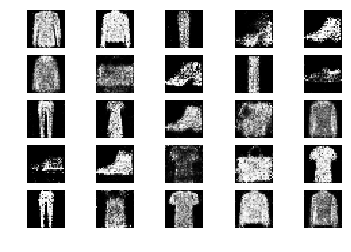

20201 [D loss: 0.659593, acc.: 62.50%] [G loss: 0.926356]
20202 [D loss: 0.634759, acc.: 62.50%] [G loss: 0.981256]
20203 [D loss: 0.674459, acc.: 60.94%] [G loss: 0.913981]
20204 [D loss: 0.638226, acc.: 64.06%] [G loss: 0.883964]
20205 [D loss: 0.609988, acc.: 67.19%] [G loss: 0.862701]
20206 [D loss: 0.695591, acc.: 54.69%] [G loss: 0.853070]
20207 [D loss: 0.662912, acc.: 60.94%] [G loss: 0.883875]
20208 [D loss: 0.665016, acc.: 60.94%] [G loss: 0.953059]
20209 [D loss: 0.626482, acc.: 64.06%] [G loss: 0.934597]
20210 [D loss: 0.636661, acc.: 70.31%] [G loss: 0.991901]
20211 [D loss: 0.670611, acc.: 62.50%] [G loss: 0.920545]
20212 [D loss: 0.663945, acc.: 59.38%] [G loss: 0.890246]
20213 [D loss: 0.698753, acc.: 54.69%] [G loss: 0.826461]
20214 [D loss: 0.621331, acc.: 62.50%] [G loss: 0.878188]
20215 [D loss: 0.669526, acc.: 51.56%] [G loss: 0.842285]
20216 [D loss: 0.671915, acc.: 51.56%] [G loss: 0.824449]
20217 [D loss: 0.751050, acc.: 43.75%] [G loss: 0.977949]
20218 [D loss:

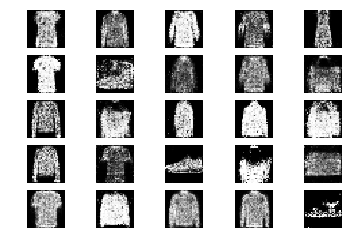

20401 [D loss: 0.695250, acc.: 51.56%] [G loss: 0.808388]
20402 [D loss: 0.654439, acc.: 56.25%] [G loss: 0.924074]
20403 [D loss: 0.590031, acc.: 65.62%] [G loss: 0.917044]
20404 [D loss: 0.657424, acc.: 60.94%] [G loss: 0.970297]
20405 [D loss: 0.712282, acc.: 51.56%] [G loss: 0.961891]
20406 [D loss: 0.631043, acc.: 60.94%] [G loss: 0.879629]
20407 [D loss: 0.679055, acc.: 54.69%] [G loss: 1.004983]
20408 [D loss: 0.618986, acc.: 65.62%] [G loss: 0.936567]
20409 [D loss: 0.631569, acc.: 62.50%] [G loss: 0.882889]
20410 [D loss: 0.618433, acc.: 64.06%] [G loss: 0.996707]
20411 [D loss: 0.699341, acc.: 57.81%] [G loss: 0.975980]
20412 [D loss: 0.649885, acc.: 60.94%] [G loss: 0.948455]
20413 [D loss: 0.710951, acc.: 57.81%] [G loss: 0.926783]
20414 [D loss: 0.665450, acc.: 60.94%] [G loss: 0.892032]
20415 [D loss: 0.672963, acc.: 60.94%] [G loss: 0.874756]
20416 [D loss: 0.645220, acc.: 62.50%] [G loss: 0.894312]
20417 [D loss: 0.630694, acc.: 68.75%] [G loss: 0.873675]
20418 [D loss:

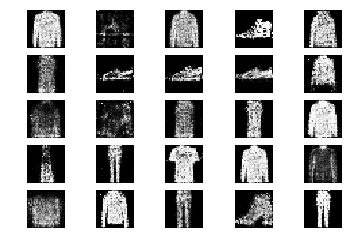

20601 [D loss: 0.650053, acc.: 59.38%] [G loss: 0.950941]
20602 [D loss: 0.582685, acc.: 71.88%] [G loss: 0.942771]
20603 [D loss: 0.585051, acc.: 70.31%] [G loss: 0.986814]
20604 [D loss: 0.656006, acc.: 57.81%] [G loss: 0.923620]
20605 [D loss: 0.697977, acc.: 57.81%] [G loss: 0.953551]
20606 [D loss: 0.627775, acc.: 64.06%] [G loss: 0.949370]
20607 [D loss: 0.645556, acc.: 68.75%] [G loss: 0.971045]
20608 [D loss: 0.590322, acc.: 68.75%] [G loss: 0.929340]
20609 [D loss: 0.587570, acc.: 67.19%] [G loss: 1.004408]
20610 [D loss: 0.657086, acc.: 59.38%] [G loss: 0.942218]
20611 [D loss: 0.621753, acc.: 62.50%] [G loss: 0.950656]
20612 [D loss: 0.725031, acc.: 59.38%] [G loss: 0.978394]
20613 [D loss: 0.603292, acc.: 67.19%] [G loss: 0.934909]
20614 [D loss: 0.632759, acc.: 71.88%] [G loss: 0.995092]
20615 [D loss: 0.717355, acc.: 48.44%] [G loss: 1.009139]
20616 [D loss: 0.678701, acc.: 60.94%] [G loss: 0.893278]
20617 [D loss: 0.631355, acc.: 70.31%] [G loss: 0.933942]
20618 [D loss:

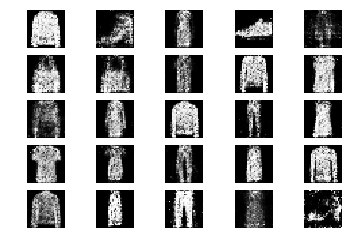

20801 [D loss: 0.668915, acc.: 57.81%] [G loss: 0.854518]
20802 [D loss: 0.663637, acc.: 60.94%] [G loss: 0.853217]
20803 [D loss: 0.645300, acc.: 65.62%] [G loss: 0.898737]
20804 [D loss: 0.617561, acc.: 73.44%] [G loss: 0.876542]
20805 [D loss: 0.629475, acc.: 59.38%] [G loss: 0.965515]
20806 [D loss: 0.673552, acc.: 65.62%] [G loss: 0.886588]
20807 [D loss: 0.645674, acc.: 65.62%] [G loss: 0.869148]
20808 [D loss: 0.597884, acc.: 64.06%] [G loss: 0.899268]
20809 [D loss: 0.600576, acc.: 67.19%] [G loss: 0.889965]
20810 [D loss: 0.719177, acc.: 54.69%] [G loss: 0.982422]
20811 [D loss: 0.647145, acc.: 56.25%] [G loss: 0.921850]
20812 [D loss: 0.627692, acc.: 71.88%] [G loss: 0.989533]
20813 [D loss: 0.621218, acc.: 65.62%] [G loss: 0.986159]
20814 [D loss: 0.644300, acc.: 64.06%] [G loss: 1.016005]
20815 [D loss: 0.713961, acc.: 60.94%] [G loss: 0.918732]
20816 [D loss: 0.637029, acc.: 62.50%] [G loss: 1.018784]
20817 [D loss: 0.670583, acc.: 59.38%] [G loss: 0.903983]
20818 [D loss:

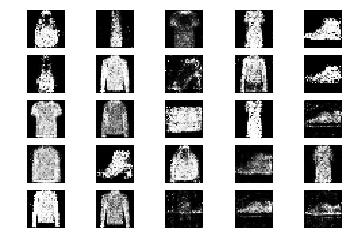

21001 [D loss: 0.642669, acc.: 65.62%] [G loss: 0.984659]
21002 [D loss: 0.664788, acc.: 60.94%] [G loss: 0.983308]
21003 [D loss: 0.630921, acc.: 65.62%] [G loss: 1.021356]
21004 [D loss: 0.614499, acc.: 71.88%] [G loss: 0.991827]
21005 [D loss: 0.669785, acc.: 57.81%] [G loss: 0.967845]
21006 [D loss: 0.621991, acc.: 70.31%] [G loss: 0.899949]
21007 [D loss: 0.701405, acc.: 59.38%] [G loss: 0.978884]
21008 [D loss: 0.615203, acc.: 67.19%] [G loss: 0.968710]
21009 [D loss: 0.675242, acc.: 57.81%] [G loss: 1.002388]
21010 [D loss: 0.650953, acc.: 59.38%] [G loss: 0.930680]
21011 [D loss: 0.584837, acc.: 73.44%] [G loss: 0.829450]
21012 [D loss: 0.592977, acc.: 65.62%] [G loss: 0.928421]
21013 [D loss: 0.660723, acc.: 53.12%] [G loss: 1.074425]
21014 [D loss: 0.662119, acc.: 62.50%] [G loss: 0.958816]
21015 [D loss: 0.654198, acc.: 54.69%] [G loss: 0.946956]
21016 [D loss: 0.726067, acc.: 56.25%] [G loss: 1.002035]
21017 [D loss: 0.669267, acc.: 70.31%] [G loss: 0.895350]
21018 [D loss:

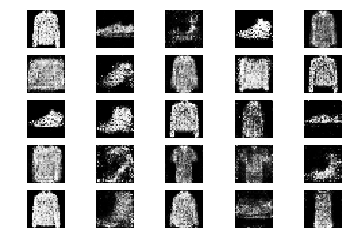

21201 [D loss: 0.589022, acc.: 71.88%] [G loss: 0.967257]
21202 [D loss: 0.621922, acc.: 71.88%] [G loss: 0.937682]
21203 [D loss: 0.742218, acc.: 48.44%] [G loss: 0.831466]
21204 [D loss: 0.681289, acc.: 56.25%] [G loss: 0.921645]
21205 [D loss: 0.661051, acc.: 60.94%] [G loss: 1.025436]
21206 [D loss: 0.584988, acc.: 64.06%] [G loss: 0.854437]
21207 [D loss: 0.604611, acc.: 70.31%] [G loss: 1.005710]
21208 [D loss: 0.631474, acc.: 64.06%] [G loss: 0.995792]
21209 [D loss: 0.684227, acc.: 53.12%] [G loss: 1.042764]
21210 [D loss: 0.619516, acc.: 65.62%] [G loss: 0.960970]
21211 [D loss: 0.737094, acc.: 51.56%] [G loss: 0.913747]
21212 [D loss: 0.591300, acc.: 76.56%] [G loss: 0.901405]
21213 [D loss: 0.654561, acc.: 60.94%] [G loss: 0.754719]
21214 [D loss: 0.681500, acc.: 50.00%] [G loss: 0.813520]
21215 [D loss: 0.682749, acc.: 60.94%] [G loss: 0.877866]
21216 [D loss: 0.605848, acc.: 64.06%] [G loss: 0.843310]
21217 [D loss: 0.626359, acc.: 62.50%] [G loss: 0.881870]
21218 [D loss:

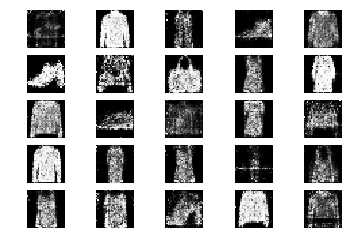

21401 [D loss: 0.632358, acc.: 59.38%] [G loss: 0.930121]
21402 [D loss: 0.653304, acc.: 54.69%] [G loss: 0.954255]
21403 [D loss: 0.629740, acc.: 64.06%] [G loss: 0.928155]
21404 [D loss: 0.670075, acc.: 54.69%] [G loss: 0.989023]
21405 [D loss: 0.622028, acc.: 67.19%] [G loss: 1.000121]
21406 [D loss: 0.626406, acc.: 65.62%] [G loss: 0.897208]
21407 [D loss: 0.685596, acc.: 65.62%] [G loss: 0.927819]
21408 [D loss: 0.666721, acc.: 53.12%] [G loss: 0.948989]
21409 [D loss: 0.568665, acc.: 71.88%] [G loss: 0.951244]
21410 [D loss: 0.706276, acc.: 53.12%] [G loss: 0.893392]
21411 [D loss: 0.623742, acc.: 64.06%] [G loss: 0.920890]
21412 [D loss: 0.646024, acc.: 64.06%] [G loss: 0.984161]
21413 [D loss: 0.665567, acc.: 56.25%] [G loss: 0.902644]
21414 [D loss: 0.646416, acc.: 64.06%] [G loss: 0.945695]
21415 [D loss: 0.624004, acc.: 70.31%] [G loss: 0.927260]
21416 [D loss: 0.661075, acc.: 57.81%] [G loss: 0.866083]
21417 [D loss: 0.675347, acc.: 56.25%] [G loss: 0.868649]
21418 [D loss:

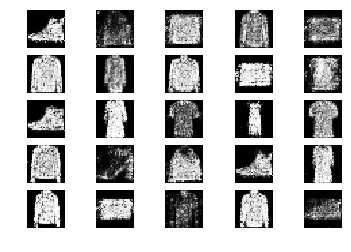

21601 [D loss: 0.649646, acc.: 56.25%] [G loss: 0.939902]
21602 [D loss: 0.680039, acc.: 62.50%] [G loss: 0.890719]
21603 [D loss: 0.600942, acc.: 70.31%] [G loss: 0.922399]
21604 [D loss: 0.640159, acc.: 65.62%] [G loss: 0.993512]
21605 [D loss: 0.660384, acc.: 59.38%] [G loss: 0.892864]
21606 [D loss: 0.596065, acc.: 64.06%] [G loss: 0.897506]
21607 [D loss: 0.634676, acc.: 65.62%] [G loss: 0.873240]
21608 [D loss: 0.592167, acc.: 75.00%] [G loss: 0.863760]
21609 [D loss: 0.589627, acc.: 73.44%] [G loss: 0.923477]
21610 [D loss: 0.610115, acc.: 67.19%] [G loss: 0.944203]
21611 [D loss: 0.669574, acc.: 62.50%] [G loss: 0.843347]
21612 [D loss: 0.708023, acc.: 56.25%] [G loss: 0.978312]
21613 [D loss: 0.562746, acc.: 70.31%] [G loss: 0.939387]
21614 [D loss: 0.681678, acc.: 57.81%] [G loss: 0.977123]
21615 [D loss: 0.647752, acc.: 60.94%] [G loss: 0.940735]
21616 [D loss: 0.629875, acc.: 62.50%] [G loss: 0.917280]
21617 [D loss: 0.604089, acc.: 65.62%] [G loss: 0.893290]
21618 [D loss:

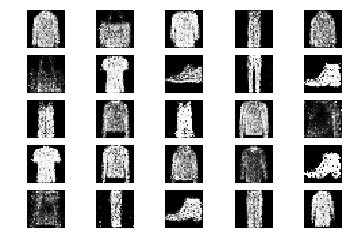

21801 [D loss: 0.684323, acc.: 60.94%] [G loss: 0.981581]
21802 [D loss: 0.605137, acc.: 64.06%] [G loss: 0.905814]
21803 [D loss: 0.650019, acc.: 64.06%] [G loss: 0.984110]
21804 [D loss: 0.630504, acc.: 68.75%] [G loss: 0.957354]
21805 [D loss: 0.686759, acc.: 64.06%] [G loss: 0.946468]
21806 [D loss: 0.620393, acc.: 67.19%] [G loss: 0.921109]
21807 [D loss: 0.638839, acc.: 65.62%] [G loss: 0.985485]
21808 [D loss: 0.660850, acc.: 62.50%] [G loss: 0.944170]
21809 [D loss: 0.584940, acc.: 64.06%] [G loss: 0.974091]
21810 [D loss: 0.699771, acc.: 54.69%] [G loss: 0.955597]
21811 [D loss: 0.598482, acc.: 65.62%] [G loss: 0.983395]
21812 [D loss: 0.638526, acc.: 70.31%] [G loss: 1.017147]
21813 [D loss: 0.651157, acc.: 57.81%] [G loss: 0.916189]
21814 [D loss: 0.663266, acc.: 59.38%] [G loss: 0.799761]
21815 [D loss: 0.655764, acc.: 60.94%] [G loss: 0.969217]
21816 [D loss: 0.681608, acc.: 51.56%] [G loss: 0.975620]
21817 [D loss: 0.632168, acc.: 59.38%] [G loss: 0.979545]
21818 [D loss:

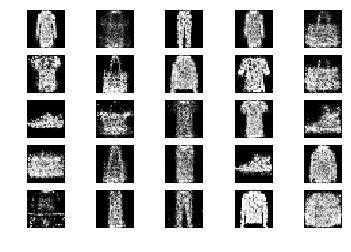

22001 [D loss: 0.596131, acc.: 64.06%] [G loss: 1.044728]
22002 [D loss: 0.654451, acc.: 64.06%] [G loss: 0.942217]
22003 [D loss: 0.646859, acc.: 57.81%] [G loss: 0.943687]
22004 [D loss: 0.699309, acc.: 56.25%] [G loss: 0.943391]
22005 [D loss: 0.625680, acc.: 71.88%] [G loss: 0.943652]
22006 [D loss: 0.598593, acc.: 67.19%] [G loss: 0.978936]
22007 [D loss: 0.723256, acc.: 56.25%] [G loss: 0.938090]
22008 [D loss: 0.670797, acc.: 51.56%] [G loss: 0.899425]
22009 [D loss: 0.641856, acc.: 62.50%] [G loss: 0.897338]
22010 [D loss: 0.619792, acc.: 65.62%] [G loss: 0.960666]
22011 [D loss: 0.649246, acc.: 59.38%] [G loss: 0.871275]
22012 [D loss: 0.623245, acc.: 60.94%] [G loss: 0.958919]
22013 [D loss: 0.675836, acc.: 62.50%] [G loss: 0.913847]
22014 [D loss: 0.626091, acc.: 65.62%] [G loss: 1.006394]
22015 [D loss: 0.645327, acc.: 67.19%] [G loss: 0.869092]
22016 [D loss: 0.596339, acc.: 68.75%] [G loss: 1.002494]
22017 [D loss: 0.589773, acc.: 71.88%] [G loss: 0.949178]
22018 [D loss:

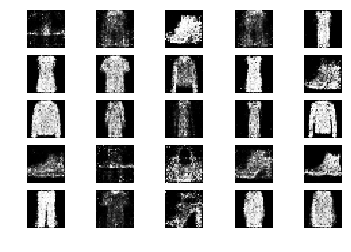

22201 [D loss: 0.607122, acc.: 65.62%] [G loss: 0.925779]
22202 [D loss: 0.606066, acc.: 64.06%] [G loss: 0.871459]
22203 [D loss: 0.695833, acc.: 54.69%] [G loss: 1.019456]
22204 [D loss: 0.654400, acc.: 62.50%] [G loss: 1.035971]
22205 [D loss: 0.631620, acc.: 67.19%] [G loss: 0.897893]
22206 [D loss: 0.615647, acc.: 64.06%] [G loss: 0.861257]
22207 [D loss: 0.613644, acc.: 65.62%] [G loss: 0.883856]
22208 [D loss: 0.627083, acc.: 71.88%] [G loss: 0.928593]
22209 [D loss: 0.625726, acc.: 62.50%] [G loss: 0.957397]
22210 [D loss: 0.642279, acc.: 65.62%] [G loss: 0.874090]
22211 [D loss: 0.628083, acc.: 64.06%] [G loss: 1.100990]
22212 [D loss: 0.618715, acc.: 67.19%] [G loss: 0.983052]
22213 [D loss: 0.697598, acc.: 64.06%] [G loss: 1.010400]
22214 [D loss: 0.646699, acc.: 59.38%] [G loss: 1.023044]
22215 [D loss: 0.635337, acc.: 64.06%] [G loss: 1.065815]
22216 [D loss: 0.601096, acc.: 70.31%] [G loss: 1.027443]
22217 [D loss: 0.703163, acc.: 53.12%] [G loss: 1.069818]
22218 [D loss:

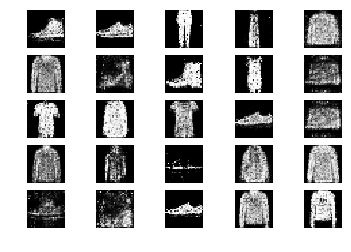

22401 [D loss: 0.640559, acc.: 57.81%] [G loss: 0.914097]
22402 [D loss: 0.668553, acc.: 57.81%] [G loss: 0.984772]
22403 [D loss: 0.654458, acc.: 59.38%] [G loss: 0.962923]
22404 [D loss: 0.726912, acc.: 43.75%] [G loss: 0.870135]
22405 [D loss: 0.670784, acc.: 53.12%] [G loss: 0.918002]
22406 [D loss: 0.618555, acc.: 68.75%] [G loss: 0.980050]
22407 [D loss: 0.612180, acc.: 65.62%] [G loss: 0.871065]
22408 [D loss: 0.610956, acc.: 65.62%] [G loss: 0.895756]
22409 [D loss: 0.633481, acc.: 64.06%] [G loss: 0.880786]
22410 [D loss: 0.650202, acc.: 57.81%] [G loss: 0.972623]
22411 [D loss: 0.662608, acc.: 56.25%] [G loss: 0.939416]
22412 [D loss: 0.664887, acc.: 60.94%] [G loss: 0.954955]
22413 [D loss: 0.667679, acc.: 57.81%] [G loss: 0.942238]
22414 [D loss: 0.628645, acc.: 64.06%] [G loss: 0.865609]
22415 [D loss: 0.695596, acc.: 51.56%] [G loss: 0.852276]
22416 [D loss: 0.579474, acc.: 68.75%] [G loss: 0.838428]
22417 [D loss: 0.664589, acc.: 57.81%] [G loss: 1.020930]
22418 [D loss:

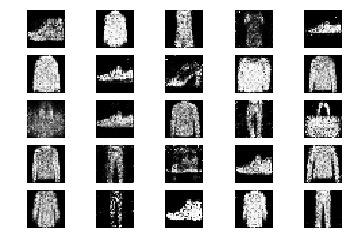

22601 [D loss: 0.680669, acc.: 60.94%] [G loss: 0.968568]
22602 [D loss: 0.620055, acc.: 67.19%] [G loss: 1.017272]
22603 [D loss: 0.619214, acc.: 64.06%] [G loss: 0.848600]
22604 [D loss: 0.603516, acc.: 64.06%] [G loss: 0.918489]
22605 [D loss: 0.585267, acc.: 75.00%] [G loss: 0.965744]
22606 [D loss: 0.640234, acc.: 64.06%] [G loss: 0.905323]
22607 [D loss: 0.662729, acc.: 60.94%] [G loss: 0.945123]
22608 [D loss: 0.575525, acc.: 68.75%] [G loss: 0.902458]
22609 [D loss: 0.667266, acc.: 59.38%] [G loss: 0.820409]
22610 [D loss: 0.711394, acc.: 50.00%] [G loss: 0.893534]
22611 [D loss: 0.694993, acc.: 59.38%] [G loss: 0.925770]
22612 [D loss: 0.616052, acc.: 62.50%] [G loss: 1.018095]
22613 [D loss: 0.647451, acc.: 59.38%] [G loss: 0.938544]
22614 [D loss: 0.629695, acc.: 64.06%] [G loss: 0.929880]
22615 [D loss: 0.683844, acc.: 64.06%] [G loss: 0.899595]
22616 [D loss: 0.580388, acc.: 71.88%] [G loss: 0.963941]
22617 [D loss: 0.666305, acc.: 62.50%] [G loss: 0.886491]
22618 [D loss:

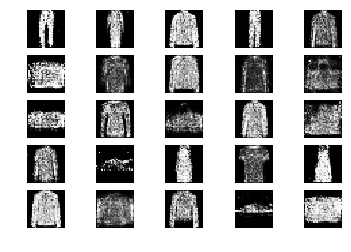

22801 [D loss: 0.660017, acc.: 64.06%] [G loss: 0.988242]
22802 [D loss: 0.655765, acc.: 60.94%] [G loss: 0.899715]
22803 [D loss: 0.646712, acc.: 60.94%] [G loss: 1.002211]
22804 [D loss: 0.628281, acc.: 62.50%] [G loss: 1.044508]
22805 [D loss: 0.631597, acc.: 60.94%] [G loss: 0.989118]
22806 [D loss: 0.638506, acc.: 56.25%] [G loss: 0.853896]
22807 [D loss: 0.579593, acc.: 73.44%] [G loss: 0.944756]
22808 [D loss: 0.713521, acc.: 59.38%] [G loss: 0.976705]
22809 [D loss: 0.672396, acc.: 59.38%] [G loss: 0.896120]
22810 [D loss: 0.676086, acc.: 62.50%] [G loss: 0.974996]
22811 [D loss: 0.669628, acc.: 54.69%] [G loss: 1.010032]
22812 [D loss: 0.572601, acc.: 78.12%] [G loss: 0.962235]
22813 [D loss: 0.605496, acc.: 71.88%] [G loss: 0.963997]
22814 [D loss: 0.694949, acc.: 57.81%] [G loss: 0.916652]
22815 [D loss: 0.614032, acc.: 68.75%] [G loss: 0.937274]
22816 [D loss: 0.655361, acc.: 62.50%] [G loss: 0.952361]
22817 [D loss: 0.656076, acc.: 60.94%] [G loss: 0.923808]
22818 [D loss:

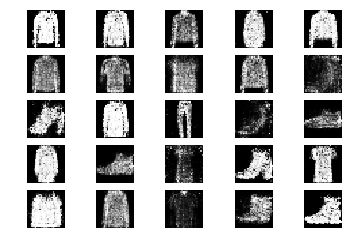

23001 [D loss: 0.663245, acc.: 57.81%] [G loss: 0.945688]
23002 [D loss: 0.607347, acc.: 71.88%] [G loss: 0.918176]
23003 [D loss: 0.628372, acc.: 65.62%] [G loss: 0.887258]
23004 [D loss: 0.603512, acc.: 64.06%] [G loss: 0.970803]
23005 [D loss: 0.651912, acc.: 65.62%] [G loss: 0.901156]
23006 [D loss: 0.642446, acc.: 62.50%] [G loss: 0.949081]
23007 [D loss: 0.572505, acc.: 70.31%] [G loss: 1.027167]
23008 [D loss: 0.656549, acc.: 59.38%] [G loss: 1.042084]
23009 [D loss: 0.653237, acc.: 64.06%] [G loss: 0.899004]
23010 [D loss: 0.657359, acc.: 62.50%] [G loss: 0.957417]
23011 [D loss: 0.664849, acc.: 59.38%] [G loss: 0.925300]
23012 [D loss: 0.621010, acc.: 68.75%] [G loss: 0.948974]
23013 [D loss: 0.617431, acc.: 64.06%] [G loss: 0.941153]
23014 [D loss: 0.617746, acc.: 59.38%] [G loss: 0.914154]
23015 [D loss: 0.672329, acc.: 56.25%] [G loss: 0.904423]
23016 [D loss: 0.665335, acc.: 62.50%] [G loss: 0.903651]
23017 [D loss: 0.626784, acc.: 68.75%] [G loss: 1.036652]
23018 [D loss:

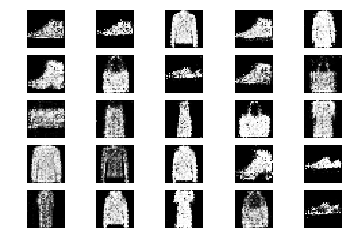

23201 [D loss: 0.648229, acc.: 64.06%] [G loss: 0.911597]
23202 [D loss: 0.652237, acc.: 57.81%] [G loss: 0.904513]
23203 [D loss: 0.594440, acc.: 67.19%] [G loss: 0.877046]
23204 [D loss: 0.635562, acc.: 62.50%] [G loss: 0.877951]
23205 [D loss: 0.639715, acc.: 64.06%] [G loss: 0.956161]
23206 [D loss: 0.658777, acc.: 62.50%] [G loss: 0.943546]
23207 [D loss: 0.691702, acc.: 51.56%] [G loss: 0.858837]
23208 [D loss: 0.638790, acc.: 62.50%] [G loss: 0.952820]
23209 [D loss: 0.622411, acc.: 62.50%] [G loss: 0.920040]
23210 [D loss: 0.697814, acc.: 56.25%] [G loss: 0.943505]
23211 [D loss: 0.656166, acc.: 57.81%] [G loss: 0.924940]
23212 [D loss: 0.709439, acc.: 56.25%] [G loss: 0.905683]
23213 [D loss: 0.710306, acc.: 42.19%] [G loss: 0.923911]
23214 [D loss: 0.745140, acc.: 45.31%] [G loss: 0.898428]
23215 [D loss: 0.623132, acc.: 67.19%] [G loss: 0.944507]
23216 [D loss: 0.666101, acc.: 60.94%] [G loss: 0.928505]
23217 [D loss: 0.678177, acc.: 48.44%] [G loss: 0.907593]
23218 [D loss:

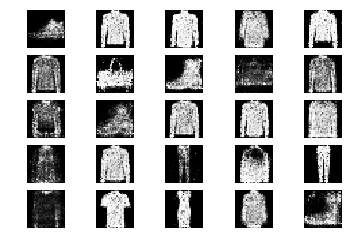

23401 [D loss: 0.647461, acc.: 59.38%] [G loss: 0.882667]
23402 [D loss: 0.623728, acc.: 70.31%] [G loss: 0.893494]
23403 [D loss: 0.677995, acc.: 56.25%] [G loss: 0.873535]
23404 [D loss: 0.704133, acc.: 50.00%] [G loss: 0.868743]
23405 [D loss: 0.668639, acc.: 64.06%] [G loss: 0.908597]
23406 [D loss: 0.705558, acc.: 56.25%] [G loss: 0.934245]
23407 [D loss: 0.646604, acc.: 64.06%] [G loss: 0.935772]
23408 [D loss: 0.708978, acc.: 48.44%] [G loss: 0.971775]
23409 [D loss: 0.659538, acc.: 60.94%] [G loss: 0.965684]
23410 [D loss: 0.639790, acc.: 65.62%] [G loss: 0.965854]
23411 [D loss: 0.607644, acc.: 67.19%] [G loss: 0.919759]
23412 [D loss: 0.615849, acc.: 62.50%] [G loss: 1.024054]
23413 [D loss: 0.713686, acc.: 56.25%] [G loss: 0.970995]
23414 [D loss: 0.651973, acc.: 62.50%] [G loss: 0.954803]
23415 [D loss: 0.655526, acc.: 59.38%] [G loss: 0.982139]
23416 [D loss: 0.616515, acc.: 70.31%] [G loss: 1.039672]
23417 [D loss: 0.642232, acc.: 67.19%] [G loss: 0.893563]
23418 [D loss:

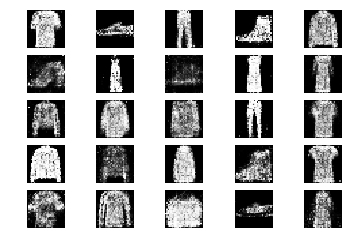

23601 [D loss: 0.654090, acc.: 64.06%] [G loss: 0.916808]
23602 [D loss: 0.642085, acc.: 67.19%] [G loss: 0.898043]
23603 [D loss: 0.600214, acc.: 67.19%] [G loss: 0.934939]
23604 [D loss: 0.608432, acc.: 68.75%] [G loss: 0.954133]
23605 [D loss: 0.653235, acc.: 64.06%] [G loss: 0.922925]
23606 [D loss: 0.667054, acc.: 57.81%] [G loss: 0.820569]
23607 [D loss: 0.704331, acc.: 54.69%] [G loss: 0.854406]
23608 [D loss: 0.671771, acc.: 57.81%] [G loss: 0.998407]
23609 [D loss: 0.585475, acc.: 76.56%] [G loss: 0.961967]
23610 [D loss: 0.551918, acc.: 78.12%] [G loss: 0.987629]
23611 [D loss: 0.653803, acc.: 59.38%] [G loss: 1.008691]
23612 [D loss: 0.691838, acc.: 54.69%] [G loss: 0.935541]
23613 [D loss: 0.572106, acc.: 70.31%] [G loss: 0.876493]
23614 [D loss: 0.622452, acc.: 60.94%] [G loss: 0.876108]
23615 [D loss: 0.646212, acc.: 56.25%] [G loss: 0.904284]
23616 [D loss: 0.607135, acc.: 65.62%] [G loss: 1.025293]
23617 [D loss: 0.612829, acc.: 64.06%] [G loss: 0.961525]
23618 [D loss:

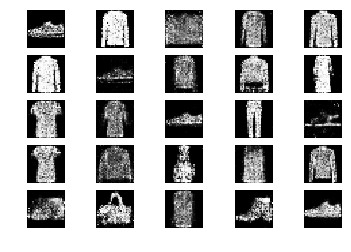

23801 [D loss: 0.671231, acc.: 60.94%] [G loss: 0.973946]
23802 [D loss: 0.629990, acc.: 62.50%] [G loss: 0.933133]
23803 [D loss: 0.629685, acc.: 67.19%] [G loss: 0.986877]
23804 [D loss: 0.704903, acc.: 48.44%] [G loss: 0.907004]
23805 [D loss: 0.619707, acc.: 64.06%] [G loss: 0.958104]
23806 [D loss: 0.612910, acc.: 64.06%] [G loss: 0.933676]
23807 [D loss: 0.667488, acc.: 62.50%] [G loss: 0.898512]
23808 [D loss: 0.624780, acc.: 60.94%] [G loss: 0.947729]
23809 [D loss: 0.652845, acc.: 62.50%] [G loss: 0.960790]
23810 [D loss: 0.637987, acc.: 62.50%] [G loss: 1.037910]
23811 [D loss: 0.597426, acc.: 71.88%] [G loss: 0.872865]
23812 [D loss: 0.653546, acc.: 57.81%] [G loss: 0.921278]
23813 [D loss: 0.684061, acc.: 57.81%] [G loss: 0.820486]
23814 [D loss: 0.650230, acc.: 67.19%] [G loss: 0.895172]
23815 [D loss: 0.667859, acc.: 57.81%] [G loss: 0.930508]
23816 [D loss: 0.651372, acc.: 60.94%] [G loss: 0.844341]
23817 [D loss: 0.691422, acc.: 51.56%] [G loss: 0.776958]
23818 [D loss:

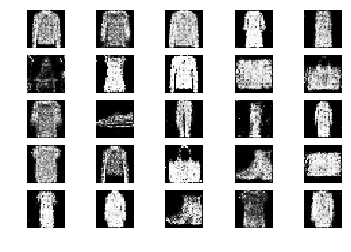

24001 [D loss: 0.759752, acc.: 46.88%] [G loss: 0.887844]
24002 [D loss: 0.642816, acc.: 64.06%] [G loss: 0.787663]
24003 [D loss: 0.640715, acc.: 64.06%] [G loss: 0.936734]
24004 [D loss: 0.598600, acc.: 64.06%] [G loss: 0.921444]
24005 [D loss: 0.648873, acc.: 62.50%] [G loss: 0.981206]
24006 [D loss: 0.698867, acc.: 51.56%] [G loss: 0.886042]
24007 [D loss: 0.689487, acc.: 57.81%] [G loss: 0.944801]
24008 [D loss: 0.668893, acc.: 59.38%] [G loss: 0.986392]
24009 [D loss: 0.627679, acc.: 65.62%] [G loss: 0.962906]
24010 [D loss: 0.661733, acc.: 57.81%] [G loss: 0.956050]
24011 [D loss: 0.667814, acc.: 62.50%] [G loss: 0.905662]
24012 [D loss: 0.694986, acc.: 54.69%] [G loss: 0.888764]
24013 [D loss: 0.675986, acc.: 60.94%] [G loss: 0.945725]
24014 [D loss: 0.647710, acc.: 60.94%] [G loss: 0.998397]
24015 [D loss: 0.618859, acc.: 70.31%] [G loss: 0.952812]
24016 [D loss: 0.690606, acc.: 60.94%] [G loss: 0.848104]
24017 [D loss: 0.678252, acc.: 54.69%] [G loss: 0.830466]
24018 [D loss:

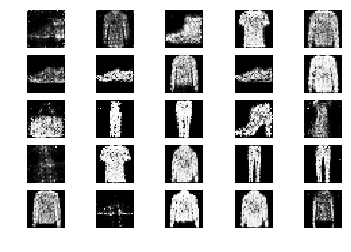

24201 [D loss: 0.609684, acc.: 73.44%] [G loss: 1.025758]
24202 [D loss: 0.697658, acc.: 57.81%] [G loss: 1.063148]
24203 [D loss: 0.599082, acc.: 67.19%] [G loss: 0.992511]
24204 [D loss: 0.661726, acc.: 59.38%] [G loss: 0.902390]
24205 [D loss: 0.650102, acc.: 56.25%] [G loss: 0.866477]
24206 [D loss: 0.690538, acc.: 54.69%] [G loss: 0.924725]
24207 [D loss: 0.665077, acc.: 57.81%] [G loss: 0.892840]
24208 [D loss: 0.712793, acc.: 53.12%] [G loss: 0.969095]
24209 [D loss: 0.656752, acc.: 60.94%] [G loss: 0.996896]
24210 [D loss: 0.652193, acc.: 62.50%] [G loss: 1.028796]
24211 [D loss: 0.646273, acc.: 62.50%] [G loss: 0.941905]
24212 [D loss: 0.644698, acc.: 60.94%] [G loss: 0.897559]
24213 [D loss: 0.638980, acc.: 60.94%] [G loss: 0.909732]
24214 [D loss: 0.618196, acc.: 71.88%] [G loss: 0.911680]
24215 [D loss: 0.587015, acc.: 64.06%] [G loss: 0.913886]
24216 [D loss: 0.632996, acc.: 59.38%] [G loss: 0.891020]
24217 [D loss: 0.598800, acc.: 71.88%] [G loss: 0.933255]
24218 [D loss:

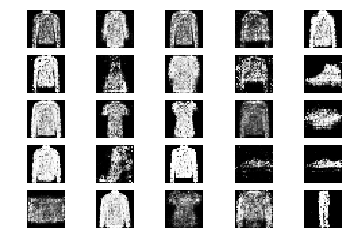

24401 [D loss: 0.645681, acc.: 62.50%] [G loss: 0.896106]
24402 [D loss: 0.660839, acc.: 56.25%] [G loss: 0.984436]
24403 [D loss: 0.734346, acc.: 51.56%] [G loss: 0.889457]
24404 [D loss: 0.583940, acc.: 68.75%] [G loss: 0.986020]
24405 [D loss: 0.629797, acc.: 57.81%] [G loss: 0.995861]
24406 [D loss: 0.597193, acc.: 70.31%] [G loss: 1.087039]
24407 [D loss: 0.640952, acc.: 64.06%] [G loss: 1.009313]
24408 [D loss: 0.797162, acc.: 53.12%] [G loss: 0.981031]
24409 [D loss: 0.667792, acc.: 50.00%] [G loss: 0.932476]
24410 [D loss: 0.670137, acc.: 56.25%] [G loss: 0.938269]
24411 [D loss: 0.611812, acc.: 68.75%] [G loss: 0.918416]
24412 [D loss: 0.610644, acc.: 67.19%] [G loss: 0.938933]
24413 [D loss: 0.695409, acc.: 53.12%] [G loss: 0.916389]
24414 [D loss: 0.649124, acc.: 56.25%] [G loss: 0.901197]
24415 [D loss: 0.631716, acc.: 64.06%] [G loss: 1.008736]
24416 [D loss: 0.656938, acc.: 54.69%] [G loss: 0.971176]
24417 [D loss: 0.696019, acc.: 54.69%] [G loss: 1.006247]
24418 [D loss:

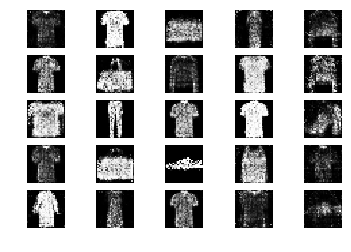

24601 [D loss: 0.610702, acc.: 64.06%] [G loss: 0.935458]
24602 [D loss: 0.622395, acc.: 56.25%] [G loss: 0.925188]
24603 [D loss: 0.623760, acc.: 60.94%] [G loss: 0.976683]
24604 [D loss: 0.584669, acc.: 71.88%] [G loss: 1.064274]
24605 [D loss: 0.615525, acc.: 67.19%] [G loss: 1.008699]
24606 [D loss: 0.618408, acc.: 65.62%] [G loss: 0.878558]
24607 [D loss: 0.760161, acc.: 46.88%] [G loss: 0.891203]
24608 [D loss: 0.670663, acc.: 64.06%] [G loss: 0.955474]
24609 [D loss: 0.730046, acc.: 54.69%] [G loss: 0.905770]
24610 [D loss: 0.623652, acc.: 68.75%] [G loss: 0.906759]
24611 [D loss: 0.702929, acc.: 45.31%] [G loss: 0.992326]
24612 [D loss: 0.634611, acc.: 65.62%] [G loss: 1.026906]
24613 [D loss: 0.594542, acc.: 71.88%] [G loss: 0.913850]
24614 [D loss: 0.582026, acc.: 68.75%] [G loss: 0.918746]
24615 [D loss: 0.635421, acc.: 67.19%] [G loss: 0.963741]
24616 [D loss: 0.706815, acc.: 57.81%] [G loss: 0.929396]
24617 [D loss: 0.620485, acc.: 73.44%] [G loss: 0.853337]
24618 [D loss:

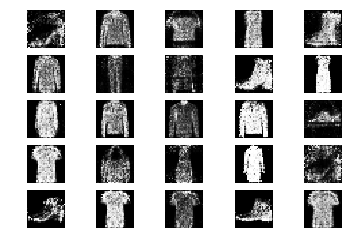

24801 [D loss: 0.627540, acc.: 60.94%] [G loss: 1.008644]
24802 [D loss: 0.613741, acc.: 64.06%] [G loss: 0.943906]
24803 [D loss: 0.688785, acc.: 54.69%] [G loss: 0.940601]
24804 [D loss: 0.634894, acc.: 64.06%] [G loss: 0.903175]
24805 [D loss: 0.702516, acc.: 53.12%] [G loss: 0.839072]
24806 [D loss: 0.643738, acc.: 65.62%] [G loss: 0.927746]
24807 [D loss: 0.668556, acc.: 53.12%] [G loss: 0.866993]
24808 [D loss: 0.691144, acc.: 54.69%] [G loss: 0.818569]
24809 [D loss: 0.609784, acc.: 65.62%] [G loss: 0.927115]
24810 [D loss: 0.616374, acc.: 64.06%] [G loss: 0.974643]
24811 [D loss: 0.661282, acc.: 59.38%] [G loss: 0.997243]
24812 [D loss: 0.580638, acc.: 70.31%] [G loss: 0.870077]
24813 [D loss: 0.734053, acc.: 48.44%] [G loss: 0.923582]
24814 [D loss: 0.609111, acc.: 62.50%] [G loss: 0.911573]
24815 [D loss: 0.638510, acc.: 68.75%] [G loss: 0.968674]
24816 [D loss: 0.732840, acc.: 56.25%] [G loss: 0.911652]
24817 [D loss: 0.643102, acc.: 60.94%] [G loss: 0.897749]
24818 [D loss:

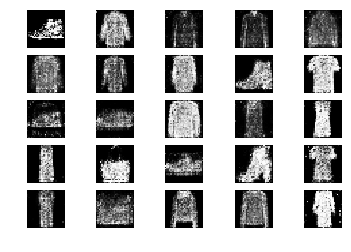

25001 [D loss: 0.562871, acc.: 73.44%] [G loss: 0.993647]
25002 [D loss: 0.642615, acc.: 68.75%] [G loss: 0.879428]
25003 [D loss: 0.673617, acc.: 57.81%] [G loss: 0.937834]
25004 [D loss: 0.678516, acc.: 56.25%] [G loss: 0.942596]
25005 [D loss: 0.675296, acc.: 60.94%] [G loss: 0.922813]
25006 [D loss: 0.692826, acc.: 59.38%] [G loss: 0.916452]
25007 [D loss: 0.559072, acc.: 70.31%] [G loss: 0.886682]
25008 [D loss: 0.585087, acc.: 76.56%] [G loss: 0.956199]
25009 [D loss: 0.636579, acc.: 64.06%] [G loss: 0.975932]
25010 [D loss: 0.667095, acc.: 62.50%] [G loss: 0.927477]
25011 [D loss: 0.675799, acc.: 59.38%] [G loss: 1.023936]
25012 [D loss: 0.577615, acc.: 76.56%] [G loss: 1.049528]
25013 [D loss: 0.653639, acc.: 57.81%] [G loss: 1.029738]
25014 [D loss: 0.643384, acc.: 64.06%] [G loss: 0.962539]
25015 [D loss: 0.590991, acc.: 70.31%] [G loss: 0.990113]
25016 [D loss: 0.605044, acc.: 78.12%] [G loss: 0.996727]
25017 [D loss: 0.566271, acc.: 70.31%] [G loss: 0.968912]
25018 [D loss:

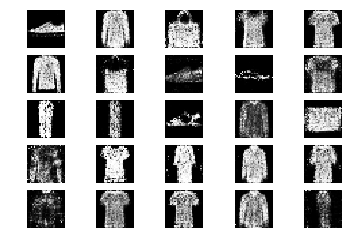

25201 [D loss: 0.617648, acc.: 68.75%] [G loss: 0.935864]
25202 [D loss: 0.692413, acc.: 54.69%] [G loss: 0.964927]
25203 [D loss: 0.588330, acc.: 71.88%] [G loss: 0.981674]
25204 [D loss: 0.646541, acc.: 60.94%] [G loss: 0.973191]
25205 [D loss: 0.684371, acc.: 60.94%] [G loss: 0.863709]
25206 [D loss: 0.613378, acc.: 65.62%] [G loss: 0.959787]
25207 [D loss: 0.666751, acc.: 62.50%] [G loss: 0.916249]
25208 [D loss: 0.640224, acc.: 62.50%] [G loss: 0.898669]
25209 [D loss: 0.605637, acc.: 62.50%] [G loss: 0.888869]
25210 [D loss: 0.629705, acc.: 62.50%] [G loss: 0.852682]
25211 [D loss: 0.727683, acc.: 53.12%] [G loss: 0.959608]
25212 [D loss: 0.618538, acc.: 65.62%] [G loss: 0.941322]
25213 [D loss: 0.674934, acc.: 59.38%] [G loss: 0.872123]
25214 [D loss: 0.678924, acc.: 62.50%] [G loss: 0.881554]
25215 [D loss: 0.589220, acc.: 71.88%] [G loss: 0.973352]
25216 [D loss: 0.658434, acc.: 65.62%] [G loss: 1.051547]
25217 [D loss: 0.626769, acc.: 60.94%] [G loss: 0.942259]
25218 [D loss:

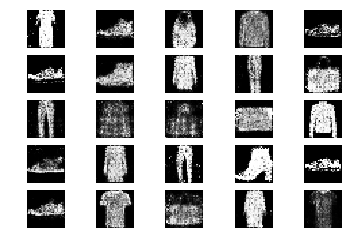

25401 [D loss: 0.647087, acc.: 71.88%] [G loss: 0.963892]
25402 [D loss: 0.654992, acc.: 64.06%] [G loss: 0.970974]
25403 [D loss: 0.618368, acc.: 64.06%] [G loss: 0.988299]
25404 [D loss: 0.610988, acc.: 70.31%] [G loss: 0.876718]
25405 [D loss: 0.594649, acc.: 62.50%] [G loss: 0.924722]
25406 [D loss: 0.608849, acc.: 68.75%] [G loss: 0.951065]
25407 [D loss: 0.630934, acc.: 62.50%] [G loss: 0.961469]
25408 [D loss: 0.682697, acc.: 57.81%] [G loss: 0.969386]
25409 [D loss: 0.649334, acc.: 60.94%] [G loss: 0.961149]
25410 [D loss: 0.626666, acc.: 59.38%] [G loss: 0.946858]
25411 [D loss: 0.708528, acc.: 57.81%] [G loss: 0.835733]
25412 [D loss: 0.678740, acc.: 57.81%] [G loss: 0.928678]
25413 [D loss: 0.590027, acc.: 73.44%] [G loss: 0.918619]
25414 [D loss: 0.704161, acc.: 54.69%] [G loss: 0.859598]
25415 [D loss: 0.644844, acc.: 62.50%] [G loss: 0.867305]
25416 [D loss: 0.701620, acc.: 54.69%] [G loss: 0.935727]
25417 [D loss: 0.668215, acc.: 57.81%] [G loss: 1.027021]
25418 [D loss:

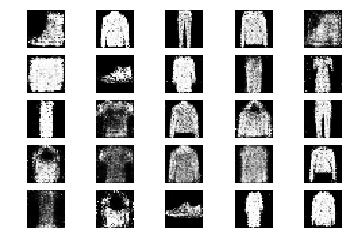

25601 [D loss: 0.621394, acc.: 67.19%] [G loss: 0.959904]
25602 [D loss: 0.675154, acc.: 56.25%] [G loss: 0.922022]
25603 [D loss: 0.593229, acc.: 67.19%] [G loss: 1.014111]
25604 [D loss: 0.631061, acc.: 68.75%] [G loss: 0.935607]
25605 [D loss: 0.625208, acc.: 67.19%] [G loss: 0.952022]
25606 [D loss: 0.650436, acc.: 60.94%] [G loss: 0.925084]
25607 [D loss: 0.696075, acc.: 51.56%] [G loss: 1.012868]
25608 [D loss: 0.704826, acc.: 57.81%] [G loss: 0.945313]
25609 [D loss: 0.645790, acc.: 59.38%] [G loss: 0.873213]
25610 [D loss: 0.630554, acc.: 67.19%] [G loss: 0.986445]
25611 [D loss: 0.663258, acc.: 62.50%] [G loss: 0.871889]
25612 [D loss: 0.659257, acc.: 57.81%] [G loss: 0.894705]
25613 [D loss: 0.648210, acc.: 56.25%] [G loss: 0.884646]
25614 [D loss: 0.645655, acc.: 57.81%] [G loss: 0.938947]
25615 [D loss: 0.647272, acc.: 59.38%] [G loss: 1.004624]
25616 [D loss: 0.645059, acc.: 64.06%] [G loss: 0.888244]
25617 [D loss: 0.729400, acc.: 59.38%] [G loss: 0.895066]
25618 [D loss:

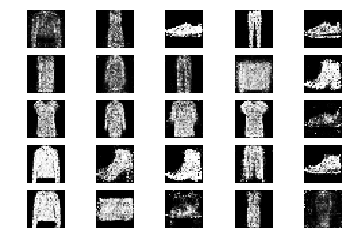

25801 [D loss: 0.622720, acc.: 67.19%] [G loss: 1.006517]
25802 [D loss: 0.634573, acc.: 60.94%] [G loss: 0.889383]
25803 [D loss: 0.657706, acc.: 59.38%] [G loss: 0.875055]
25804 [D loss: 0.654600, acc.: 67.19%] [G loss: 0.912960]
25805 [D loss: 0.580842, acc.: 65.62%] [G loss: 0.933925]
25806 [D loss: 0.669779, acc.: 54.69%] [G loss: 0.954353]
25807 [D loss: 0.653478, acc.: 60.94%] [G loss: 1.031659]
25808 [D loss: 0.670346, acc.: 57.81%] [G loss: 0.905071]
25809 [D loss: 0.675767, acc.: 57.81%] [G loss: 0.990098]
25810 [D loss: 0.605654, acc.: 73.44%] [G loss: 0.934955]
25811 [D loss: 0.635024, acc.: 60.94%] [G loss: 0.933321]
25812 [D loss: 0.629025, acc.: 62.50%] [G loss: 0.998243]
25813 [D loss: 0.616189, acc.: 64.06%] [G loss: 0.851737]
25814 [D loss: 0.580873, acc.: 70.31%] [G loss: 0.946663]
25815 [D loss: 0.745883, acc.: 56.25%] [G loss: 0.871682]
25816 [D loss: 0.586642, acc.: 70.31%] [G loss: 0.919118]
25817 [D loss: 0.629767, acc.: 65.62%] [G loss: 0.944796]
25818 [D loss:

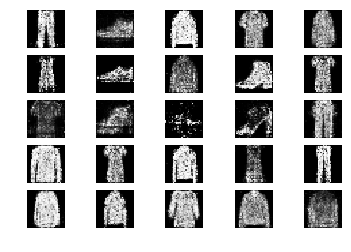

26001 [D loss: 0.657629, acc.: 64.06%] [G loss: 0.912532]
26002 [D loss: 0.656421, acc.: 65.62%] [G loss: 0.978447]
26003 [D loss: 0.610972, acc.: 67.19%] [G loss: 0.916156]
26004 [D loss: 0.688677, acc.: 53.12%] [G loss: 0.984961]
26005 [D loss: 0.652520, acc.: 59.38%] [G loss: 0.933174]
26006 [D loss: 0.606476, acc.: 64.06%] [G loss: 0.971581]
26007 [D loss: 0.631825, acc.: 64.06%] [G loss: 1.012043]
26008 [D loss: 0.570937, acc.: 68.75%] [G loss: 0.965878]
26009 [D loss: 0.593546, acc.: 73.44%] [G loss: 1.062264]
26010 [D loss: 0.707562, acc.: 51.56%] [G loss: 0.882490]
26011 [D loss: 0.584931, acc.: 76.56%] [G loss: 0.859467]
26012 [D loss: 0.791304, acc.: 50.00%] [G loss: 0.846626]
26013 [D loss: 0.611632, acc.: 62.50%] [G loss: 0.915431]
26014 [D loss: 0.611437, acc.: 71.88%] [G loss: 0.875340]
26015 [D loss: 0.604978, acc.: 67.19%] [G loss: 0.841624]
26016 [D loss: 0.643120, acc.: 62.50%] [G loss: 0.953665]
26017 [D loss: 0.625231, acc.: 67.19%] [G loss: 0.973070]
26018 [D loss:

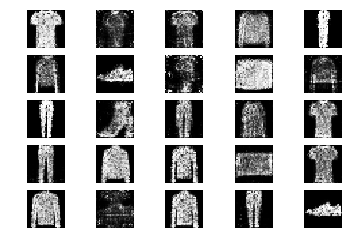

26201 [D loss: 0.679868, acc.: 59.38%] [G loss: 0.924753]
26202 [D loss: 0.625665, acc.: 70.31%] [G loss: 0.891580]
26203 [D loss: 0.630380, acc.: 60.94%] [G loss: 0.982434]
26204 [D loss: 0.611720, acc.: 68.75%] [G loss: 0.915989]
26205 [D loss: 0.665216, acc.: 54.69%] [G loss: 0.879518]
26206 [D loss: 0.641663, acc.: 64.06%] [G loss: 0.931954]
26207 [D loss: 0.646023, acc.: 60.94%] [G loss: 0.949044]
26208 [D loss: 0.612856, acc.: 62.50%] [G loss: 0.869618]
26209 [D loss: 0.673537, acc.: 54.69%] [G loss: 0.976228]
26210 [D loss: 0.636297, acc.: 68.75%] [G loss: 0.979699]
26211 [D loss: 0.646564, acc.: 67.19%] [G loss: 0.978794]
26212 [D loss: 0.632529, acc.: 62.50%] [G loss: 0.916369]
26213 [D loss: 0.669348, acc.: 59.38%] [G loss: 0.871250]
26214 [D loss: 0.665564, acc.: 56.25%] [G loss: 0.821239]
26215 [D loss: 0.648779, acc.: 51.56%] [G loss: 0.842499]
26216 [D loss: 0.683176, acc.: 50.00%] [G loss: 0.972662]
26217 [D loss: 0.671388, acc.: 59.38%] [G loss: 0.944574]
26218 [D loss:

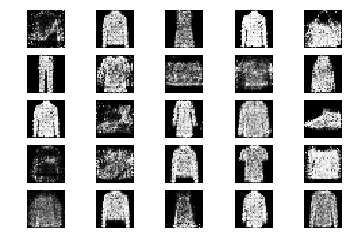

26401 [D loss: 0.620616, acc.: 65.62%] [G loss: 1.055218]
26402 [D loss: 0.671209, acc.: 60.94%] [G loss: 1.008278]
26403 [D loss: 0.641355, acc.: 59.38%] [G loss: 1.076182]
26404 [D loss: 0.622396, acc.: 60.94%] [G loss: 1.140061]
26405 [D loss: 0.576026, acc.: 76.56%] [G loss: 0.900054]
26406 [D loss: 0.658239, acc.: 67.19%] [G loss: 1.003197]
26407 [D loss: 0.673720, acc.: 57.81%] [G loss: 0.919298]
26408 [D loss: 0.634135, acc.: 60.94%] [G loss: 0.986122]
26409 [D loss: 0.659770, acc.: 65.62%] [G loss: 0.947327]
26410 [D loss: 0.641033, acc.: 62.50%] [G loss: 0.946724]
26411 [D loss: 0.706624, acc.: 51.56%] [G loss: 0.901141]
26412 [D loss: 0.657596, acc.: 53.12%] [G loss: 0.909683]
26413 [D loss: 0.740674, acc.: 48.44%] [G loss: 0.915268]
26414 [D loss: 0.675918, acc.: 57.81%] [G loss: 0.862147]
26415 [D loss: 0.626251, acc.: 67.19%] [G loss: 0.879421]
26416 [D loss: 0.617789, acc.: 60.94%] [G loss: 0.885658]
26417 [D loss: 0.600912, acc.: 65.62%] [G loss: 0.880251]
26418 [D loss:

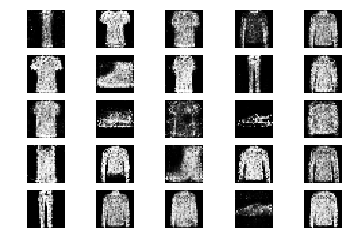

26601 [D loss: 0.670069, acc.: 62.50%] [G loss: 0.911309]
26602 [D loss: 0.662673, acc.: 70.31%] [G loss: 0.972610]
26603 [D loss: 0.672559, acc.: 59.38%] [G loss: 1.000247]
26604 [D loss: 0.558115, acc.: 68.75%] [G loss: 0.972453]
26605 [D loss: 0.648778, acc.: 60.94%] [G loss: 0.899474]
26606 [D loss: 0.638518, acc.: 59.38%] [G loss: 0.962377]
26607 [D loss: 0.627908, acc.: 71.88%] [G loss: 1.006844]
26608 [D loss: 0.647809, acc.: 65.62%] [G loss: 0.994026]
26609 [D loss: 0.629074, acc.: 68.75%] [G loss: 0.926955]
26610 [D loss: 0.612100, acc.: 67.19%] [G loss: 0.983416]
26611 [D loss: 0.591717, acc.: 70.31%] [G loss: 0.912934]
26612 [D loss: 0.647755, acc.: 60.94%] [G loss: 0.968044]
26613 [D loss: 0.686420, acc.: 67.19%] [G loss: 0.980971]
26614 [D loss: 0.639307, acc.: 53.12%] [G loss: 1.022319]
26615 [D loss: 0.655556, acc.: 59.38%] [G loss: 1.021738]
26616 [D loss: 0.582641, acc.: 73.44%] [G loss: 1.018224]
26617 [D loss: 0.615573, acc.: 67.19%] [G loss: 0.955807]
26618 [D loss:

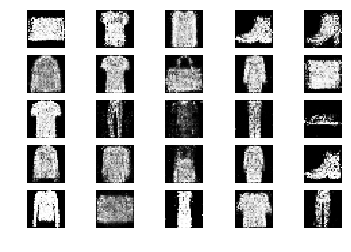

26801 [D loss: 0.642114, acc.: 65.62%] [G loss: 1.035669]
26802 [D loss: 0.565891, acc.: 75.00%] [G loss: 1.016887]
26803 [D loss: 0.664539, acc.: 54.69%] [G loss: 0.995134]
26804 [D loss: 0.604260, acc.: 70.31%] [G loss: 0.950396]
26805 [D loss: 0.639539, acc.: 59.38%] [G loss: 0.861149]
26806 [D loss: 0.586808, acc.: 68.75%] [G loss: 0.936113]
26807 [D loss: 0.626307, acc.: 62.50%] [G loss: 0.932183]
26808 [D loss: 0.746389, acc.: 57.81%] [G loss: 0.854937]
26809 [D loss: 0.624833, acc.: 67.19%] [G loss: 0.897129]
26810 [D loss: 0.661227, acc.: 59.38%] [G loss: 0.929359]
26811 [D loss: 0.636817, acc.: 57.81%] [G loss: 0.885241]
26812 [D loss: 0.589924, acc.: 67.19%] [G loss: 0.845104]
26813 [D loss: 0.623795, acc.: 65.62%] [G loss: 0.918460]
26814 [D loss: 0.696531, acc.: 59.38%] [G loss: 1.008646]
26815 [D loss: 0.718891, acc.: 54.69%] [G loss: 0.964074]
26816 [D loss: 0.556948, acc.: 76.56%] [G loss: 1.046665]
26817 [D loss: 0.633938, acc.: 68.75%] [G loss: 0.968092]
26818 [D loss:

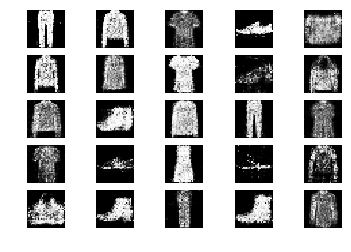

27001 [D loss: 0.666158, acc.: 57.81%] [G loss: 0.883245]
27002 [D loss: 0.681856, acc.: 62.50%] [G loss: 0.997311]
27003 [D loss: 0.649719, acc.: 65.62%] [G loss: 0.971948]
27004 [D loss: 0.668327, acc.: 60.94%] [G loss: 0.950581]
27005 [D loss: 0.622002, acc.: 59.38%] [G loss: 0.990693]
27006 [D loss: 0.661402, acc.: 59.38%] [G loss: 0.937522]
27007 [D loss: 0.680877, acc.: 57.81%] [G loss: 0.936740]
27008 [D loss: 0.629758, acc.: 64.06%] [G loss: 0.976717]
27009 [D loss: 0.639487, acc.: 59.38%] [G loss: 0.905273]
27010 [D loss: 0.612944, acc.: 67.19%] [G loss: 0.920110]
27011 [D loss: 0.692943, acc.: 60.94%] [G loss: 0.838813]
27012 [D loss: 0.637945, acc.: 65.62%] [G loss: 0.883053]
27013 [D loss: 0.582920, acc.: 70.31%] [G loss: 0.956205]
27014 [D loss: 0.643005, acc.: 62.50%] [G loss: 1.024156]
27015 [D loss: 0.706072, acc.: 56.25%] [G loss: 1.013268]
27016 [D loss: 0.625754, acc.: 67.19%] [G loss: 0.987111]
27017 [D loss: 0.615836, acc.: 75.00%] [G loss: 0.905669]
27018 [D loss:

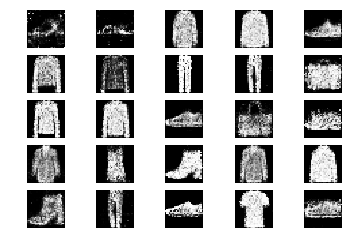

27201 [D loss: 0.648656, acc.: 54.69%] [G loss: 0.905993]
27202 [D loss: 0.627389, acc.: 64.06%] [G loss: 0.945114]
27203 [D loss: 0.651585, acc.: 59.38%] [G loss: 0.835138]
27204 [D loss: 0.673599, acc.: 56.25%] [G loss: 0.844191]
27205 [D loss: 0.625704, acc.: 65.62%] [G loss: 0.923236]
27206 [D loss: 0.656320, acc.: 56.25%] [G loss: 0.953369]
27207 [D loss: 0.637923, acc.: 68.75%] [G loss: 1.008042]
27208 [D loss: 0.652116, acc.: 60.94%] [G loss: 1.002736]
27209 [D loss: 0.647965, acc.: 59.38%] [G loss: 1.080376]
27210 [D loss: 0.694442, acc.: 51.56%] [G loss: 0.960104]
27211 [D loss: 0.679020, acc.: 53.12%] [G loss: 0.949841]
27212 [D loss: 0.586981, acc.: 68.75%] [G loss: 1.006501]
27213 [D loss: 0.721084, acc.: 48.44%] [G loss: 1.022728]
27214 [D loss: 0.667680, acc.: 60.94%] [G loss: 1.037711]
27215 [D loss: 0.729047, acc.: 46.88%] [G loss: 0.902712]
27216 [D loss: 0.588204, acc.: 68.75%] [G loss: 1.062860]
27217 [D loss: 0.656231, acc.: 60.94%] [G loss: 0.959421]
27218 [D loss:

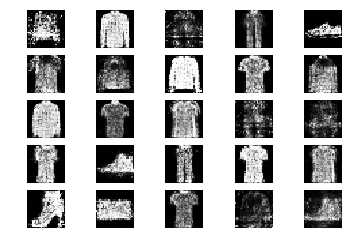

27401 [D loss: 0.691929, acc.: 60.94%] [G loss: 0.958792]
27402 [D loss: 0.632249, acc.: 68.75%] [G loss: 0.980475]
27403 [D loss: 0.679875, acc.: 62.50%] [G loss: 0.881175]
27404 [D loss: 0.646533, acc.: 59.38%] [G loss: 0.960908]
27405 [D loss: 0.650558, acc.: 65.62%] [G loss: 0.886431]
27406 [D loss: 0.618613, acc.: 65.62%] [G loss: 0.980944]
27407 [D loss: 0.646916, acc.: 62.50%] [G loss: 0.956154]
27408 [D loss: 0.714913, acc.: 54.69%] [G loss: 0.927866]
27409 [D loss: 0.616368, acc.: 64.06%] [G loss: 0.931169]
27410 [D loss: 0.662200, acc.: 59.38%] [G loss: 0.965922]
27411 [D loss: 0.687040, acc.: 50.00%] [G loss: 0.981571]
27412 [D loss: 0.710131, acc.: 57.81%] [G loss: 0.954471]
27413 [D loss: 0.657524, acc.: 62.50%] [G loss: 0.984900]
27414 [D loss: 0.691993, acc.: 56.25%] [G loss: 0.986107]
27415 [D loss: 0.646411, acc.: 64.06%] [G loss: 0.922572]
27416 [D loss: 0.685231, acc.: 62.50%] [G loss: 0.858035]
27417 [D loss: 0.657117, acc.: 64.06%] [G loss: 0.945793]
27418 [D loss:

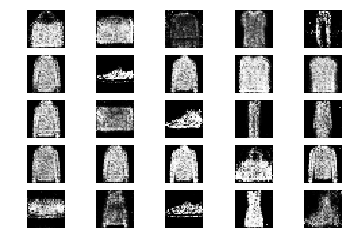

27601 [D loss: 0.660917, acc.: 54.69%] [G loss: 1.048114]
27602 [D loss: 0.618995, acc.: 65.62%] [G loss: 0.973706]
27603 [D loss: 0.618816, acc.: 67.19%] [G loss: 0.883190]
27604 [D loss: 0.671334, acc.: 59.38%] [G loss: 1.113621]
27605 [D loss: 0.649970, acc.: 57.81%] [G loss: 1.003833]
27606 [D loss: 0.632903, acc.: 56.25%] [G loss: 0.946943]
27607 [D loss: 0.656680, acc.: 60.94%] [G loss: 0.960739]
27608 [D loss: 0.652177, acc.: 62.50%] [G loss: 0.820443]
27609 [D loss: 0.660454, acc.: 65.62%] [G loss: 0.943388]
27610 [D loss: 0.666723, acc.: 67.19%] [G loss: 0.974622]
27611 [D loss: 0.716513, acc.: 54.69%] [G loss: 0.905551]
27612 [D loss: 0.639257, acc.: 59.38%] [G loss: 0.887131]
27613 [D loss: 0.651180, acc.: 64.06%] [G loss: 0.923914]
27614 [D loss: 0.680398, acc.: 60.94%] [G loss: 1.009231]
27615 [D loss: 0.602832, acc.: 64.06%] [G loss: 0.981638]
27616 [D loss: 0.602728, acc.: 65.62%] [G loss: 0.989300]
27617 [D loss: 0.610004, acc.: 65.62%] [G loss: 1.021871]
27618 [D loss:

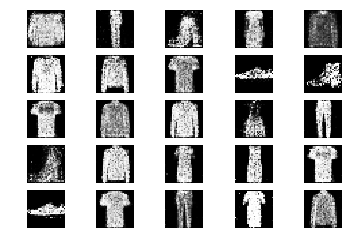

27801 [D loss: 0.660514, acc.: 59.38%] [G loss: 0.997402]
27802 [D loss: 0.670661, acc.: 64.06%] [G loss: 0.969614]
27803 [D loss: 0.665684, acc.: 60.94%] [G loss: 1.026904]
27804 [D loss: 0.594238, acc.: 75.00%] [G loss: 1.023647]
27805 [D loss: 0.591313, acc.: 65.62%] [G loss: 0.945838]
27806 [D loss: 0.653711, acc.: 62.50%] [G loss: 0.942392]
27807 [D loss: 0.646494, acc.: 64.06%] [G loss: 1.014786]
27808 [D loss: 0.619609, acc.: 65.62%] [G loss: 0.902681]
27809 [D loss: 0.637401, acc.: 64.06%] [G loss: 1.043659]
27810 [D loss: 0.647188, acc.: 65.62%] [G loss: 0.933594]
27811 [D loss: 0.631091, acc.: 56.25%] [G loss: 0.914145]
27812 [D loss: 0.670154, acc.: 51.56%] [G loss: 0.952841]
27813 [D loss: 0.586537, acc.: 68.75%] [G loss: 0.936387]
27814 [D loss: 0.609365, acc.: 67.19%] [G loss: 0.965064]
27815 [D loss: 0.738997, acc.: 53.12%] [G loss: 0.900647]
27816 [D loss: 0.644943, acc.: 62.50%] [G loss: 0.942892]
27817 [D loss: 0.659559, acc.: 62.50%] [G loss: 0.934110]
27818 [D loss:

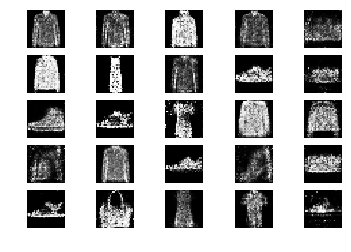

28001 [D loss: 0.622454, acc.: 57.81%] [G loss: 0.914055]
28002 [D loss: 0.678349, acc.: 64.06%] [G loss: 0.921445]
28003 [D loss: 0.544773, acc.: 75.00%] [G loss: 0.962806]
28004 [D loss: 0.674612, acc.: 59.38%] [G loss: 0.898035]
28005 [D loss: 0.662763, acc.: 60.94%] [G loss: 0.942640]
28006 [D loss: 0.637724, acc.: 53.12%] [G loss: 0.883540]
28007 [D loss: 0.635975, acc.: 65.62%] [G loss: 1.020119]
28008 [D loss: 0.713710, acc.: 54.69%] [G loss: 1.000211]
28009 [D loss: 0.602520, acc.: 70.31%] [G loss: 1.044903]
28010 [D loss: 0.601958, acc.: 71.88%] [G loss: 1.081581]
28011 [D loss: 0.554521, acc.: 76.56%] [G loss: 1.082452]
28012 [D loss: 0.619271, acc.: 59.38%] [G loss: 0.971632]
28013 [D loss: 0.603098, acc.: 68.75%] [G loss: 1.019921]
28014 [D loss: 0.601257, acc.: 65.62%] [G loss: 0.925085]
28015 [D loss: 0.585257, acc.: 70.31%] [G loss: 0.848626]
28016 [D loss: 0.547771, acc.: 67.19%] [G loss: 0.973561]
28017 [D loss: 0.554090, acc.: 73.44%] [G loss: 0.911620]
28018 [D loss:

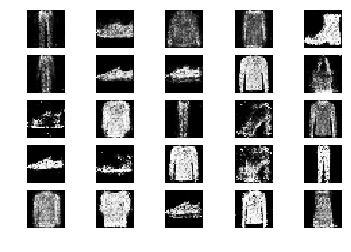

28201 [D loss: 0.651291, acc.: 59.38%] [G loss: 1.125250]
28202 [D loss: 0.674560, acc.: 59.38%] [G loss: 1.004115]
28203 [D loss: 0.648939, acc.: 65.62%] [G loss: 0.914907]
28204 [D loss: 0.665580, acc.: 53.12%] [G loss: 0.915285]
28205 [D loss: 0.698707, acc.: 57.81%] [G loss: 0.942979]
28206 [D loss: 0.643004, acc.: 62.50%] [G loss: 0.872748]
28207 [D loss: 0.682671, acc.: 64.06%] [G loss: 0.995874]
28208 [D loss: 0.679803, acc.: 57.81%] [G loss: 0.945074]
28209 [D loss: 0.688100, acc.: 51.56%] [G loss: 1.020829]
28210 [D loss: 0.649226, acc.: 59.38%] [G loss: 0.937832]
28211 [D loss: 0.637147, acc.: 65.62%] [G loss: 0.914459]
28212 [D loss: 0.660844, acc.: 60.94%] [G loss: 0.951713]
28213 [D loss: 0.603181, acc.: 68.75%] [G loss: 0.939444]
28214 [D loss: 0.657223, acc.: 60.94%] [G loss: 1.019347]
28215 [D loss: 0.664007, acc.: 60.94%] [G loss: 0.978099]
28216 [D loss: 0.641190, acc.: 67.19%] [G loss: 1.084606]
28217 [D loss: 0.626730, acc.: 64.06%] [G loss: 0.990341]
28218 [D loss:

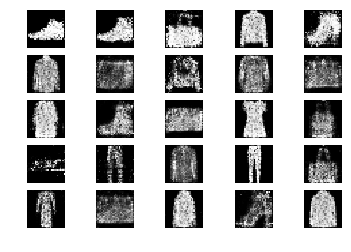

28401 [D loss: 0.672671, acc.: 59.38%] [G loss: 0.874568]
28402 [D loss: 0.655554, acc.: 60.94%] [G loss: 0.950724]
28403 [D loss: 0.573641, acc.: 76.56%] [G loss: 0.961134]
28404 [D loss: 0.670407, acc.: 60.94%] [G loss: 0.868677]
28405 [D loss: 0.658709, acc.: 56.25%] [G loss: 0.960900]
28406 [D loss: 0.648069, acc.: 57.81%] [G loss: 1.033999]
28407 [D loss: 0.615014, acc.: 67.19%] [G loss: 0.887831]
28408 [D loss: 0.570299, acc.: 73.44%] [G loss: 0.843738]
28409 [D loss: 0.684784, acc.: 56.25%] [G loss: 0.902351]
28410 [D loss: 0.644911, acc.: 64.06%] [G loss: 0.987669]
28411 [D loss: 0.574567, acc.: 76.56%] [G loss: 0.999701]
28412 [D loss: 0.642105, acc.: 59.38%] [G loss: 0.928846]
28413 [D loss: 0.656161, acc.: 60.94%] [G loss: 0.960389]
28414 [D loss: 0.659595, acc.: 59.38%] [G loss: 1.027530]
28415 [D loss: 0.693399, acc.: 53.12%] [G loss: 0.949808]
28416 [D loss: 0.661773, acc.: 59.38%] [G loss: 0.948468]
28417 [D loss: 0.742957, acc.: 54.69%] [G loss: 0.824917]
28418 [D loss:

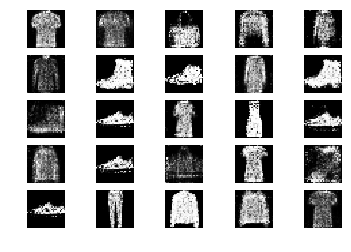

28601 [D loss: 0.613848, acc.: 64.06%] [G loss: 0.916555]
28602 [D loss: 0.621355, acc.: 64.06%] [G loss: 0.955068]
28603 [D loss: 0.602865, acc.: 70.31%] [G loss: 0.935102]
28604 [D loss: 0.680334, acc.: 59.38%] [G loss: 0.892240]
28605 [D loss: 0.664965, acc.: 62.50%] [G loss: 0.874240]
28606 [D loss: 0.611587, acc.: 67.19%] [G loss: 0.939443]
28607 [D loss: 0.627013, acc.: 68.75%] [G loss: 0.924847]
28608 [D loss: 0.661930, acc.: 51.56%] [G loss: 0.840243]
28609 [D loss: 0.611316, acc.: 60.94%] [G loss: 0.936198]
28610 [D loss: 0.596707, acc.: 68.75%] [G loss: 1.022672]
28611 [D loss: 0.674383, acc.: 62.50%] [G loss: 0.979523]
28612 [D loss: 0.711942, acc.: 53.12%] [G loss: 0.867003]
28613 [D loss: 0.632702, acc.: 68.75%] [G loss: 0.988891]
28614 [D loss: 0.571952, acc.: 68.75%] [G loss: 0.965193]
28615 [D loss: 0.680622, acc.: 62.50%] [G loss: 0.927226]
28616 [D loss: 0.617195, acc.: 64.06%] [G loss: 1.093109]
28617 [D loss: 0.616729, acc.: 64.06%] [G loss: 1.001322]
28618 [D loss:

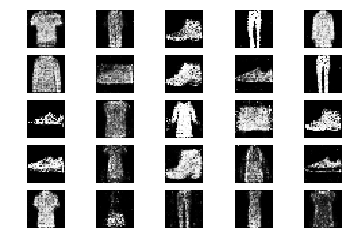

28801 [D loss: 0.610772, acc.: 67.19%] [G loss: 1.001244]
28802 [D loss: 0.623779, acc.: 67.19%] [G loss: 0.910558]
28803 [D loss: 0.644753, acc.: 60.94%] [G loss: 0.905464]
28804 [D loss: 0.619239, acc.: 60.94%] [G loss: 0.946115]
28805 [D loss: 0.565808, acc.: 70.31%] [G loss: 0.975478]
28806 [D loss: 0.703177, acc.: 51.56%] [G loss: 0.985784]
28807 [D loss: 0.692662, acc.: 57.81%] [G loss: 1.031700]
28808 [D loss: 0.586668, acc.: 70.31%] [G loss: 0.931972]
28809 [D loss: 0.685396, acc.: 60.94%] [G loss: 0.916823]
28810 [D loss: 0.651601, acc.: 59.38%] [G loss: 0.983351]
28811 [D loss: 0.611760, acc.: 64.06%] [G loss: 0.936295]
28812 [D loss: 0.657640, acc.: 60.94%] [G loss: 0.911652]
28813 [D loss: 0.639062, acc.: 67.19%] [G loss: 0.994767]
28814 [D loss: 0.599971, acc.: 68.75%] [G loss: 0.925610]
28815 [D loss: 0.531102, acc.: 76.56%] [G loss: 0.890596]
28816 [D loss: 0.661675, acc.: 64.06%] [G loss: 0.911480]
28817 [D loss: 0.616948, acc.: 60.94%] [G loss: 0.853895]
28818 [D loss:

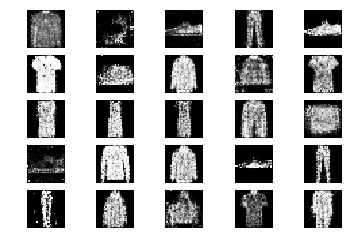

29001 [D loss: 0.614334, acc.: 67.19%] [G loss: 0.952619]
29002 [D loss: 0.602143, acc.: 68.75%] [G loss: 0.970698]
29003 [D loss: 0.704255, acc.: 51.56%] [G loss: 0.983121]
29004 [D loss: 0.609409, acc.: 67.19%] [G loss: 1.023187]
29005 [D loss: 0.661944, acc.: 65.62%] [G loss: 0.831958]
29006 [D loss: 0.649267, acc.: 64.06%] [G loss: 0.933915]
29007 [D loss: 0.583316, acc.: 68.75%] [G loss: 0.983166]
29008 [D loss: 0.635245, acc.: 65.62%] [G loss: 1.037903]
29009 [D loss: 0.660911, acc.: 57.81%] [G loss: 0.935946]
29010 [D loss: 0.609423, acc.: 70.31%] [G loss: 1.069181]
29011 [D loss: 0.567581, acc.: 64.06%] [G loss: 0.948532]
29012 [D loss: 0.708164, acc.: 46.88%] [G loss: 0.953017]
29013 [D loss: 0.696713, acc.: 56.25%] [G loss: 1.000069]
29014 [D loss: 0.645897, acc.: 62.50%] [G loss: 1.070611]
29015 [D loss: 0.578648, acc.: 75.00%] [G loss: 1.090678]
29016 [D loss: 0.660601, acc.: 54.69%] [G loss: 1.087585]
29017 [D loss: 0.627003, acc.: 65.62%] [G loss: 0.974216]
29018 [D loss:

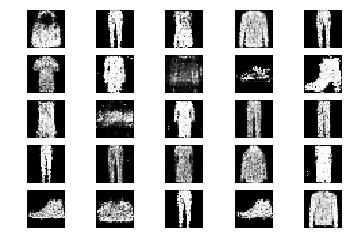

29201 [D loss: 0.603579, acc.: 60.94%] [G loss: 0.996078]
29202 [D loss: 0.739702, acc.: 56.25%] [G loss: 1.018494]
29203 [D loss: 0.666324, acc.: 59.38%] [G loss: 0.932302]
29204 [D loss: 0.572657, acc.: 76.56%] [G loss: 0.849697]
29205 [D loss: 0.631141, acc.: 64.06%] [G loss: 0.972384]
29206 [D loss: 0.588895, acc.: 64.06%] [G loss: 0.949980]
29207 [D loss: 0.616911, acc.: 67.19%] [G loss: 0.899097]
29208 [D loss: 0.663926, acc.: 62.50%] [G loss: 0.936109]
29209 [D loss: 0.646671, acc.: 65.62%] [G loss: 1.020166]
29210 [D loss: 0.590585, acc.: 70.31%] [G loss: 0.913589]
29211 [D loss: 0.691748, acc.: 57.81%] [G loss: 1.073059]
29212 [D loss: 0.650383, acc.: 62.50%] [G loss: 0.916053]
29213 [D loss: 0.595993, acc.: 75.00%] [G loss: 0.938685]
29214 [D loss: 0.684268, acc.: 56.25%] [G loss: 0.993683]
29215 [D loss: 0.618445, acc.: 62.50%] [G loss: 1.015787]
29216 [D loss: 0.594768, acc.: 73.44%] [G loss: 0.984198]
29217 [D loss: 0.571347, acc.: 67.19%] [G loss: 1.049861]
29218 [D loss:

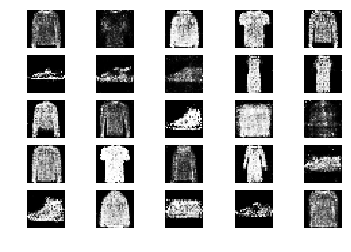

29401 [D loss: 0.579088, acc.: 71.88%] [G loss: 0.947193]
29402 [D loss: 0.666861, acc.: 60.94%] [G loss: 1.039695]
29403 [D loss: 0.623441, acc.: 67.19%] [G loss: 0.915984]
29404 [D loss: 0.563049, acc.: 76.56%] [G loss: 1.030551]
29405 [D loss: 0.616206, acc.: 60.94%] [G loss: 0.960051]
29406 [D loss: 0.558126, acc.: 71.88%] [G loss: 1.044832]
29407 [D loss: 0.653787, acc.: 60.94%] [G loss: 0.951699]
29408 [D loss: 0.663603, acc.: 60.94%] [G loss: 1.008928]
29409 [D loss: 0.744707, acc.: 56.25%] [G loss: 0.876779]
29410 [D loss: 0.631079, acc.: 64.06%] [G loss: 0.902076]
29411 [D loss: 0.660482, acc.: 59.38%] [G loss: 0.951106]
29412 [D loss: 0.666390, acc.: 56.25%] [G loss: 0.973745]
29413 [D loss: 0.596604, acc.: 62.50%] [G loss: 0.954862]
29414 [D loss: 0.710100, acc.: 48.44%] [G loss: 0.957547]
29415 [D loss: 0.695459, acc.: 57.81%] [G loss: 0.856576]
29416 [D loss: 0.573520, acc.: 71.88%] [G loss: 0.928028]
29417 [D loss: 0.695443, acc.: 59.38%] [G loss: 1.027351]
29418 [D loss:

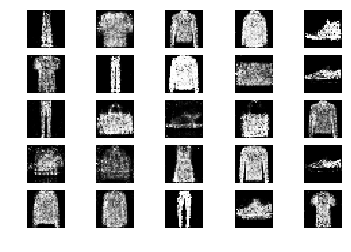

29601 [D loss: 0.606114, acc.: 64.06%] [G loss: 0.964837]
29602 [D loss: 0.632670, acc.: 71.88%] [G loss: 0.906376]
29603 [D loss: 0.640498, acc.: 57.81%] [G loss: 0.859003]
29604 [D loss: 0.581549, acc.: 68.75%] [G loss: 0.949645]
29605 [D loss: 0.627578, acc.: 64.06%] [G loss: 0.938560]
29606 [D loss: 0.746084, acc.: 51.56%] [G loss: 1.026552]
29607 [D loss: 0.638219, acc.: 65.62%] [G loss: 1.040465]
29608 [D loss: 0.594239, acc.: 71.88%] [G loss: 0.936890]
29609 [D loss: 0.678320, acc.: 51.56%] [G loss: 0.935346]
29610 [D loss: 0.582581, acc.: 65.62%] [G loss: 0.893782]
29611 [D loss: 0.667176, acc.: 56.25%] [G loss: 0.941324]
29612 [D loss: 0.640830, acc.: 67.19%] [G loss: 0.989083]
29613 [D loss: 0.602347, acc.: 71.88%] [G loss: 0.938307]
29614 [D loss: 0.591586, acc.: 75.00%] [G loss: 0.903739]
29615 [D loss: 0.690726, acc.: 53.12%] [G loss: 0.913459]
29616 [D loss: 0.597699, acc.: 67.19%] [G loss: 0.866966]
29617 [D loss: 0.646113, acc.: 60.94%] [G loss: 0.919553]
29618 [D loss:

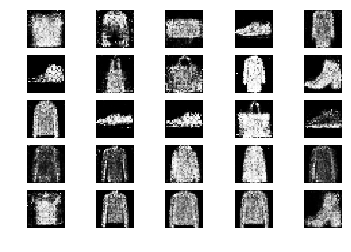

29801 [D loss: 0.672683, acc.: 57.81%] [G loss: 0.899407]
29802 [D loss: 0.613731, acc.: 62.50%] [G loss: 1.026440]
29803 [D loss: 0.577020, acc.: 67.19%] [G loss: 0.995491]
29804 [D loss: 0.675497, acc.: 54.69%] [G loss: 1.019351]
29805 [D loss: 0.674779, acc.: 59.38%] [G loss: 1.011705]
29806 [D loss: 0.655579, acc.: 62.50%] [G loss: 0.977566]
29807 [D loss: 0.691298, acc.: 53.12%] [G loss: 1.006997]
29808 [D loss: 0.638630, acc.: 59.38%] [G loss: 1.056352]
29809 [D loss: 0.604809, acc.: 73.44%] [G loss: 1.015521]
29810 [D loss: 0.647956, acc.: 60.94%] [G loss: 1.015852]
29811 [D loss: 0.634578, acc.: 67.19%] [G loss: 0.980874]
29812 [D loss: 0.659497, acc.: 62.50%] [G loss: 0.958304]
29813 [D loss: 0.612240, acc.: 68.75%] [G loss: 0.998603]
29814 [D loss: 0.610446, acc.: 67.19%] [G loss: 0.968012]
29815 [D loss: 0.568635, acc.: 73.44%] [G loss: 0.899695]
29816 [D loss: 0.689956, acc.: 54.69%] [G loss: 1.006720]
29817 [D loss: 0.624974, acc.: 64.06%] [G loss: 1.035872]
29818 [D loss:

In [0]:
gan = GAN()
gan.train(epochs=30000, batch_size=32, sample_interval=200)